In [1]:
from matplotlib import pyplot as plt
import numpy as np
import torch
import sys
sys.path.insert(0, '..')
from models import Classifier, WeightedMSE, FlatLoss, Disco
from utils import Metrics, find_threshold, DataSet, Logger
from utils import LegendreFitter, LegendreIntegral
from torch.autograd import gradcheck
torch.manual_seed(72)
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
torch.cuda.ipc_collect()
#device = "cpu"

In [2]:
 def plot_stuff(model,X,y,x_biased,mbins=100,histbins=None,name='Naive DNN'):
    if histbins == None:
        histbins=mbins
    predictions = np.array(model(X).tolist()).flatten()
    metrics_test = Metrics(validation=True)
    metrics_test.calculate(pred=predictions, target=y,m=x_biased)
    R50 = metrics_test.R50[0]
    JSD = metrics_test.JSD[0]
    x_biased = (x_biased+1)*0.5 *250 
    
    c = find_threshold(predictions,(y==0),0.5)
    fig, [ax,ax1] = plt.subplots(2,1,figsize=(6,8),dpi=120,sharex=True)
    _,bins,_ = ax.hist(x_biased[(y==1)],bins=histbins,alpha=0.3,color='C1',label='Background',density=True,log=True)
    ax.hist(x_biased[(y==1)&(predictions<c)],bins=bins,alpha=0.3,color='C0',label='False Positives',density=True,log=True)
    ax.set_ylabel("Normed Counts",fontsize=20)
    ax.set_title('{} (R50:{:.2f}, 1/JSD:{:.2f})'.format(name,R50,1/JSD))
    ax.legend()

    efficiencies = np.linspace(0.1,0.9,9)
    cuts = []
    for eff in efficiencies:
        cuts.append(find_threshold(predictions,(y==0),eff))
    m = x_biased[y==1]
    sorted_m = np.argsort(m)
    scores = predictions[y==1][sorted_m].reshape(mbins,-1)
    m = m[sorted_m]
    m = m.reshape(mbins,-1).mean(axis=1)
    for j,cut in enumerate(cuts):
        c = f"C{j}" #if j!= 6 else f"C11"
        passed = (scores<cut).sum(axis=1)/scores.shape[1]
        ax1.plot(m,passed,label="{:0.1f} ({:0.2f})".format(efficiencies[j],cut),alpha=0.9,c=c,lw=1)
    ax1.set_ylabel(r"$\mathrm{passing\, events}/\mathrm{events\,in\, bin}$",fontsize=14)
    ax1.set_ylim([-0.02,1.02])
    ax1.legend(loc='upper right', bbox_to_anchor=(1,1) ,markerscale=5,title="SE (Cut)",ncol=1)
    ax1.set_xlabel(r"$m$",fontsize=14)
    fig.tight_layout(pad=0)
    plt.show()
    return (1/JSD,R50)

In [3]:
# mbins = 10
# mcontent = 4
# li = LegendreIntegral.apply
# fitter = LegendreFitter(mbins=mbins,power=2)
# inputTensor = torch.DoubleTensor(np.random.rand(mbins,mcontent)).sort(axis=1)[0]
# inputTensor.requires_grad_(True)
# sbins = 1000
# integral = li(inputTensor,fitter,sbins
#              )
# integral
# gradcheck(li,(inputTensor,fitter,sbins
#              ),eps=0.01,atol=0.01)

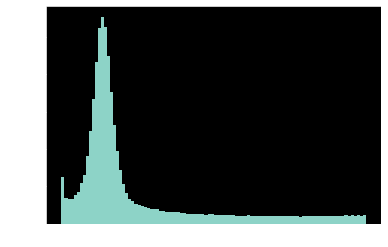

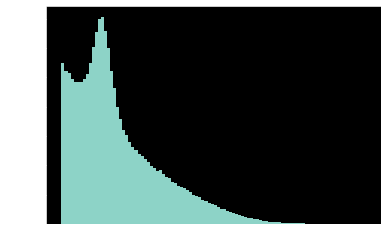

device: cuda:0


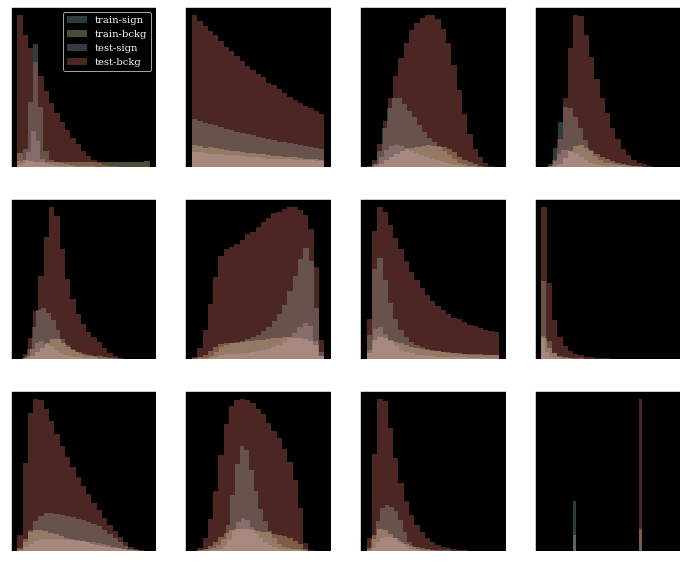

In [4]:
#dataset 
files = np.load("data/W_FCN_v0.npz")
train = files["train"].astype('float32')
val = files["val"].astype('float32')

train_labels = train[::,-1]
val_labels   = val[::,-1]

maxdata = train.max(axis=0)
mindata = train.min(axis=0)
train = (train-mindata)/(maxdata-mindata)
train[::,0] = 2*train[::,0]-1
#train[::,0][train_labels==1] = 2*(np.argsort(train[::,0][train_labels==1]))/(train_labels==1).sum()-1
train[::,0][train_labels==1] = 2*((train[::,0][train_labels==1]))**2-1

plt.hist(train[::,0],bins=100)
plt.show()

maxdata = val.max(axis=0)
mindata = val.min(axis=0)
val = (val-mindata)/(maxdata-mindata)
val[::,0] = 2*val[::,0]-1
plt.hist(val[::,0],bins=100)
plt.show()

traindataset = DataSet(samples=train[::,1:-1],
                       labels=train_labels,
                       m = train[::,0])
valdataset = DataSet(samples=val[:,1:-1],
                     labels=val_labels,
                    m = val[::,0])
test = files["test"]
test_labels=test[::,-1]
maxdata = test.max(axis=0)
mindata = test.min(axis=0)
test = (test-mindata)/(maxdata-mindata)
test[::,0] = 2*test[::,0]-1
X = torch.from_numpy(test[:,1:11]).float().to(device)

print('device:', device)



# maxdata = val.max(axis=0)
# mindata = val.min(axis=0)
# val = (val-mindata)/(maxdata-mindata)

# m,dm = np.histogram(train[::,0],bins=train.shape[0],density=True)
# train[::,0] = np.cumsum(m*(dm[1]-dm[0]))
# m,dm = np.histogram(val[::,0],bins=val.shape[0],density=True)
# val[::,0] = np.cumsum(m*(dm[1]-dm[0]))
# m = train[::,0].argsort()
# m = m/m.size
#train[::,0] = 2*train[::,0]-1
# m = val[::,0].argsort()
# m = m/m.size
# val[::,0] = 2*m-1
fig, axes = plt.subplots(3,4,figsize=(12,10))
for i,ax in enumerate(axes.flatten()):
    ax.hist(train[:,i][train[:,-1]==0],bins=25,alpha=0.3,label='train-sign')
    ax.hist(train[:,i][train[:,-1]==1],bins=25,alpha=0.3,label='train-bckg')
    ax.hist(test[:,i][test[:,-1]==0],bins=25,alpha=0.3,label='test-sign')
    ax.hist(test[:,i][test[:,-1]==1],bins=25,alpha=0.3,label='test-bckg')
    ax.set_yticks([])
    if i==0: ax.legend()
    

In [5]:
params = {'epochs'     : 200,
          'interval'   : 200,
          'batch_size' : 2048,
          'shuffle'    : True,
          'num_workers': 6,
          'drop_last'  :True,
          'device'     : device,
          'pass_x_biased':True,
         }

# Flat bins 

Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (336.2s)
 Train: loss:0.1900, acc:80% || Val: loss: 0.0546, acc:84%, R50: 23.2755, 1/JSD: 1.3064


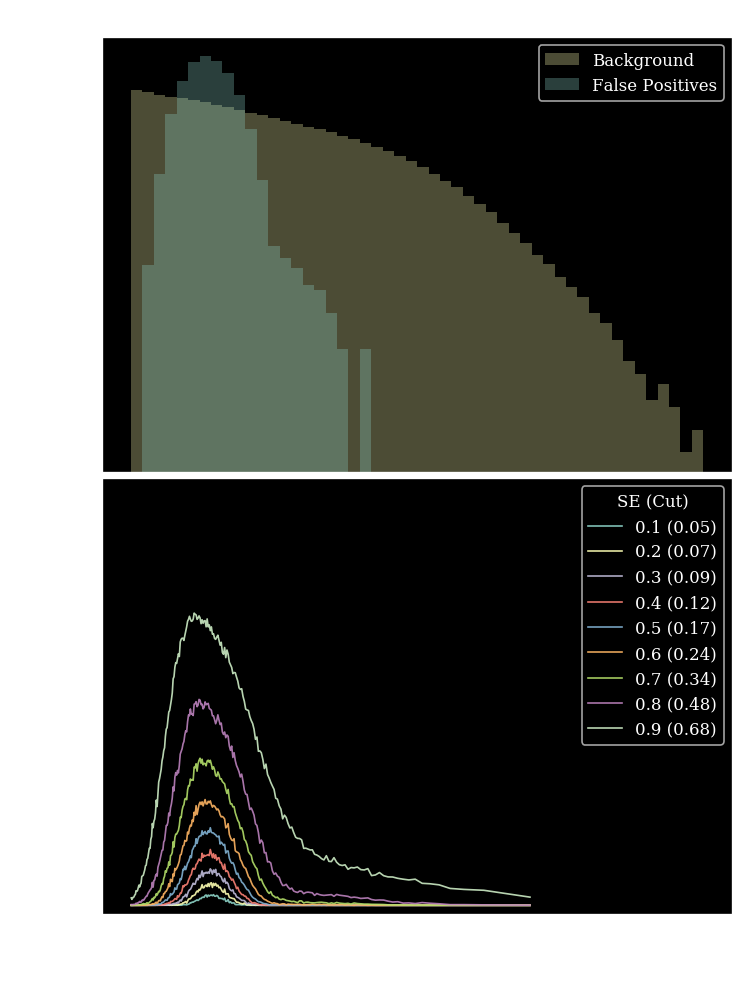

Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (343.7s)
 Train: loss:0.2743, acc:78% || Val: loss: 0.0598, acc:82%, R50: 18.8034, 1/JSD: 2.2803


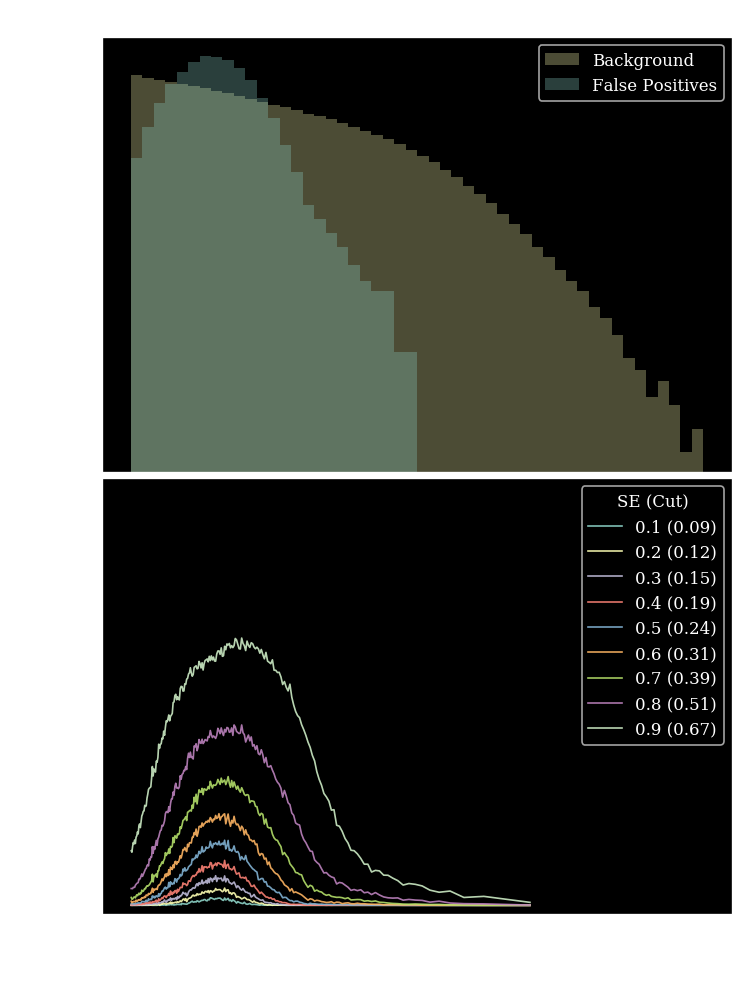

Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (371.2s)
 Train: loss:0.3038, acc:71% || Val: loss: 0.0713, acc:80%, R50: 10.4666, 1/JSD: 141.7252


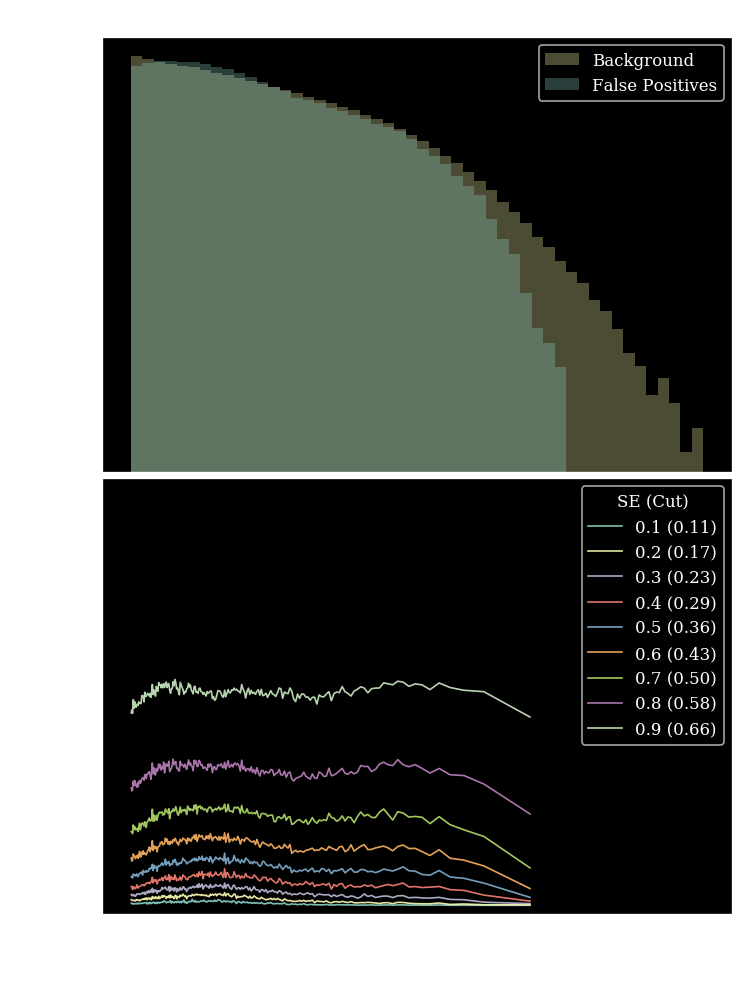

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (355.5s)
 Train: loss:0.3224, acc:65% || Val: loss: 0.0777, acc:83%, R50: 10.9799, 1/JSD: 96.9455


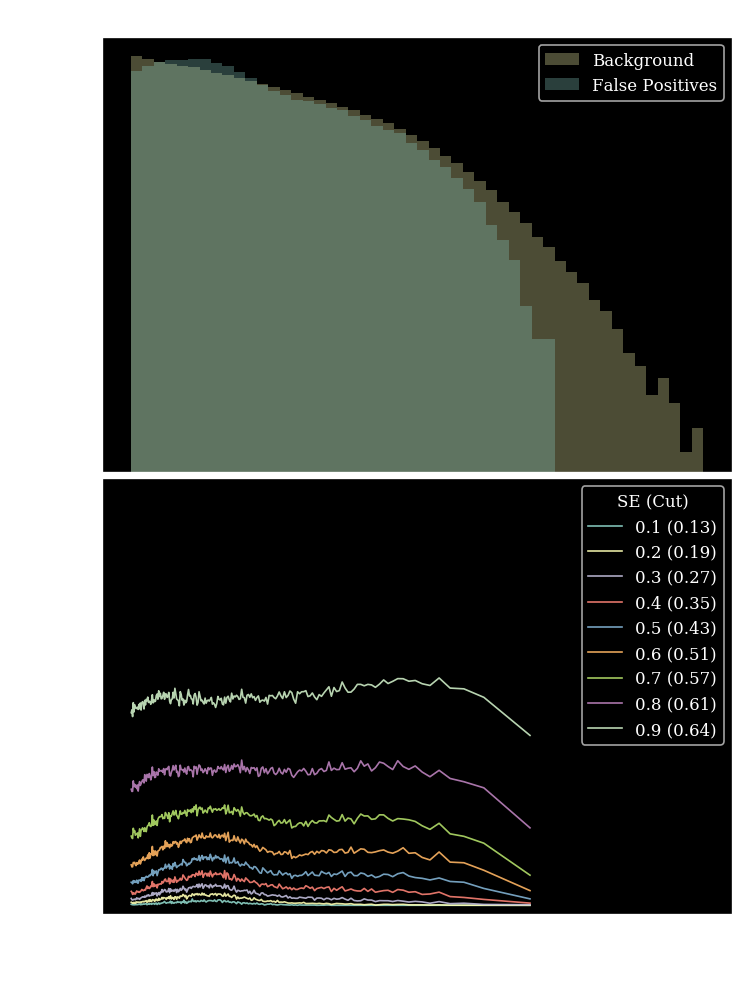

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (354.0s)
 Train: loss:0.4843, acc:48% || Val: loss: 0.0949, acc:84%, R50: 2.6919, 1/JSD: 169.8740


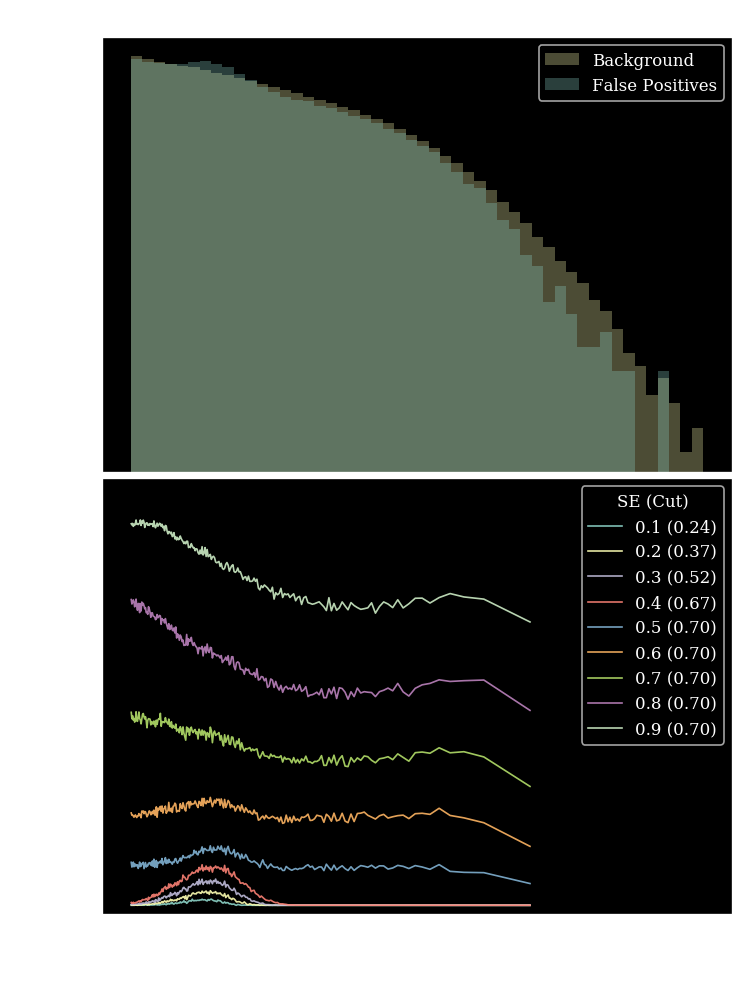

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (361.0s)
 Train: loss:0.5080, acc:45% || Val: loss: 0.1012, acc:83%, R50: 3.5225, 1/JSD: 73.6396


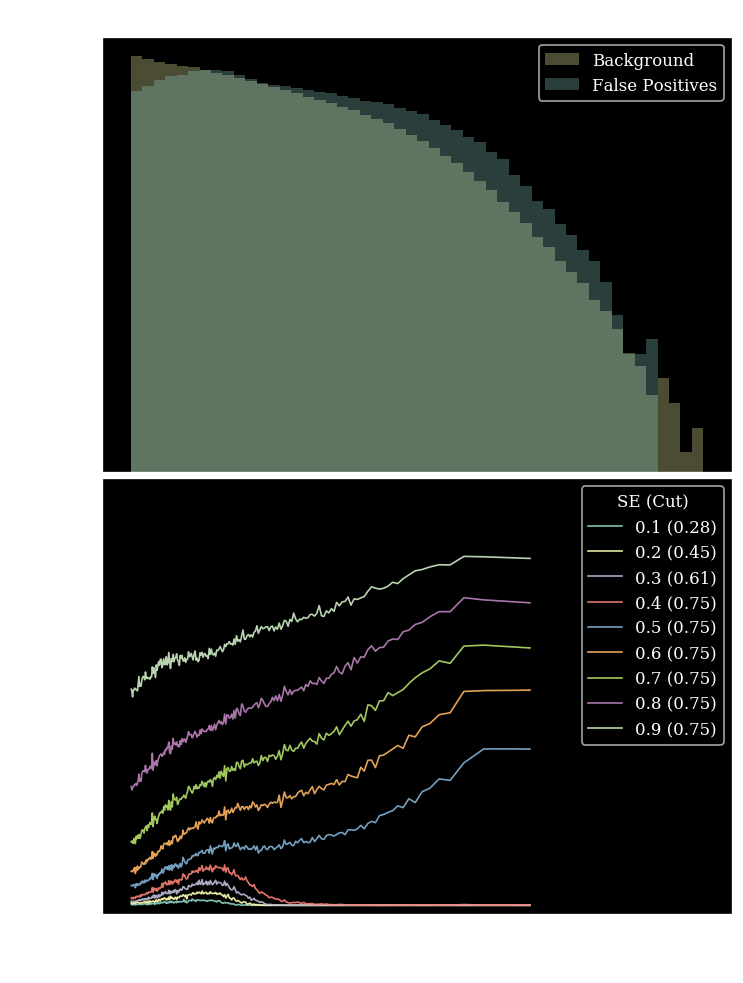

Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (361.3s)
 Train: loss:0.4840, acc:39% || Val: loss: 0.1230, acc:82%, R50: 5.7869, 1/JSD: 21.3242


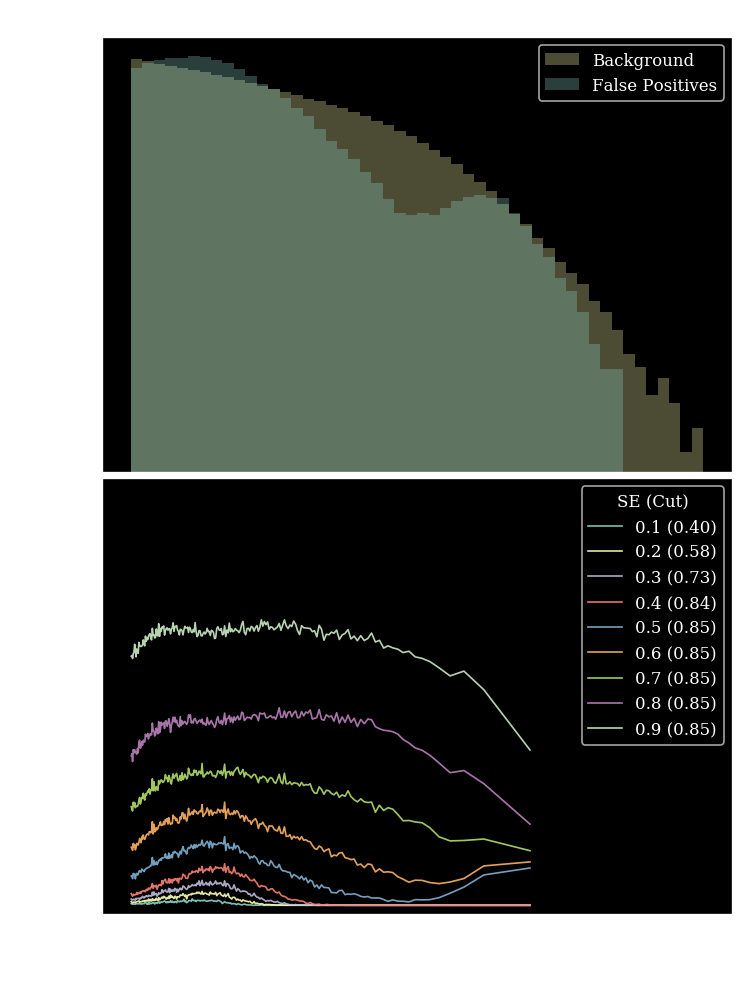

Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (360.6s)
 Train: loss:0.5300, acc:34% || Val: loss: 0.1460, acc:81%, R50: 7.3551, 1/JSD: 11.4948


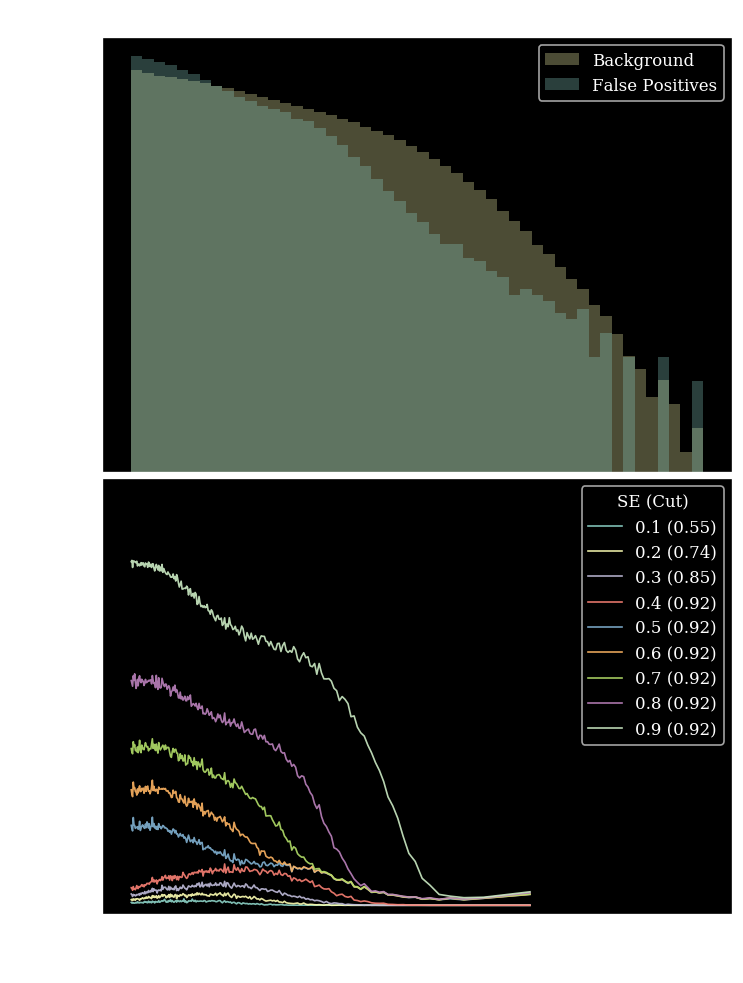

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (361.0s)
 Train: loss:0.6372, acc:33% || Val: loss: 0.1744, acc:81%, R50: 9.7285, 1/JSD: 18.2125


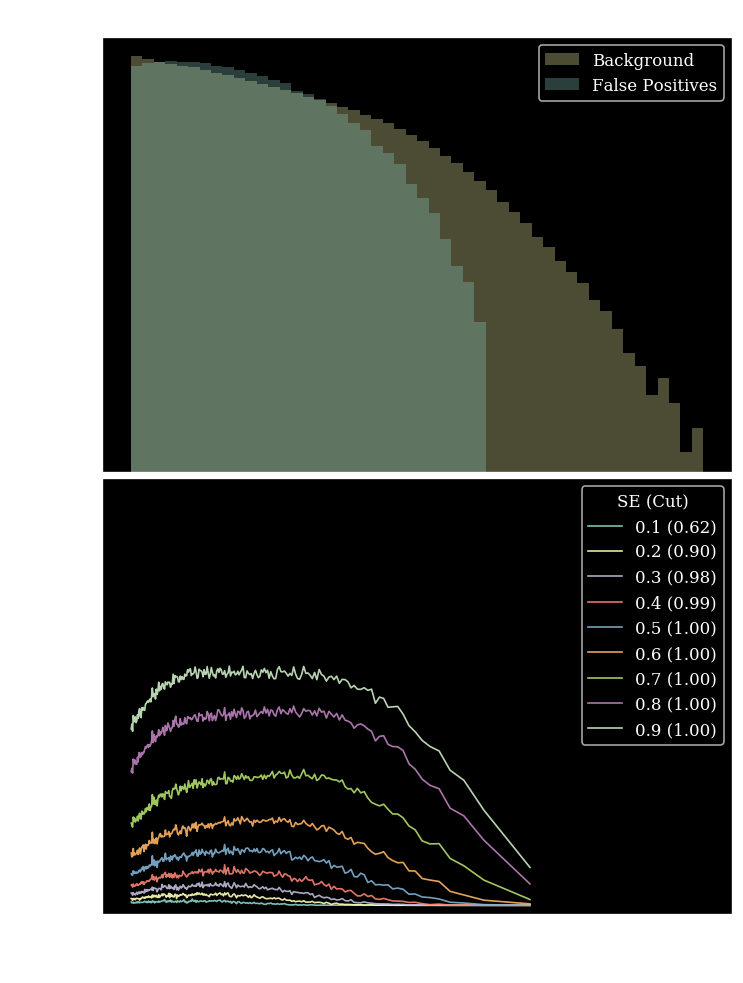

Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (358.7s)
 Train: loss:0.7100, acc:29% || Val: loss: 0.1951, acc:80%, R50: 82500.0000, 1/JSD: 2.4824


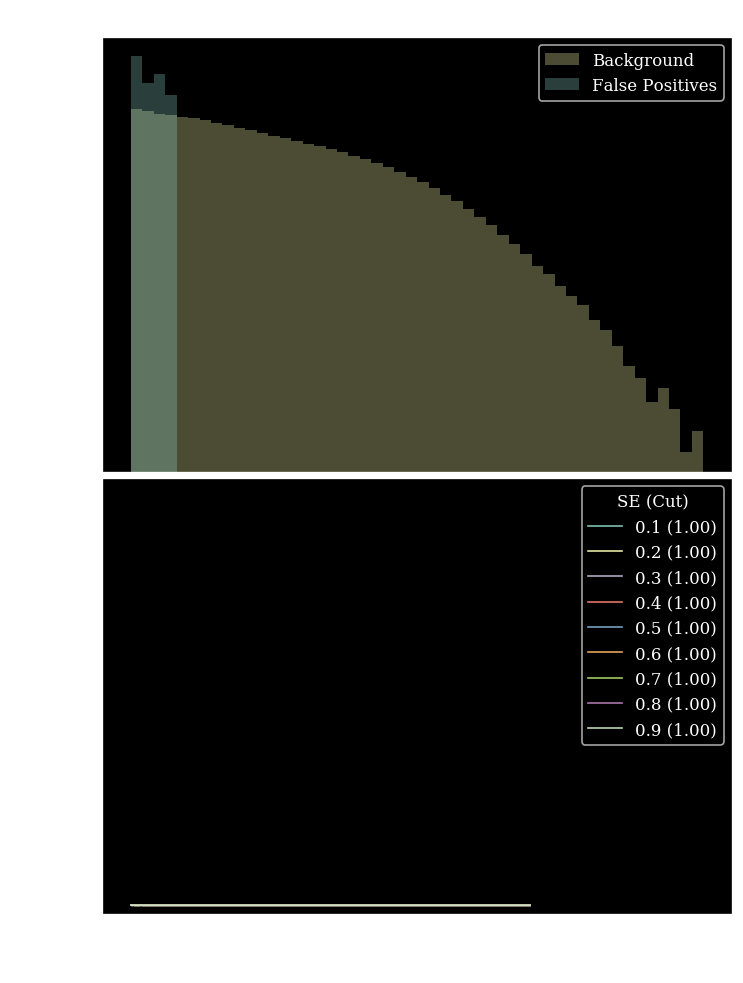

Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (378.4s)
 Train: loss:0.7100, acc:29% || Val: loss: 0.1951, acc:80%, R50: 330000.0000, 1/JSD: 1.0929


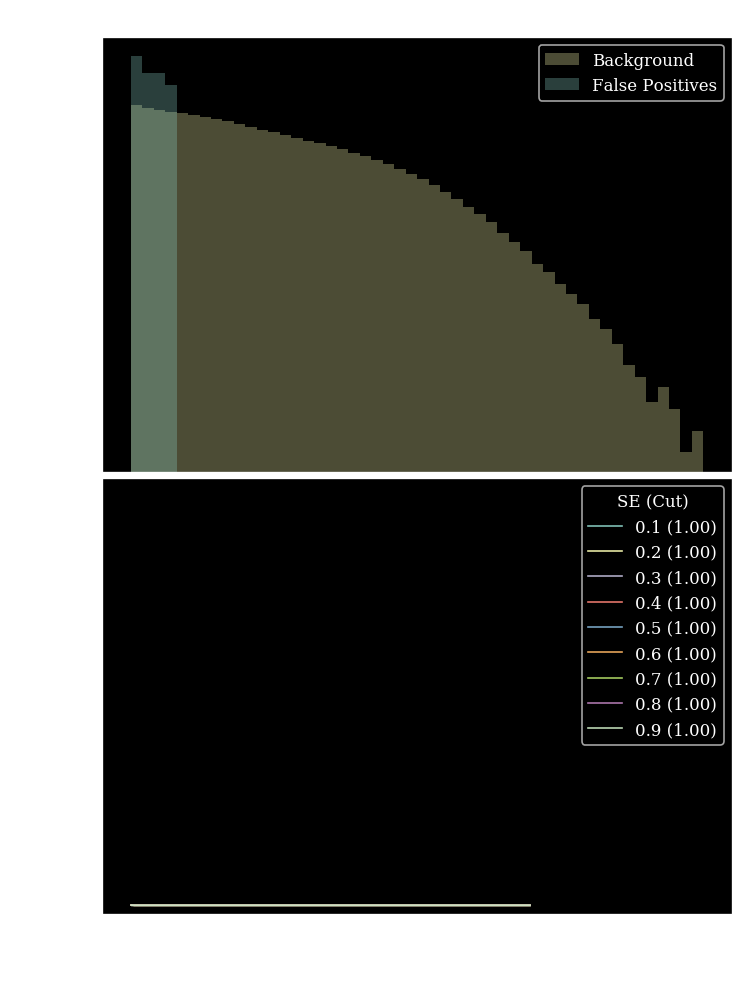

In [6]:
jsdR50flat = []
for i,bins in enumerate([1,2,5,10,50,60,75,85,100,110,120]):
    frac=50
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)
    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=1,bins=bins,memory=False)
    log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    model_L.train(False)
    out=plot_stuff(model=model_L,name=f"Flat DNN bins:{bins}",X=X,
                   y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
    jsdR50flat.append(out)

# Flat str

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (364.0s)
 Train: loss:0.2257, acc:78% || Val: loss: 0.0597, acc:84%, R50: 22.1551, 1/JSD: 1.5320


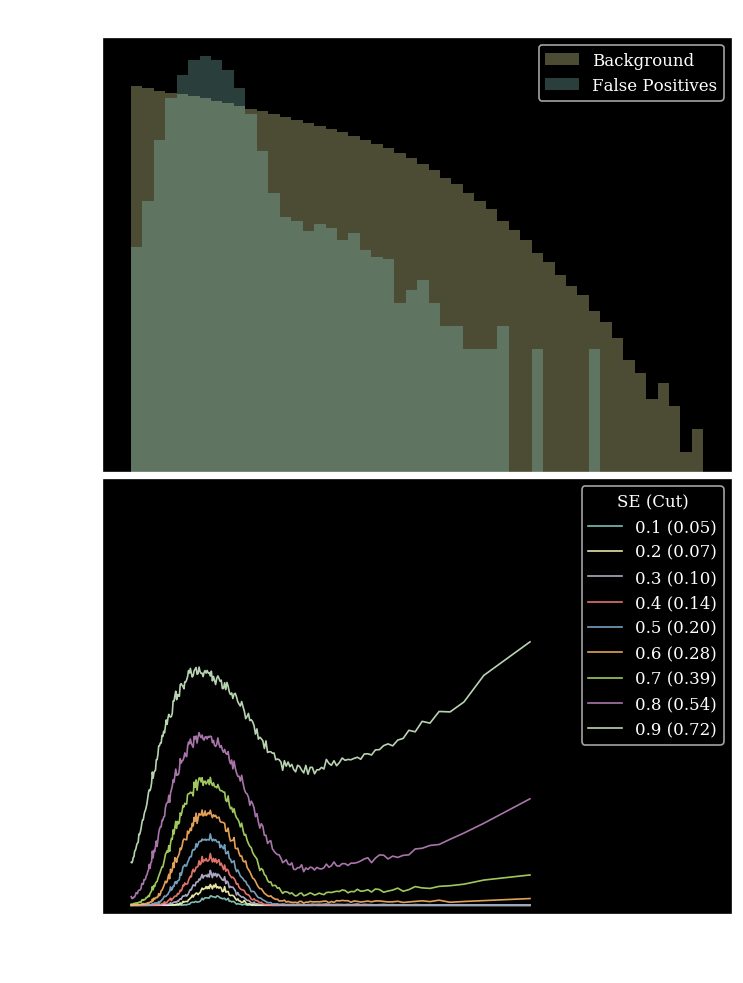

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (363.8s)
 Train: loss:0.2315, acc:77% || Val: loss: 0.0601, acc:84%, R50: 21.4147, 1/JSD: 1.7607


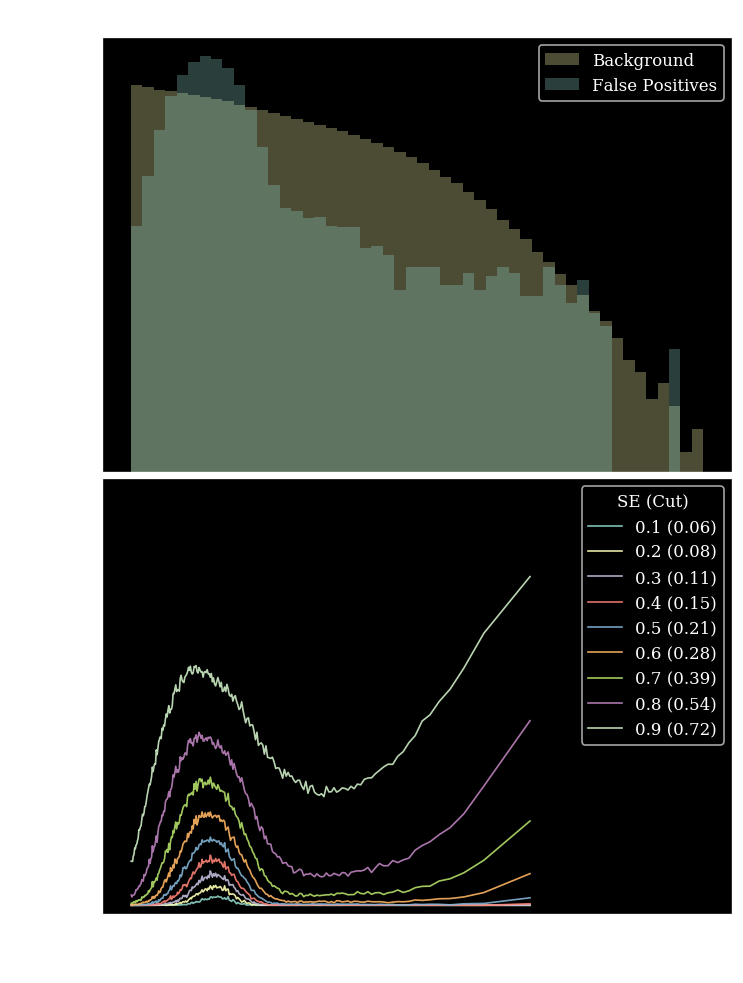

strength 2
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (363.9s)
 Train: loss:0.2465, acc:77% || Val: loss: 0.0630, acc:84%, R50: 20.5941, 1/JSD: 2.2988


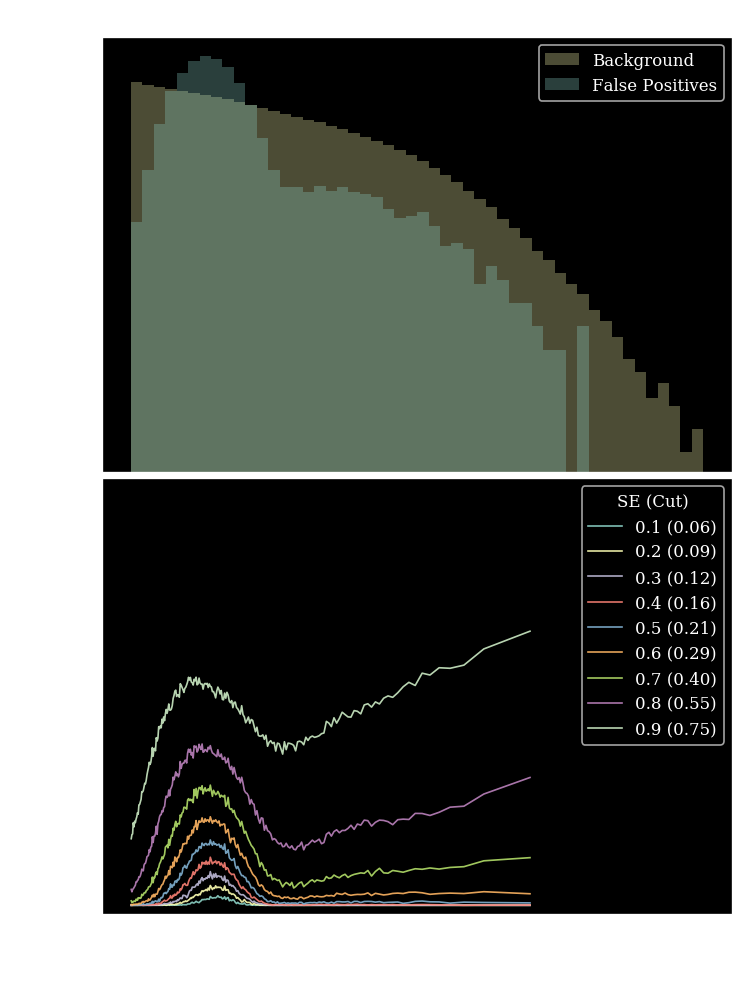

strength 2
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (366.8s)
 Train: loss:0.2561, acc:77% || Val: loss: 0.0636, acc:84%, R50: 20.1244, 1/JSD: 2.4796


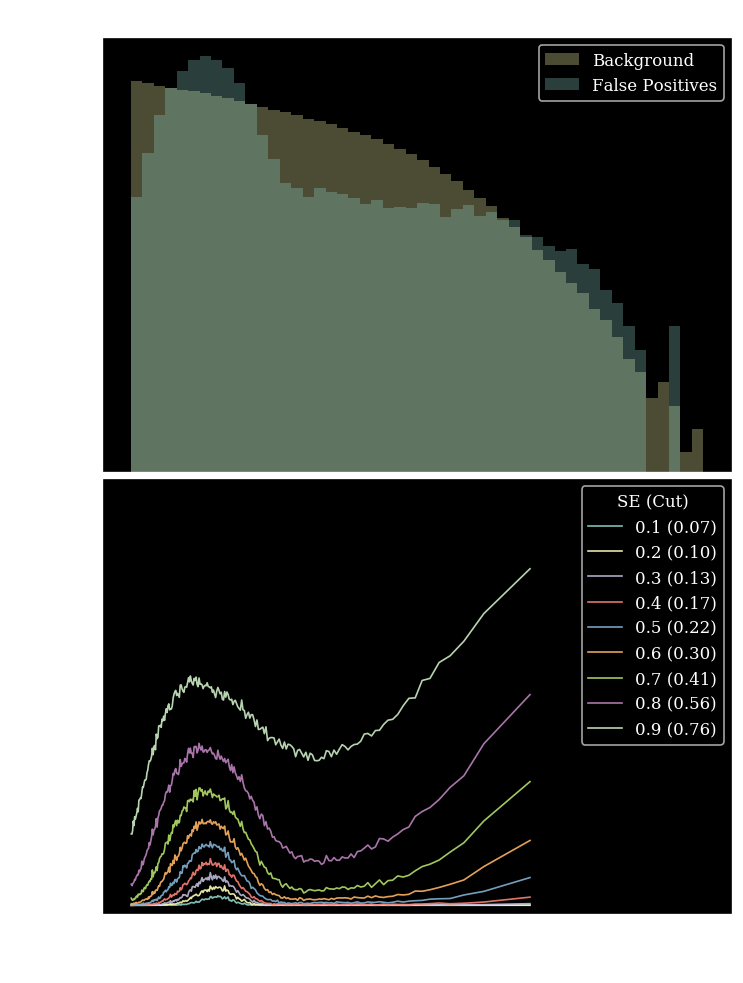

strength 5
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (364.4s)
 Train: loss:0.2860, acc:74% || Val: loss: 0.0686, acc:84%, R50: 16.8582, 1/JSD: 5.6077


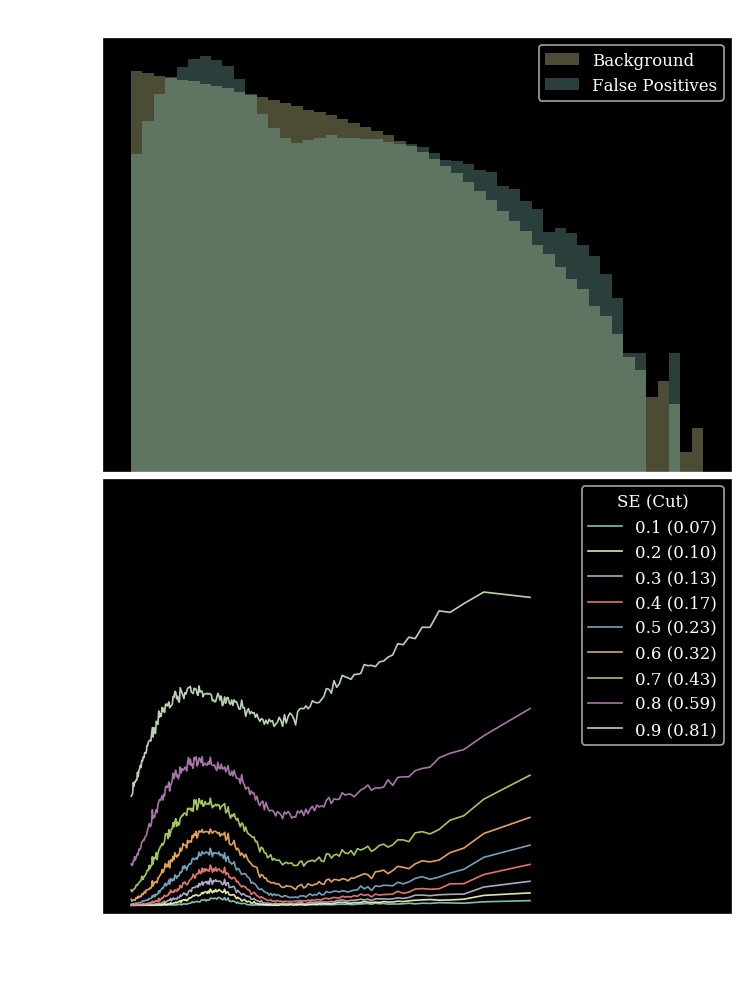

strength 5
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (364.6s)
 Train: loss:0.3114, acc:74% || Val: loss: 0.0698, acc:84%, R50: 17.2063, 1/JSD: 4.6191


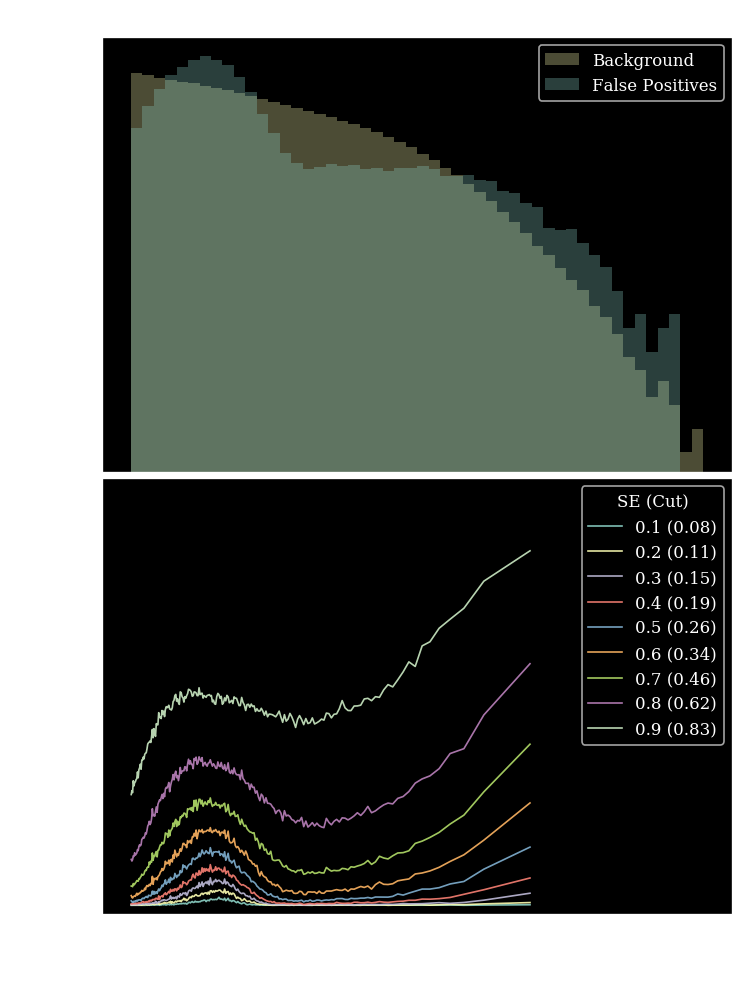

strength 10
Entering Training...
Epoch:0001/0200  (7.4  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (359.0s)
 Train: loss:0.3346, acc:72% || Val: loss: 0.0745, acc:83%, R50: 14.2413, 1/JSD: 13.5943


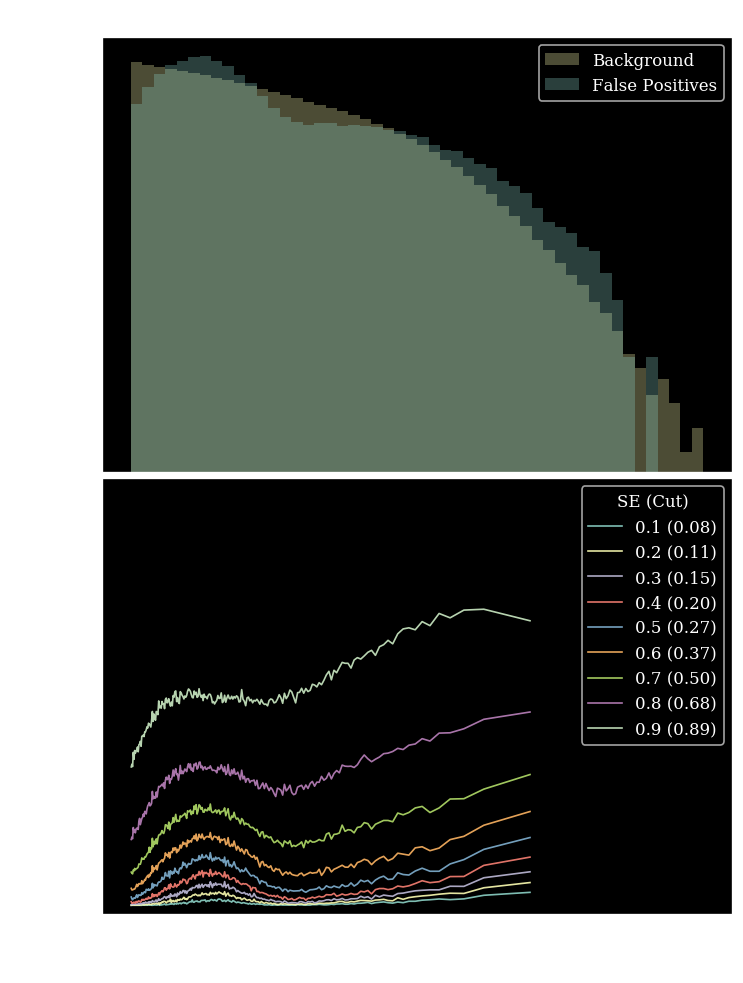

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (363.1s)
 Train: loss:0.3814, acc:69% || Val: loss: 0.0790, acc:84%, R50: 14.7118, 1/JSD: 10.4836


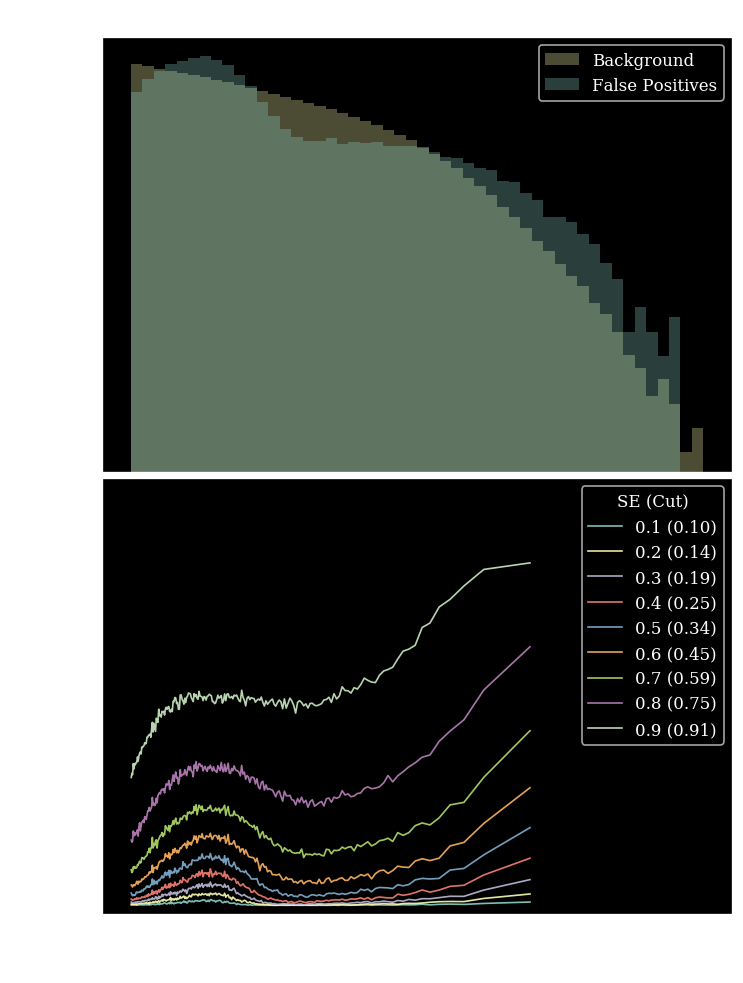

strength 50
Entering Training...
Epoch:0001/0200  (7.4  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (360.3s)
 Train: loss:0.4922, acc:60% || Val: loss: 0.1059, acc:83%, R50: 9.0637, 1/JSD: 111.8407


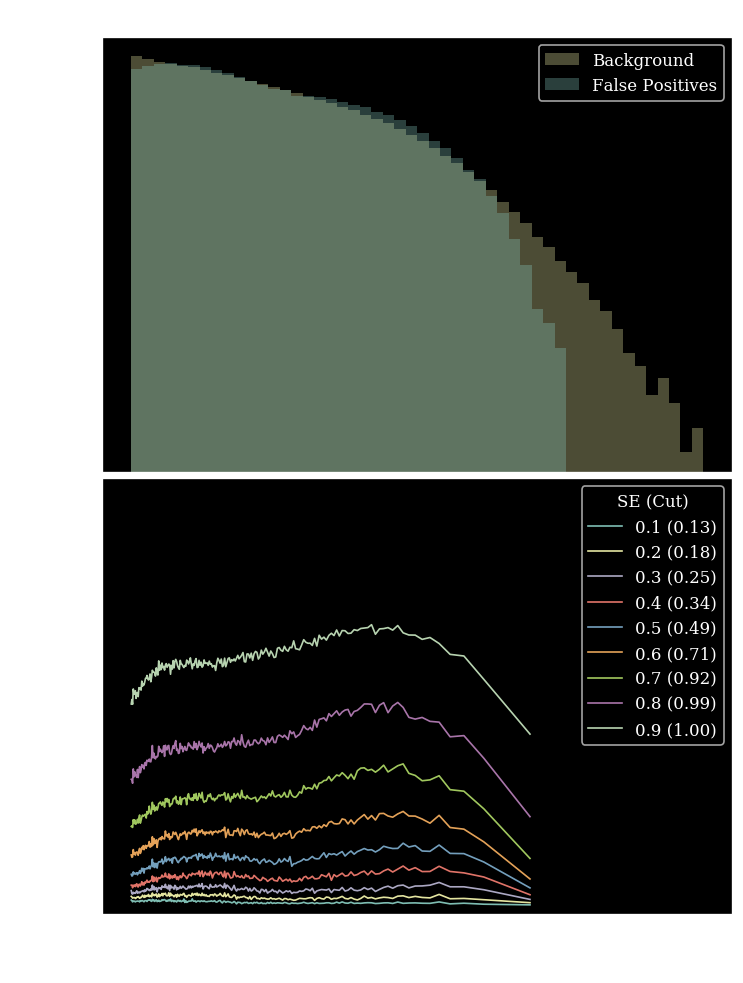

strength 50
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (361.4s)
 Train: loss:0.5760, acc:48% || Val: loss: 0.1356, acc:84%, R50: 10.7868, 1/JSD: 23.8486


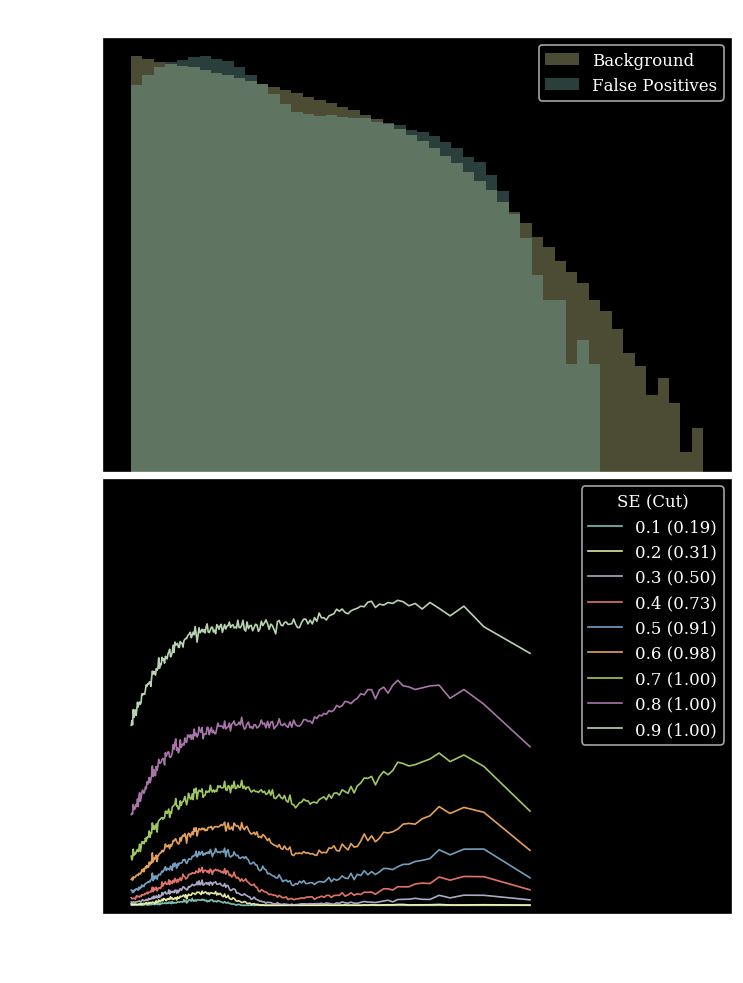

strength 60
Entering Training...
Epoch:0001/0200  (7.4  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (358.6s)
 Train: loss:0.5113, acc:58% || Val: loss: 0.1103, acc:83%, R50: 8.8216, 1/JSD: 112.0819


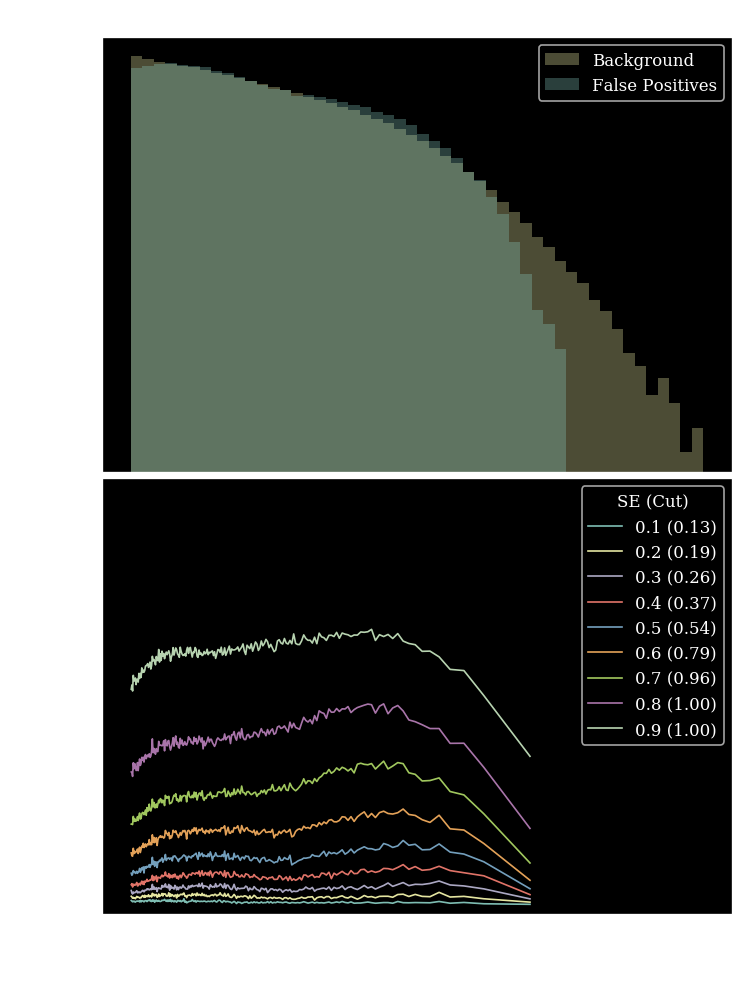

strength 60
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (361.2s)
 Train: loss:0.5906, acc:46% || Val: loss: 0.1421, acc:83%, R50: 10.0457, 1/JSD: 25.6564


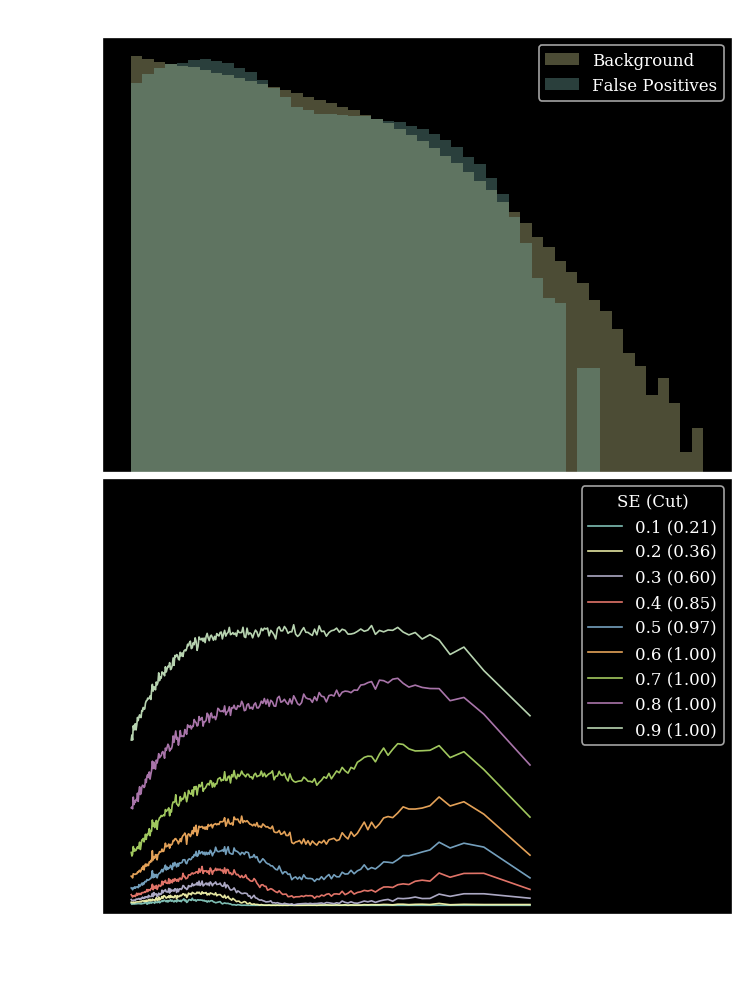

strength 75
Entering Training...
Epoch:0001/0200  (7.4  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (359.9s)
 Train: loss:0.5347, acc:57% || Val: loss: 0.1153, acc:83%, R50: 8.6180, 1/JSD: 117.5086


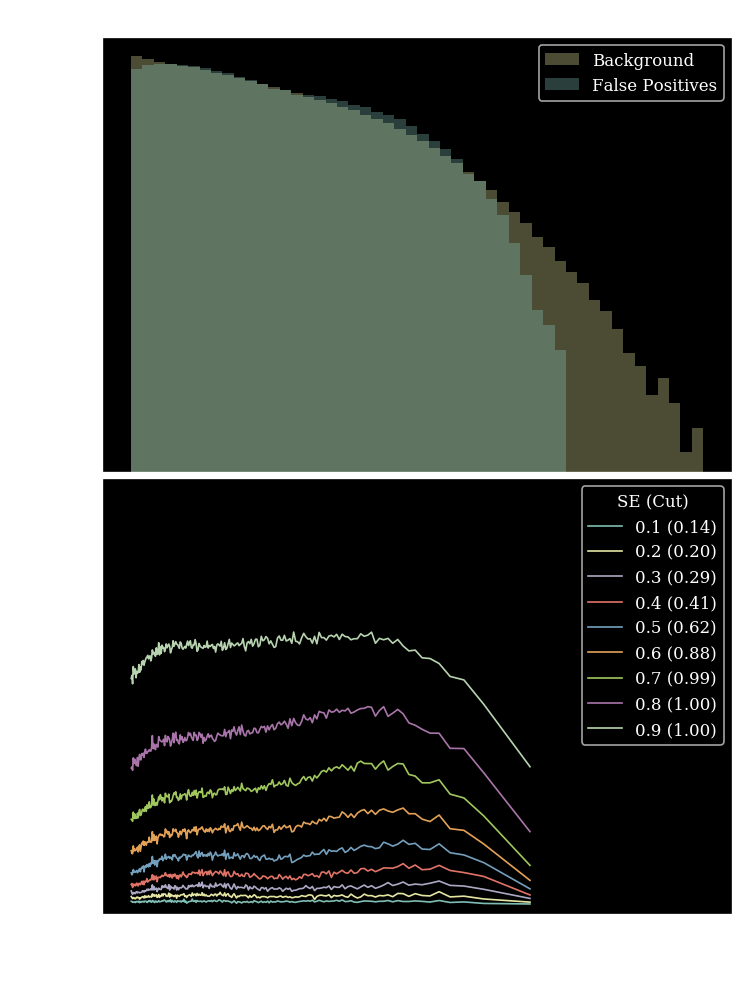

strength 75
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (360.9s)
 Train: loss:0.6078, acc:44% || Val: loss: 0.1489, acc:83%, R50: 9.3205, 1/JSD: 23.8115


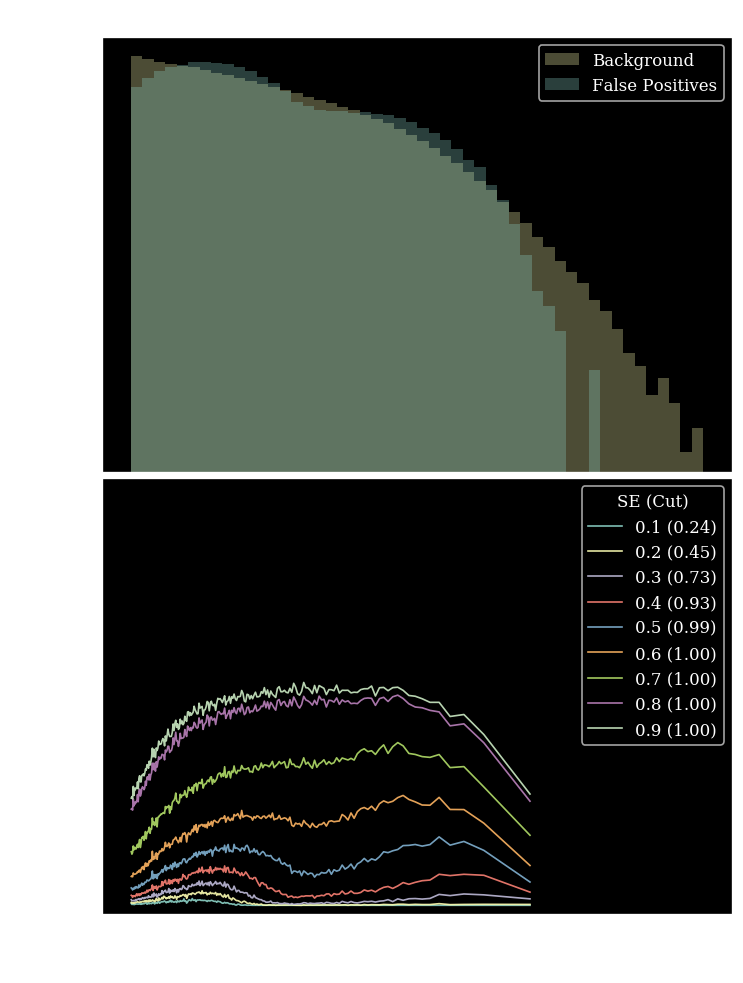

strength 85
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (358.3s)
 Train: loss:0.5458, acc:55% || Val: loss: 0.1186, acc:83%, R50: 8.4957, 1/JSD: 121.7092


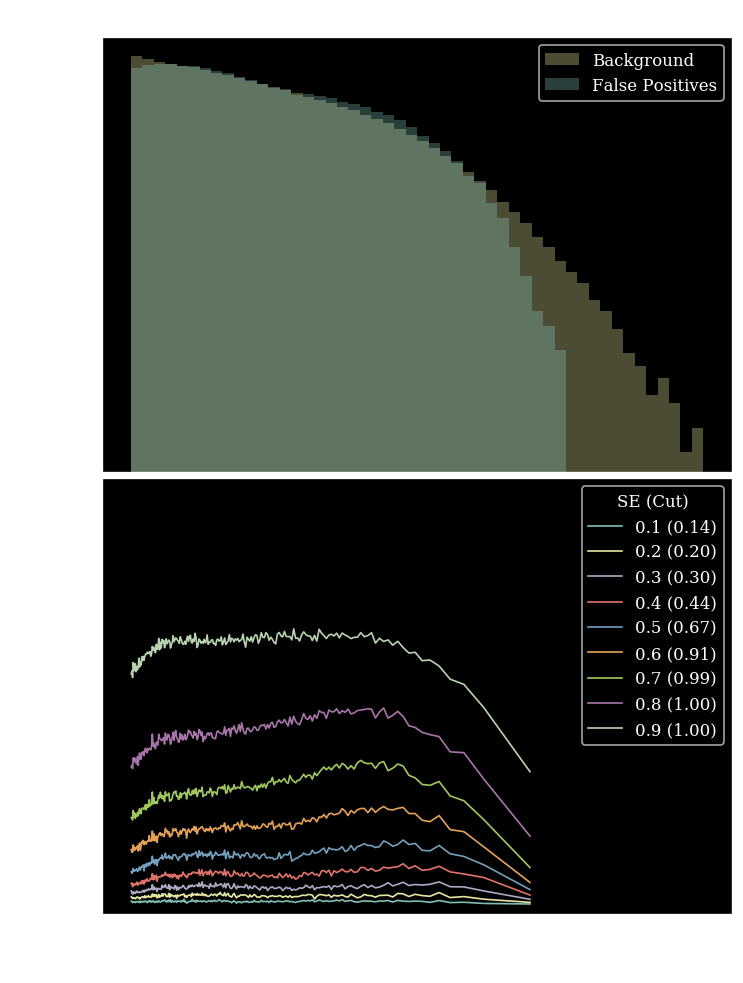

strength 85
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (360.7s)
 Train: loss:0.6192, acc:43% || Val: loss: 0.1527, acc:83%, R50: 8.8200, 1/JSD: 19.5084


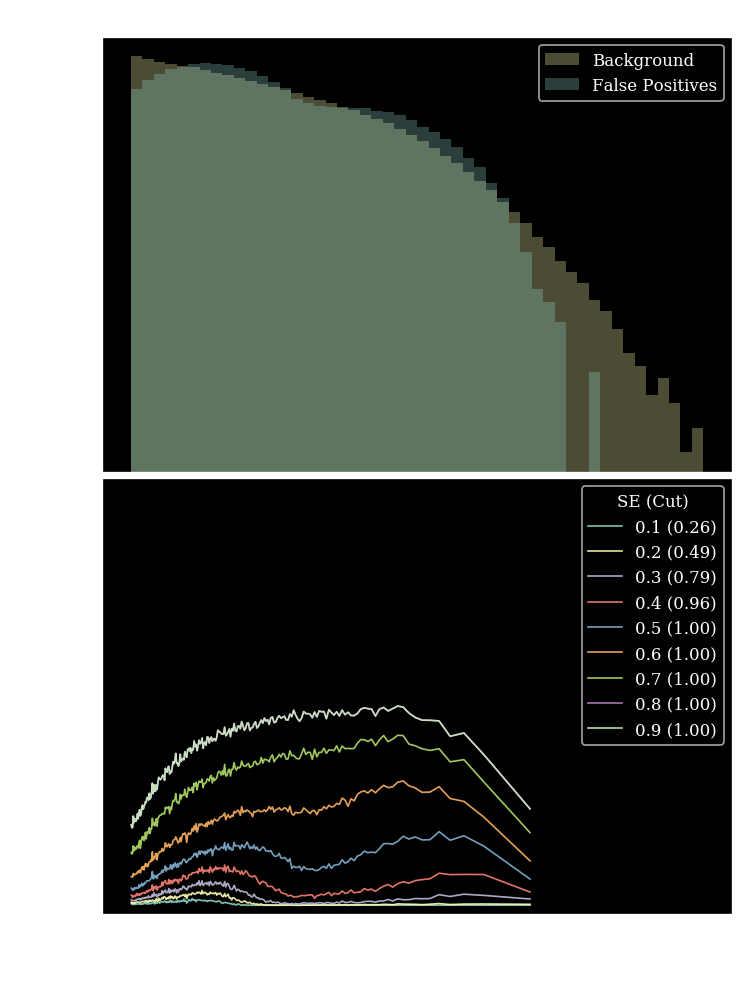

strength 100
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (359.8s)
 Train: loss:0.5599, acc:54% || Val: loss: 0.1225, acc:83%, R50: 8.3697, 1/JSD: 114.9320


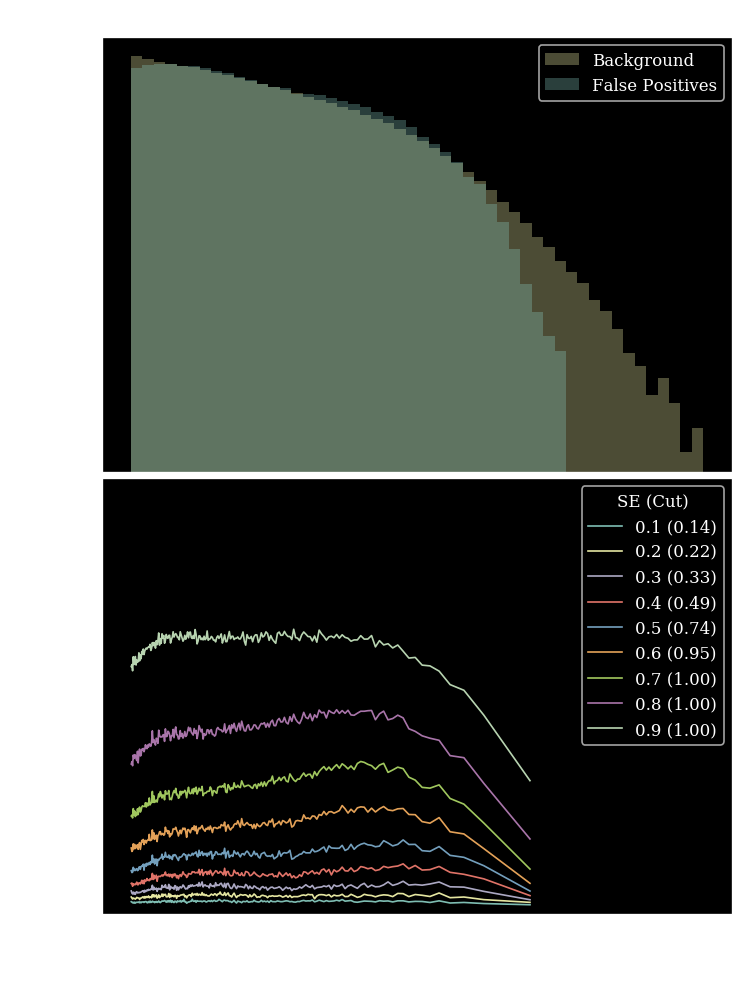

strength 100
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (362.5s)
 Train: loss:0.6370, acc:40% || Val: loss: 0.1603, acc:83%, R50: 10.5240, 1/JSD: 10.0093


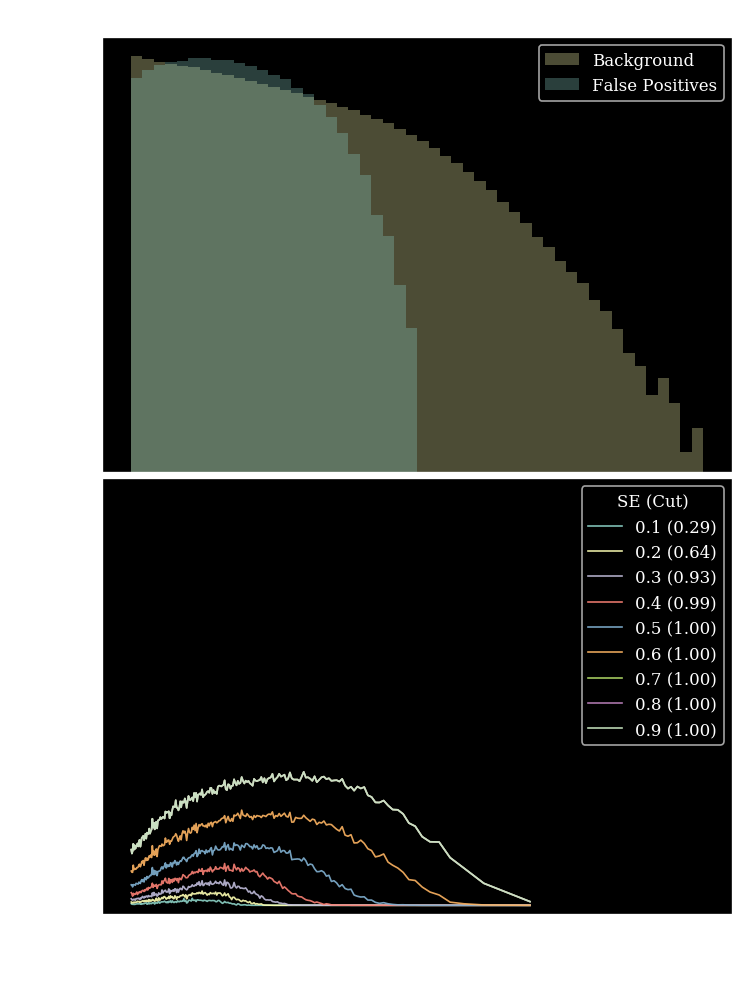

strength 110
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (359.3s)
 Train: loss:0.5685, acc:52% || Val: loss: 0.1246, acc:83%, R50: 8.3863, 1/JSD: 111.8885


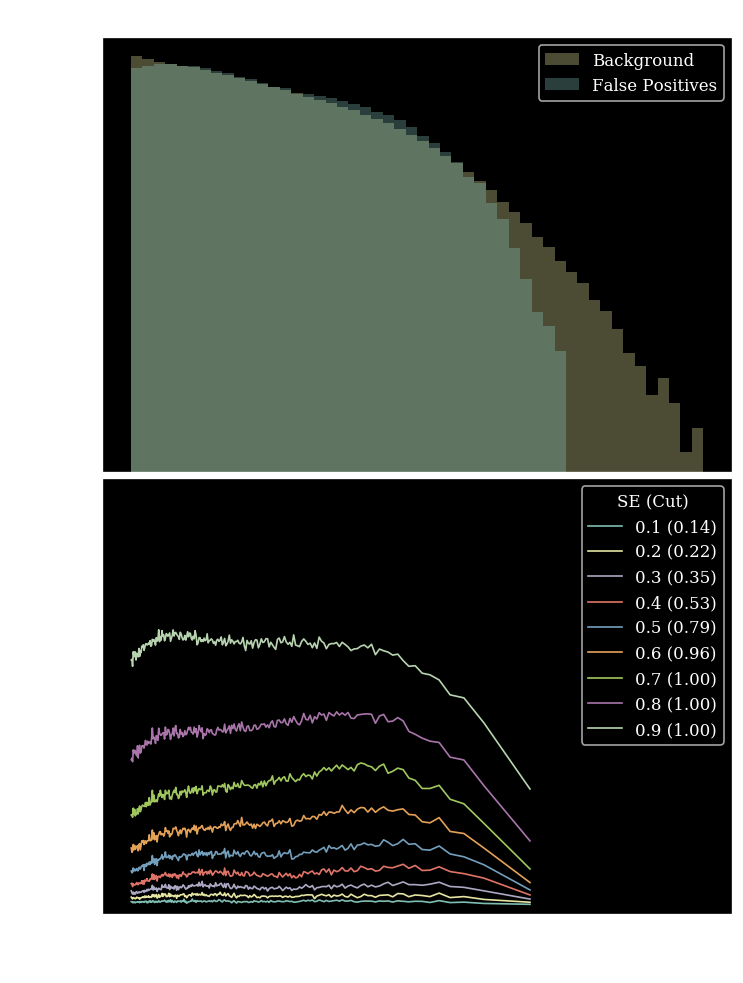

strength 110
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (360.3s)
 Train: loss:0.6417, acc:39% || Val: loss: 0.1637, acc:82%, R50: 10.0717, 1/JSD: 15.1663


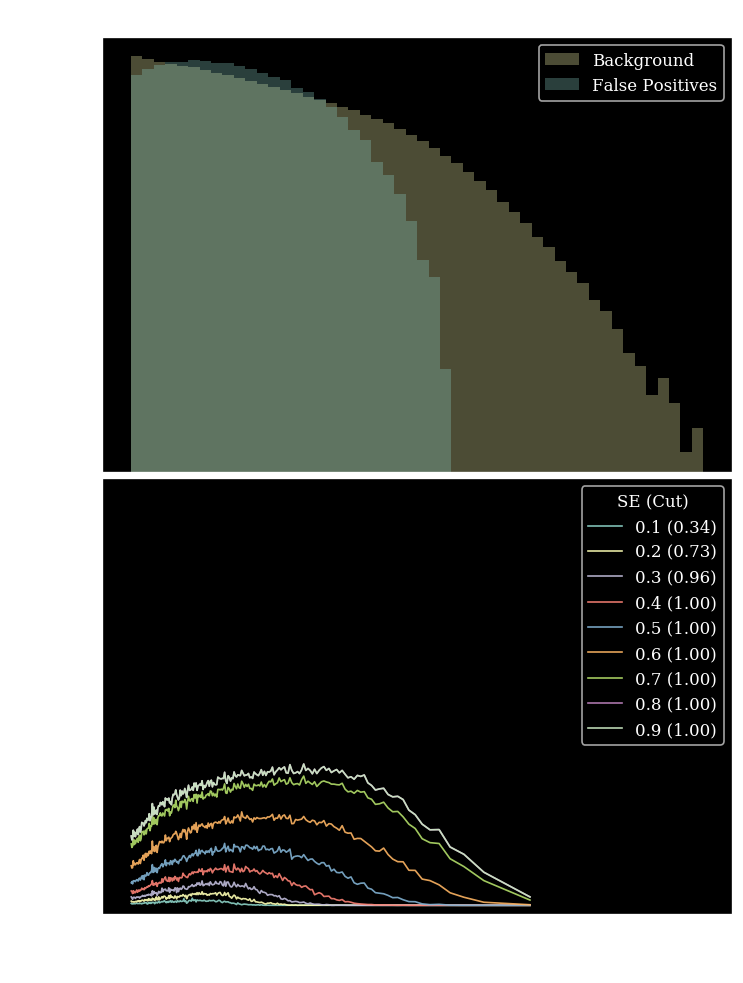

strength 120
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (358.8s)
 Train: loss:0.5742, acc:52% || Val: loss: 0.1267, acc:83%, R50: 8.3096, 1/JSD: 109.2092


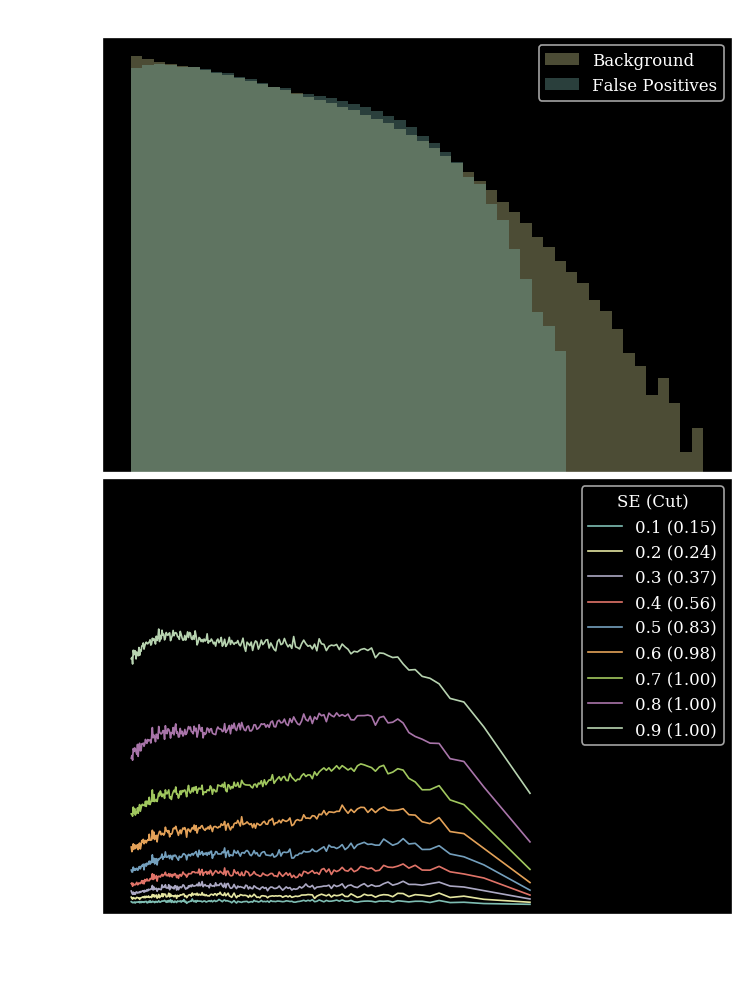

strength 120
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (360.4s)
 Train: loss:0.6463, acc:37% || Val: loss: 0.1676, acc:82%, R50: 9.4183, 1/JSD: 21.8231


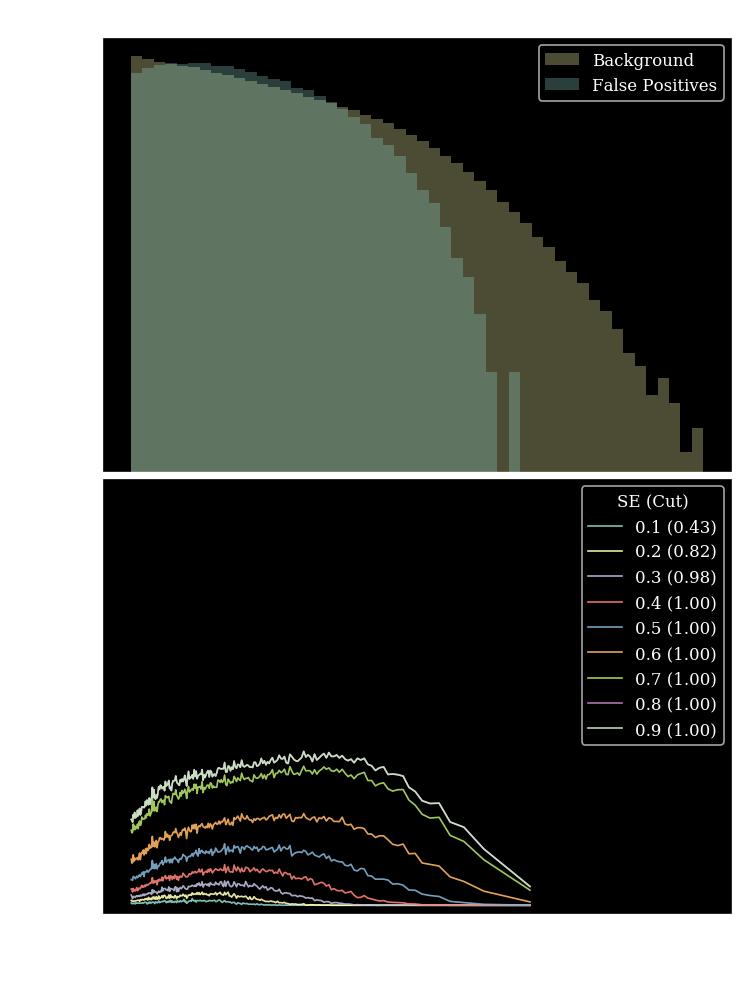

In [24]:
jsdR50flatstr = []
for i,frac in enumerate([1,2,5,10,50,60,75,85,100,110,120]):
    for bins in [5,32]:
        print("strength",frac)
        metrics_train_L = Metrics()
        metrics_val_L = Metrics(validation=True)

        torch.manual_seed(777)
        model_L = Classifier().to(device)
        optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
        loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=bins,memory=False)
        log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
        model_L.fit(traindataset=traindataset,
                    valdataset=valdataset,
                    optimizer=optimizer,
                    loss=loss,
                    **params,
                    log=log,
                  #scheduler=scheduler,
                  metrics=[metrics_train_L,metrics_val_L])
        model_L.train(False)
        out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,
                       y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
        jsdR50flatstr.append(out)

# DisCo str

strength 1
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (735.2s)
 Train: loss:0.1955, acc:80% || Val: loss: 0.0548, acc:84%, R50: 23.6542, 1/JSD: 1.2765


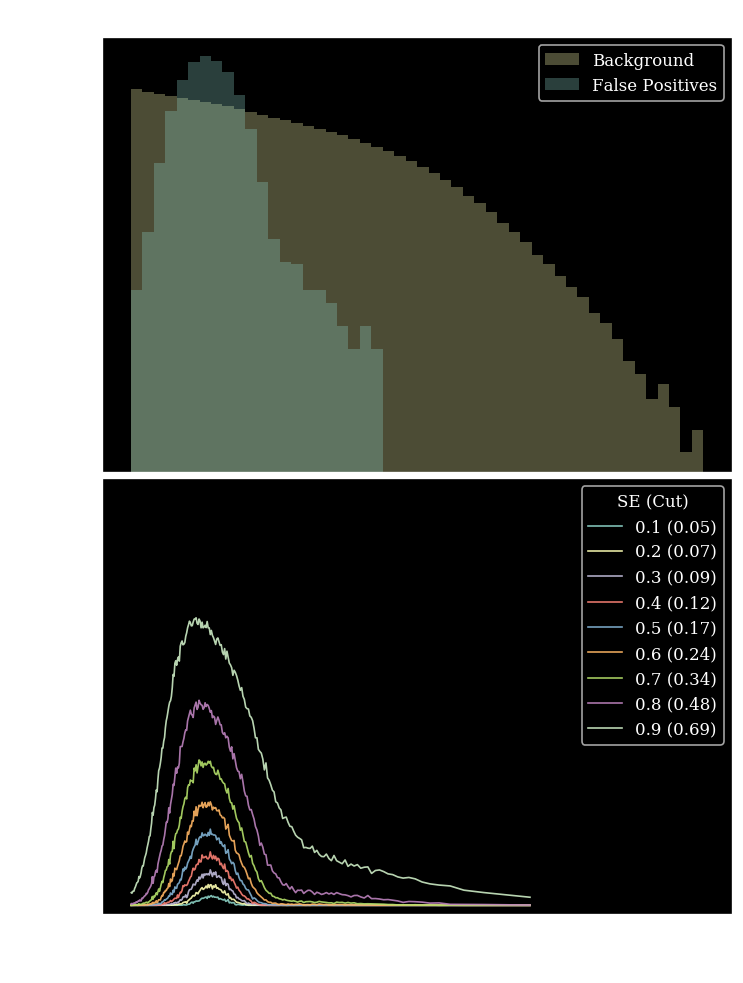

strength 2
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206


In [ ]:
jsdR50Disco = []
for i,frac in enumerate([1,2,5,10,20,30,50,100]):
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
    loss =  Disco(frac=frac,labels=traindataset.labels,background_only=True)
    log=Logger("./logs/logWFCNDisLoss({:.2f}).txt".format(frac))
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    out=plot_stuff(model=model_L,name=f"DisCo DNN str:{frac}",X=X,
                   y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
    jsdR50Disco.append(out)

Text(0, 0.5, '1/JSD')

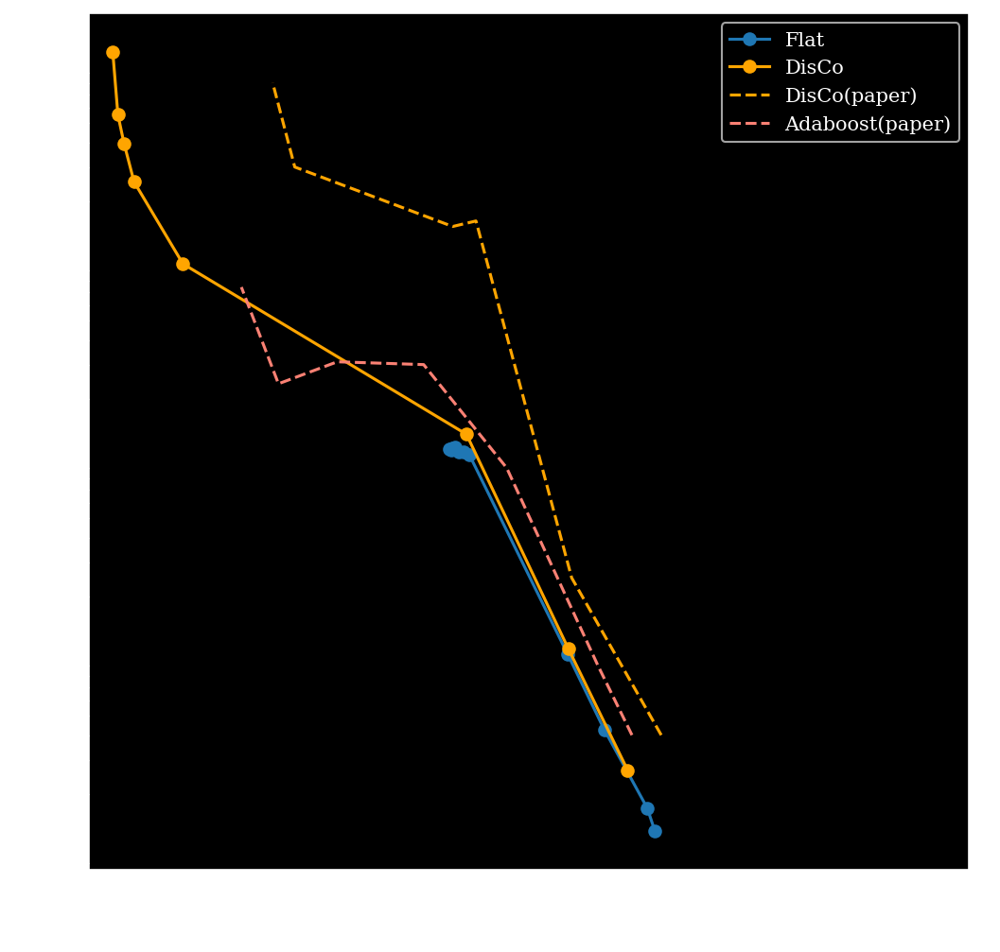

In [35]:
JSD,R50 = zip(*jsdR50flatstr[0::2])
JSD2,R502 = zip(*jsdR50Disco)
JSD3 = np.array([4,25,1.6e3,1.5e3,3e3,8e3])
R503 = [23,15,9.5,8.5,4,3.6]
JSD4 = [4,9,90,300,310,240,740]
R504 = [20,17,11,7.4,4.9,3.7,3.1]
    
fig, ax= plt.subplots(1,1,figsize=(8,8),dpi=150)
plt.errorbar(R50,JSD,fmt='-o',label='Flat',c='tab:blue')
plt.errorbar(R502,JSD2,fmt='-o',label='DisCo',c='orange')
plt.errorbar(R503,JSD3,fmt='--',label='DisCo(paper)',c='orange',ls='--')
plt.errorbar(R504,JSD4,fmt='--',label='Adaboost(paper)',c='C3',ls='--')
plt.xscale('log')
plt.yscale('log')
plt.xlim([1.5,100])
#plt.ylim([1,1.3e5])
plt.legend(loc='upper right')
plt.xlabel('R50')
plt.ylabel('1/JSD')

# Flat with global memory 

Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1443.9s)
 Train: loss:0.2049, acc:79% || Val: loss: 0.0590, acc:82%, R50: 20.9364, 1/JSD: 1.6630


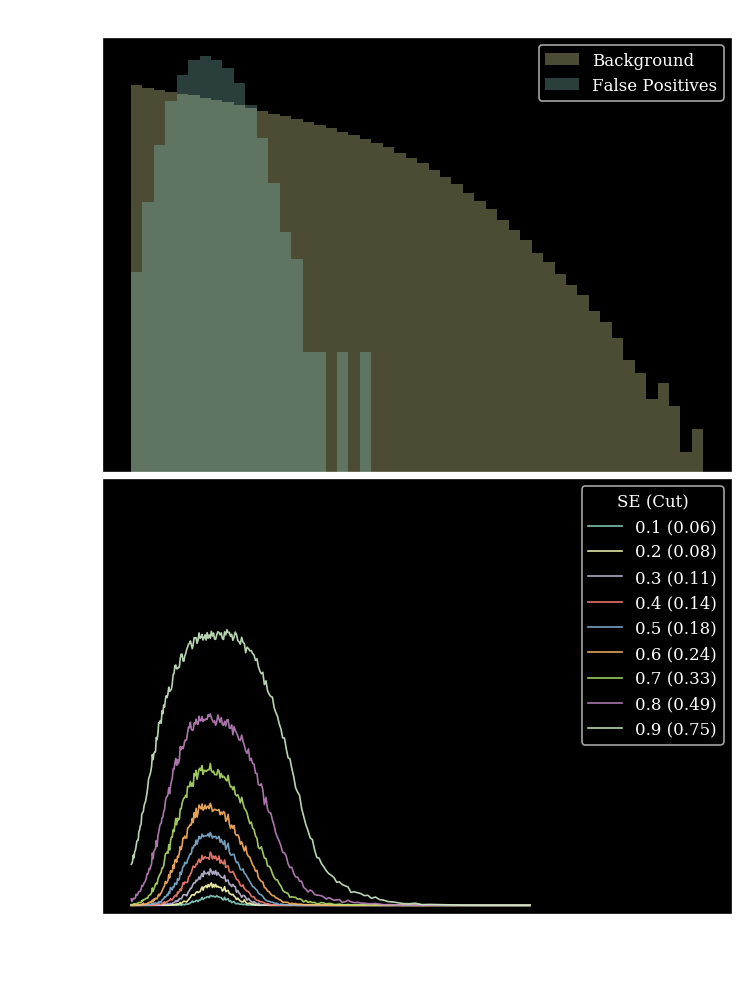

Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1420.4s)
 Train: loss:0.3400, acc:76% || Val: loss: 0.0643, acc:81%, R50: 15.4487, 1/JSD: 3.9401


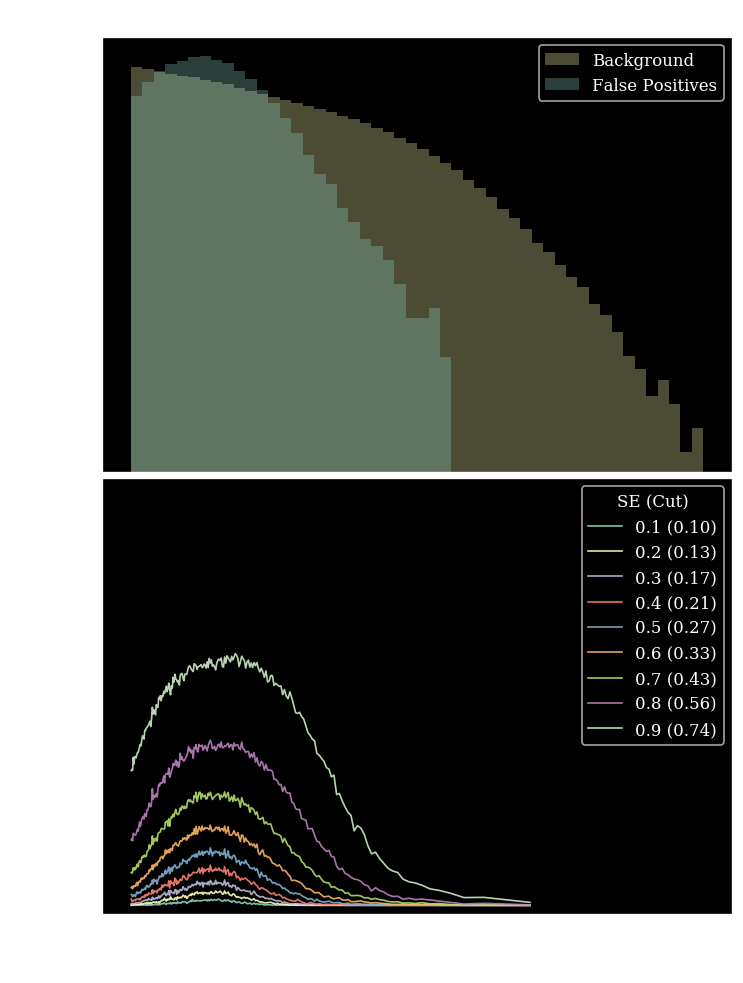

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1402.3s)
 Train: loss:0.3240, acc:72% || Val: loss: 0.0736, acc:74%, R50: 8.4600, 1/JSD: 187.9386


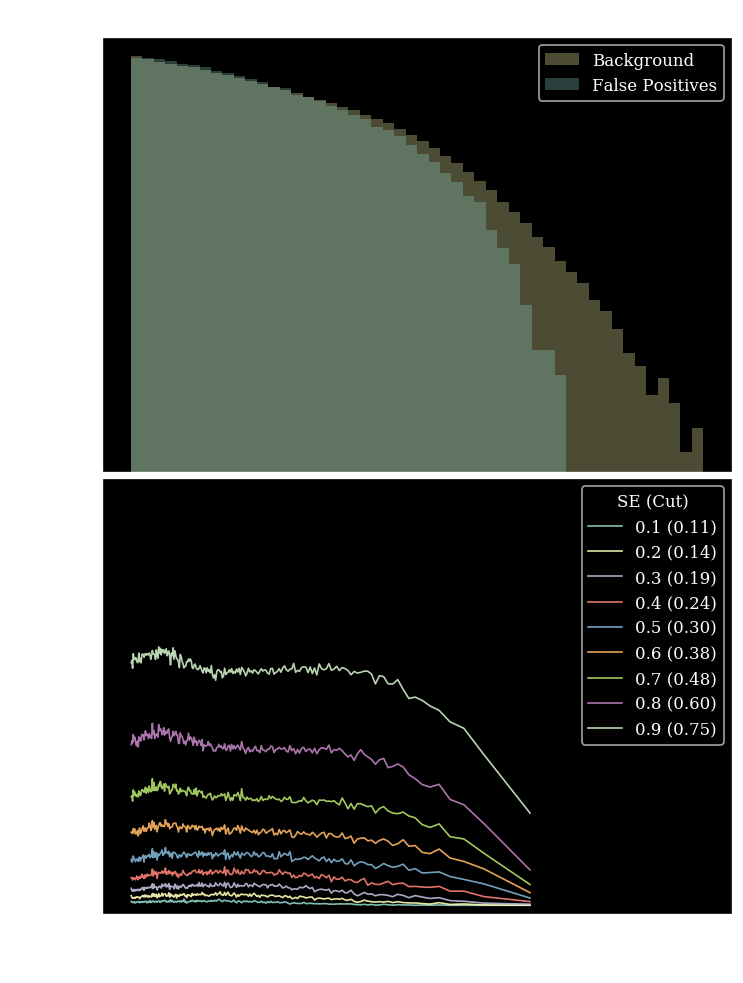

Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1391.7s)
 Train: loss:0.3529, acc:72% || Val: loss: 0.0743, acc:73%, R50: 8.1904, 1/JSD: 375.3986


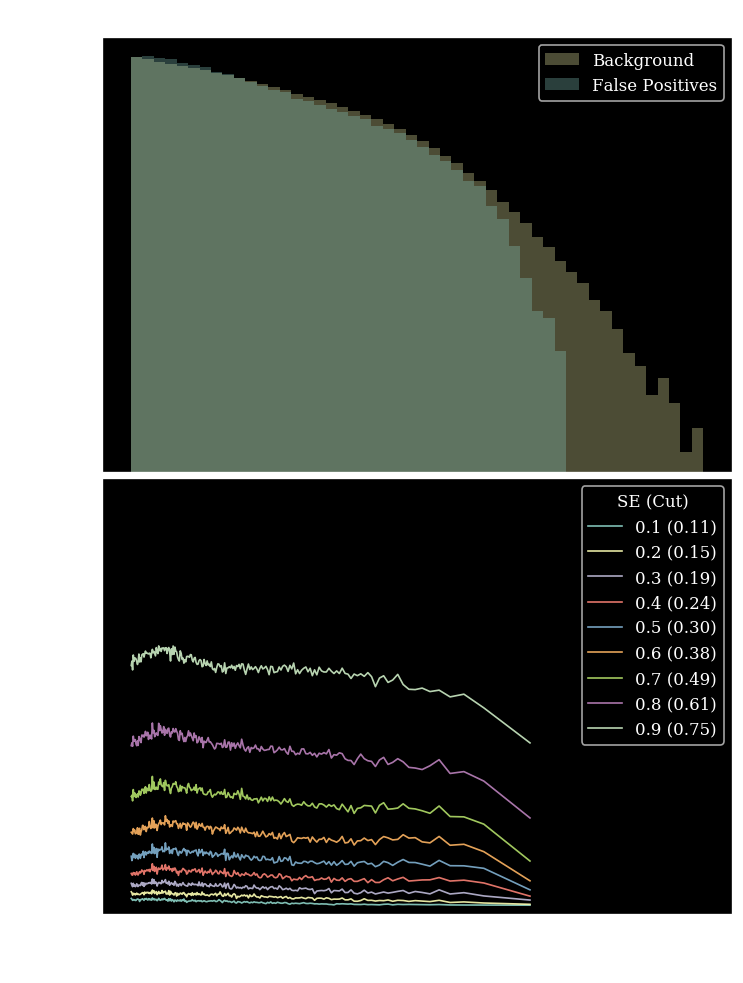

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1323.2s)
 Train: loss:1.1177, acc:71% || Val: loss: 0.0745, acc:74%, R50: 8.2120, 1/JSD: 382.0078


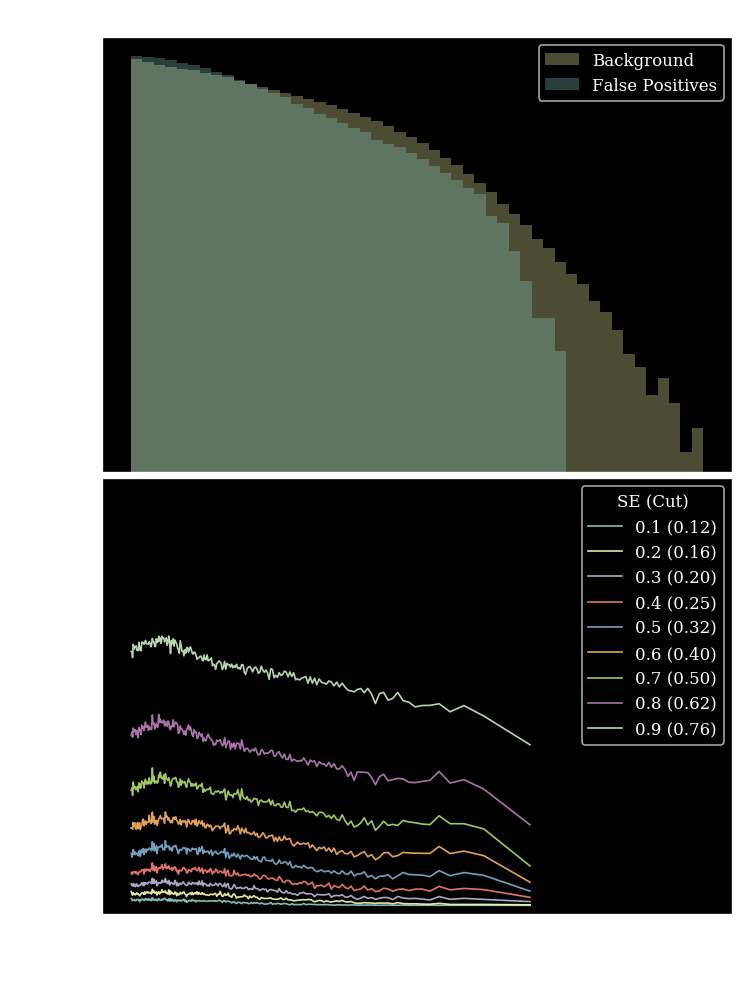

Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1315.7s)
 Train: loss:1.6016, acc:71% || Val: loss: 0.0746, acc:74%, R50: 8.2434, 1/JSD: 368.6076


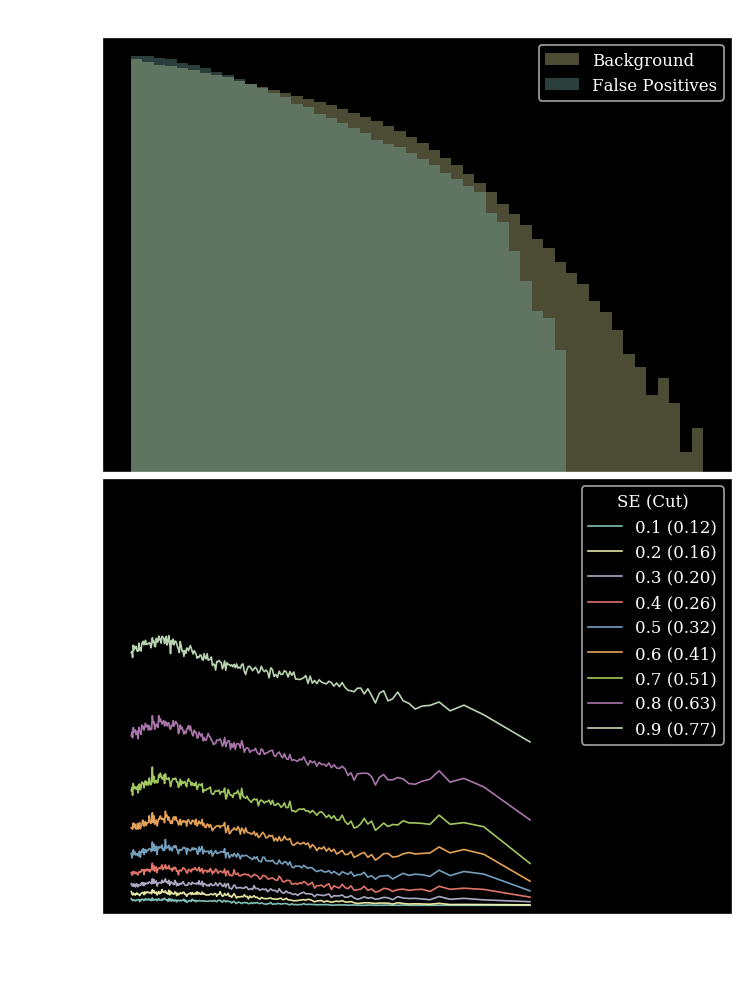

Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1301.1s)
 Train: loss:1.9242, acc:71% || Val: loss: 0.0745, acc:74%, R50: 8.2317, 1/JSD: 384.2090


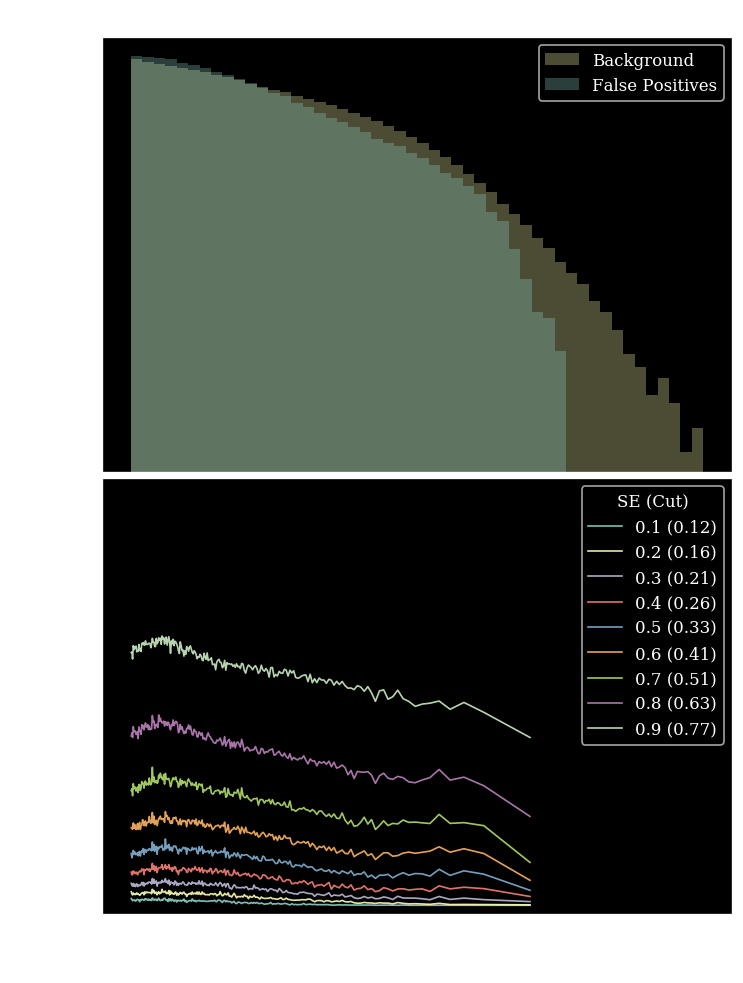

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1291.1s)
 Train: loss:2.0235, acc:71% || Val: loss: 0.0748, acc:74%, R50: 8.1984, 1/JSD: 368.1510


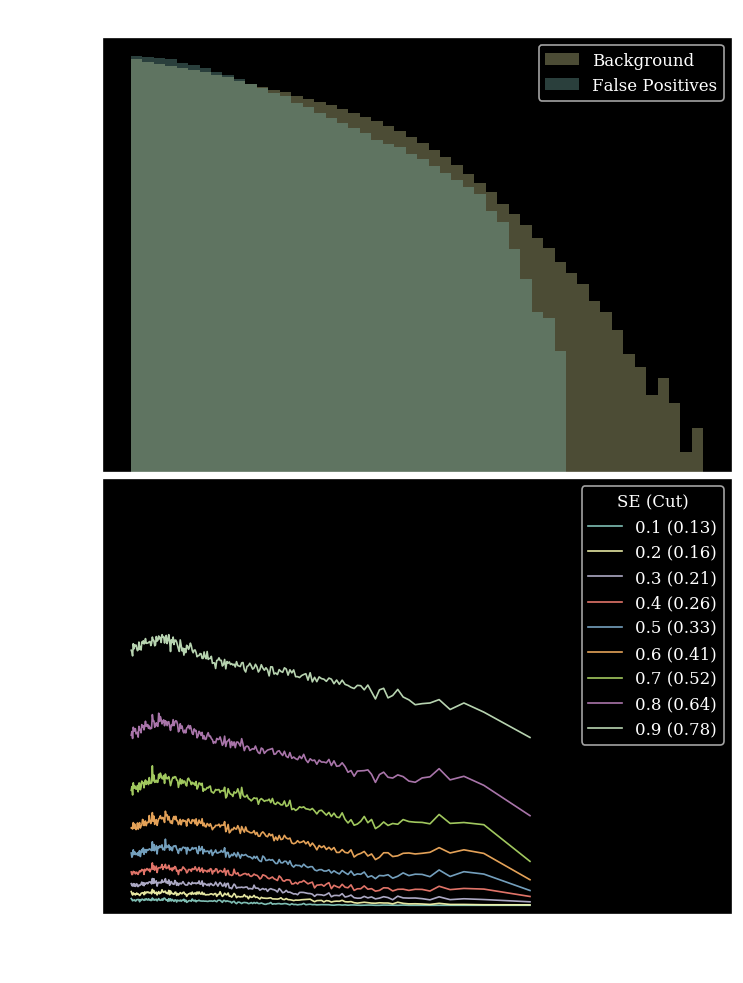

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1290.6s)
 Train: loss:2.5074, acc:71% || Val: loss: 0.0747, acc:74%, R50: 8.2153, 1/JSD: 353.2331


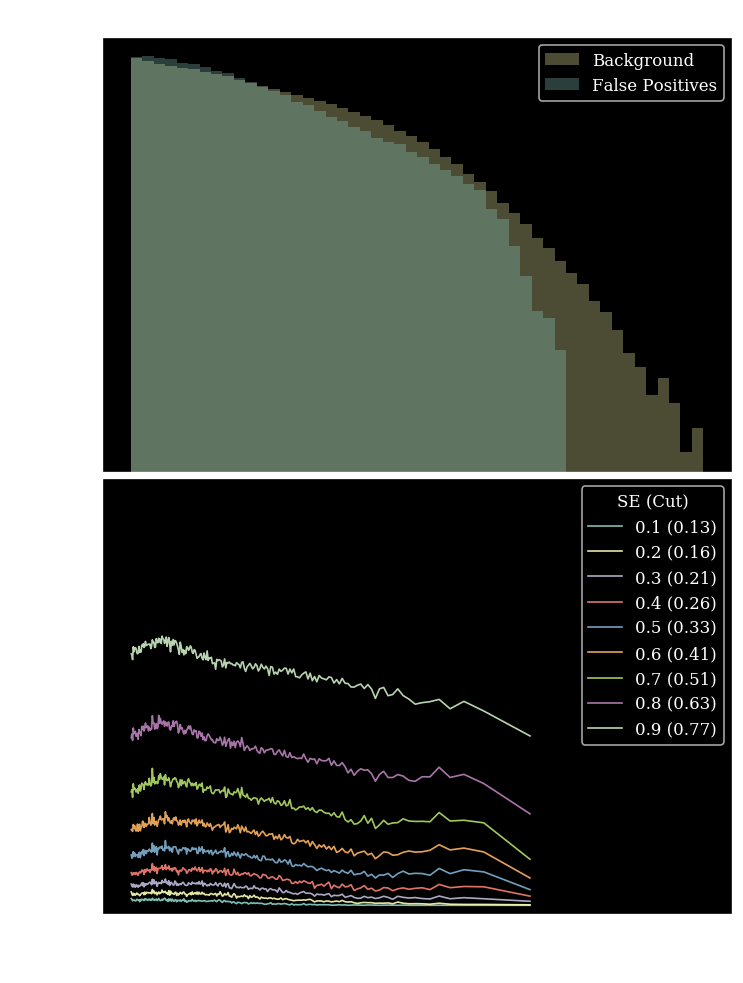

Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1183.7s)
 Train: loss:1.9383, acc:71% || Val: loss: 0.0753, acc:74%, R50: 8.0580, 1/JSD: 289.1863


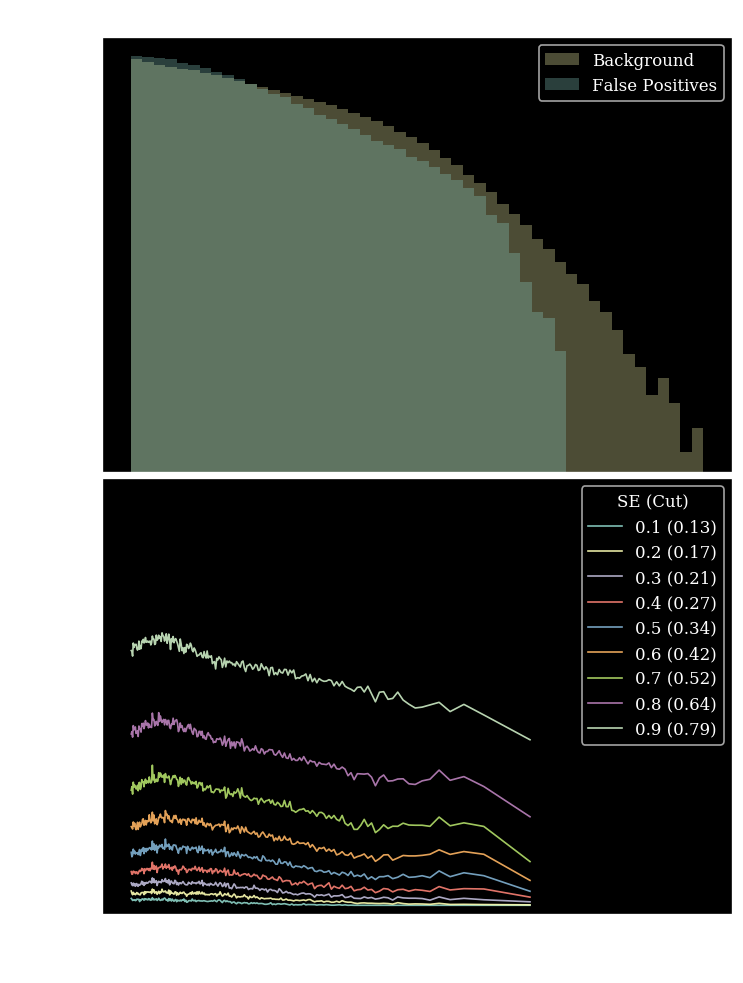

Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1283.0s)
 Train: loss:2.8173, acc:70% || Val: loss: 0.0752, acc:74%, R50: 8.1604, 1/JSD: 330.7058


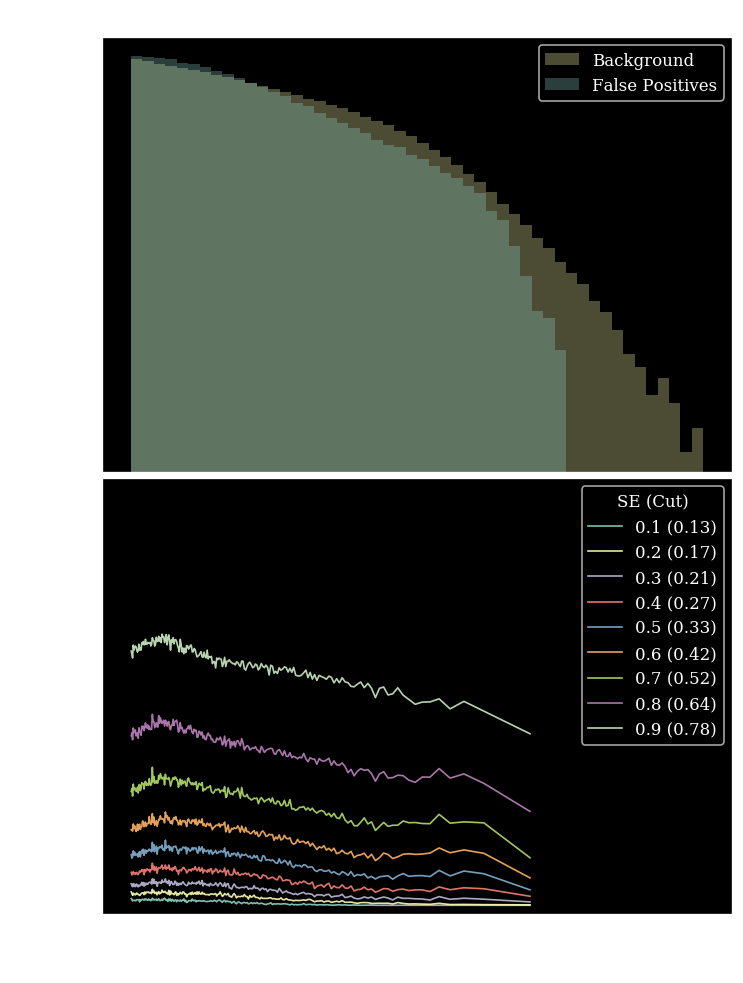

In [36]:
jsdR50flat = []
for i,bins in enumerate([1,2,5,10,50,60,75,85,100,110,120]):
    frac=50
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)
    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=1,bins=bins,memory=True)
    log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    model_L.train(False)
    out=plot_stuff(model=model_L,name=f"Flat DNN bins:{bins}",X=X,
                   y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
    jsdR50flat.append(out)

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.9s)
 Train: loss:0.2113, acc:78% || Val: loss: 0.0584, acc:84%, R50: 22.3441, 1/JSD: 1.4698


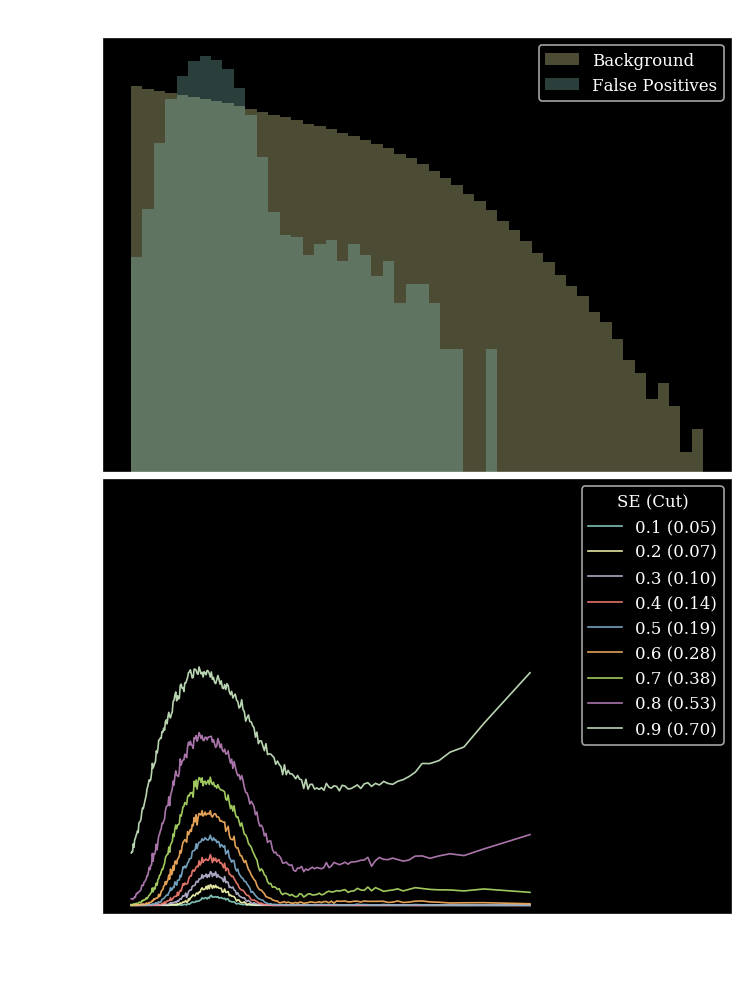

strength 1
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1389.8s)
 Train: loss:0.2104, acc:78% || Val: loss: 0.0585, acc:84%, R50: 22.1313, 1/JSD: 1.5196


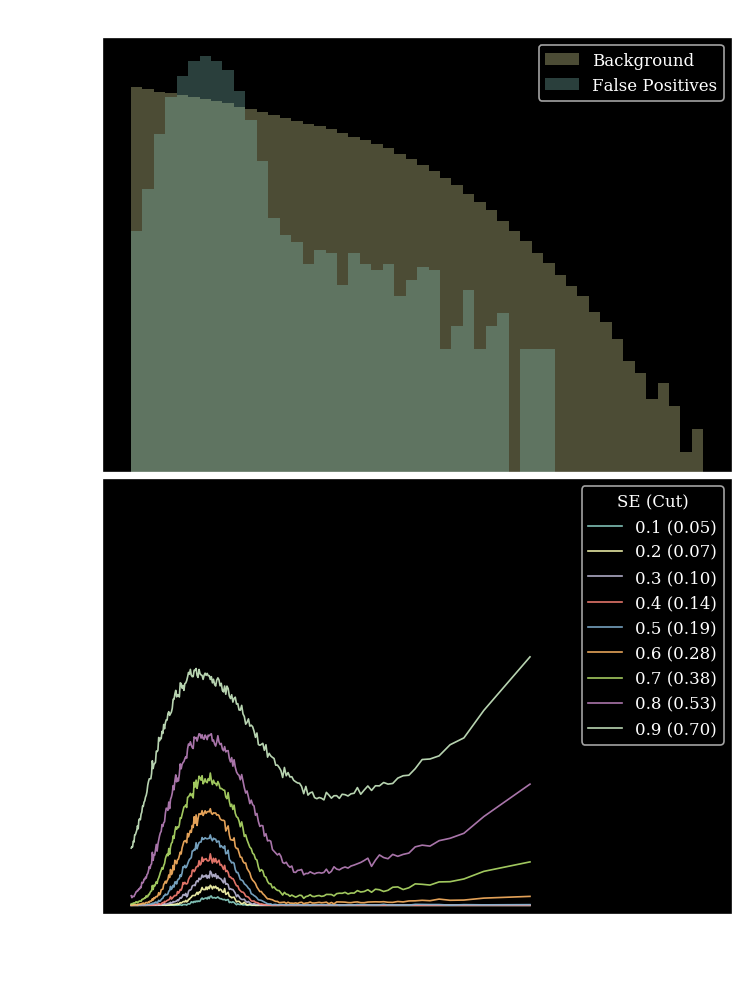

strength 1
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1350.9s)
 Train: loss:0.2136, acc:78% || Val: loss: 0.0583, acc:84%, R50: 21.7334, 1/JSD: 1.6409


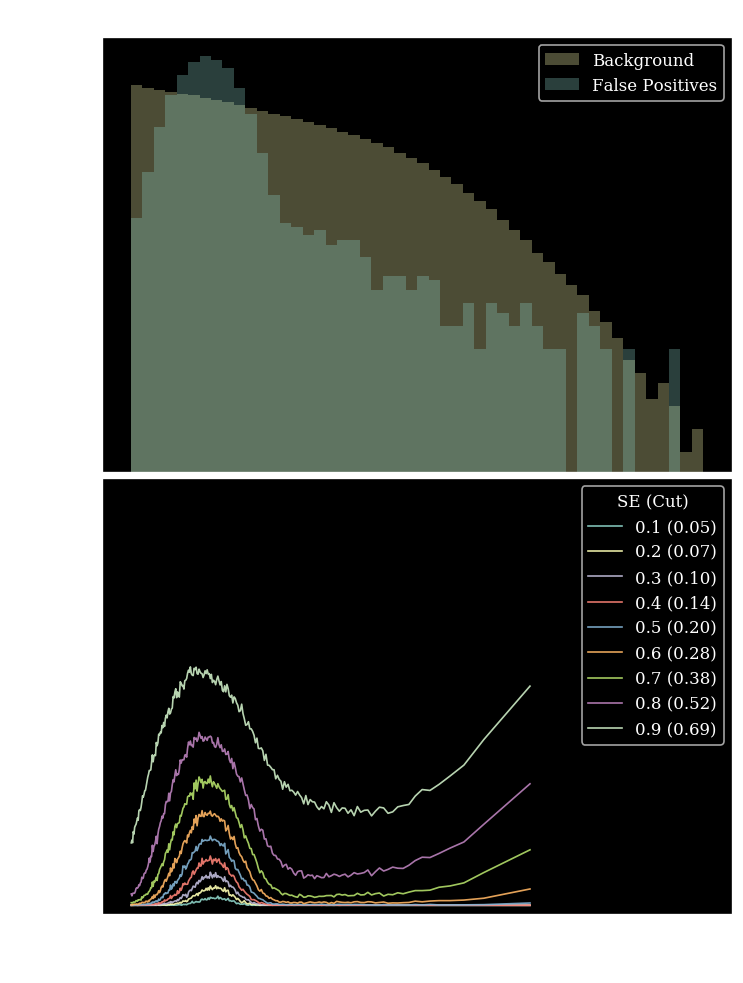

strength 2
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.6s)
 Train: loss:0.2235, acc:77% || Val: loss: 0.0600, acc:84%, R50: 20.8465, 1/JSD: 1.9081


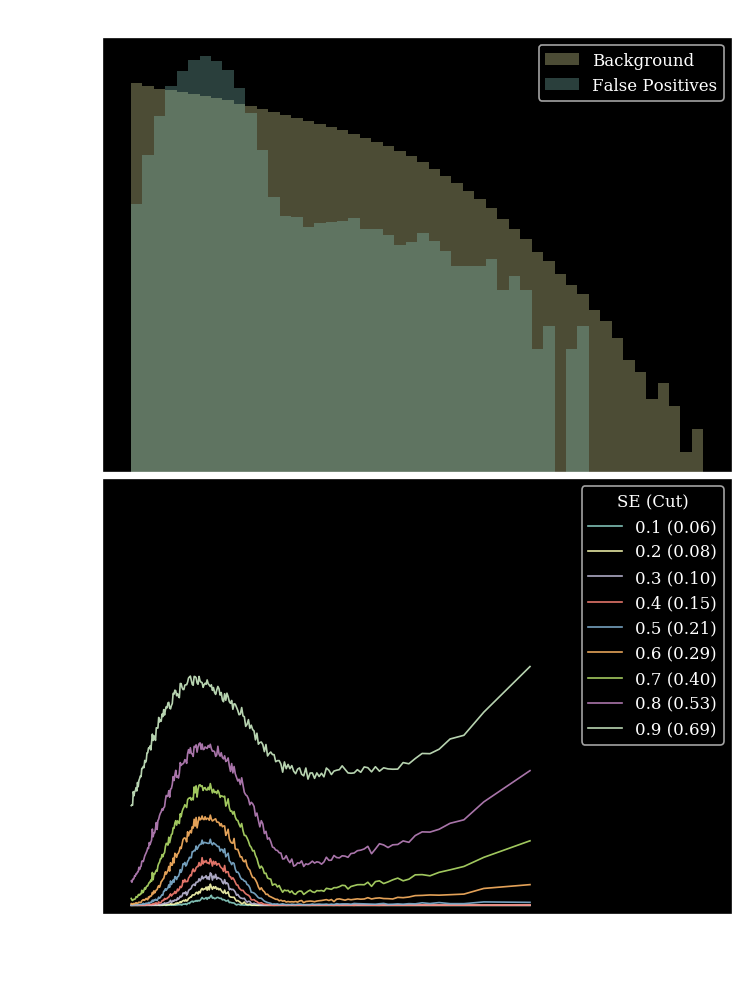

strength 2
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1389.7s)
 Train: loss:0.2218, acc:77% || Val: loss: 0.0605, acc:84%, R50: 20.4893, 1/JSD: 2.1066


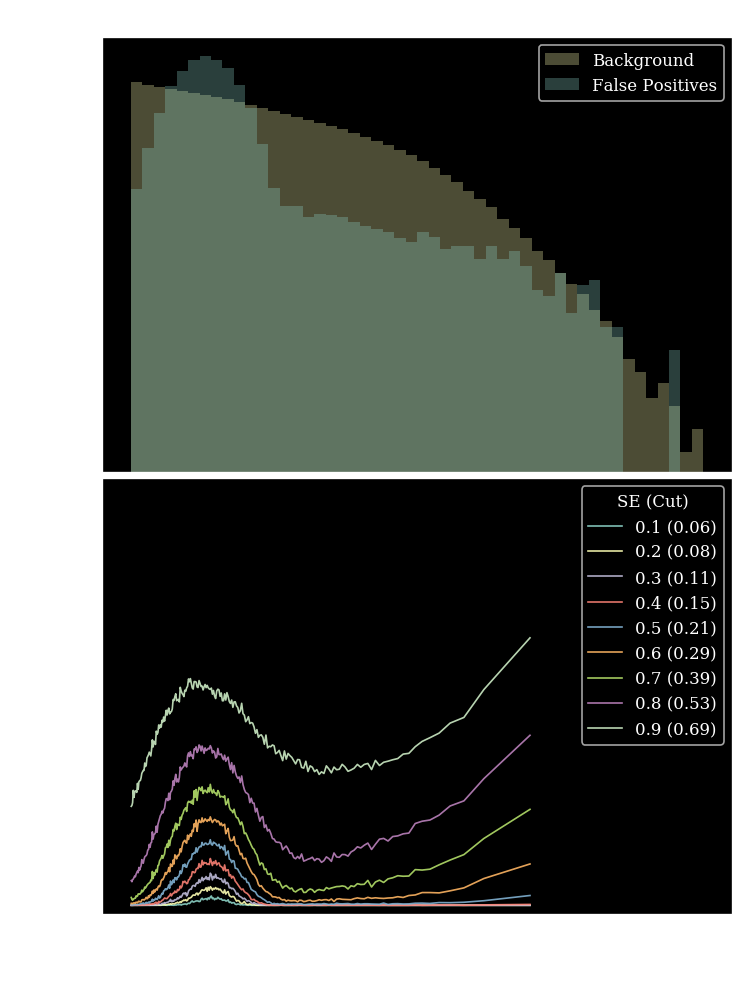

strength 2
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1350.8s)
 Train: loss:0.2291, acc:77% || Val: loss: 0.0607, acc:83%, R50: 19.7062, 1/JSD: 2.3516


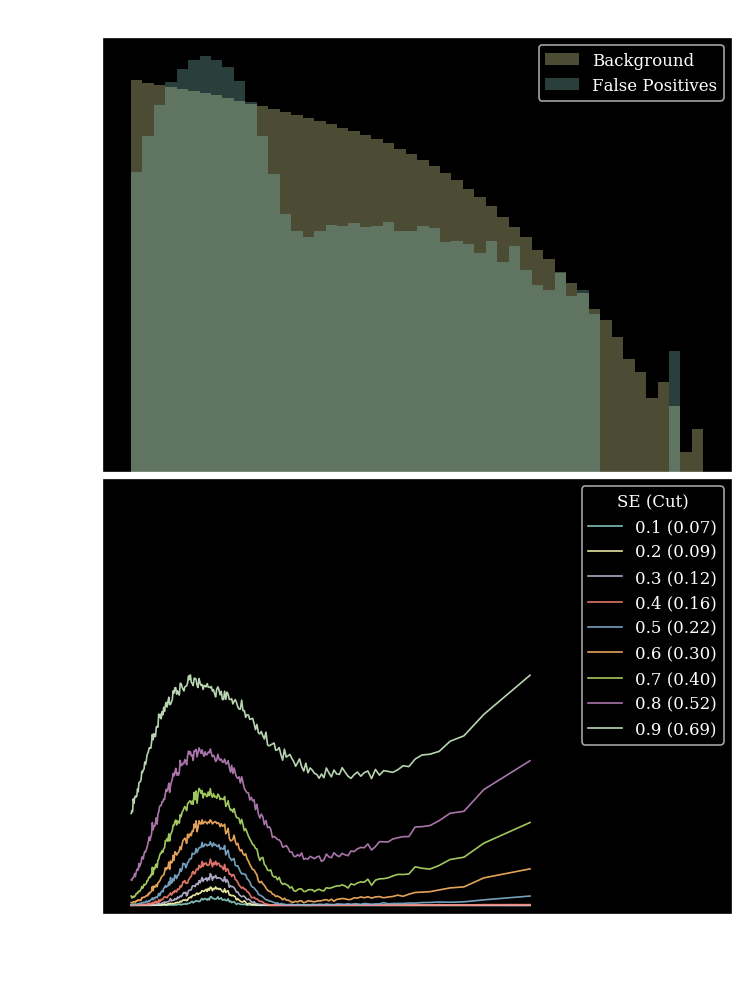

strength 5
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.6s)
 Train: loss:0.2420, acc:76% || Val: loss: 0.0648, acc:80%, R50: 14.4597, 1/JSD: 7.8746


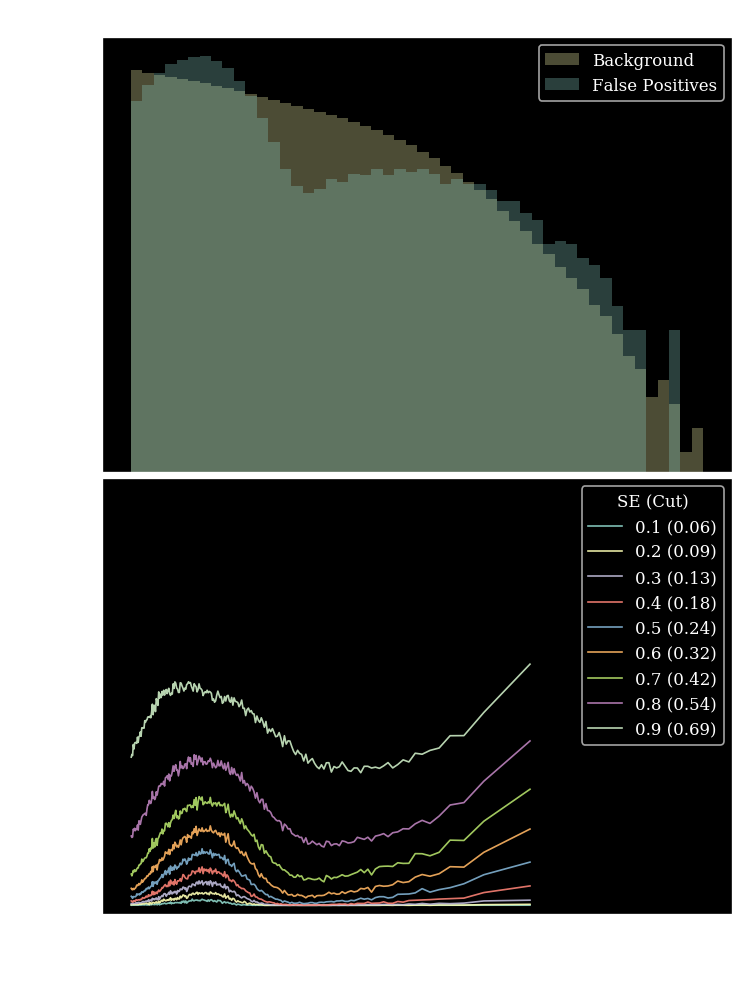

strength 5
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1389.5s)
 Train: loss:0.2599, acc:76% || Val: loss: 0.0626, acc:82%, R50: 16.9092, 1/JSD: 3.3416


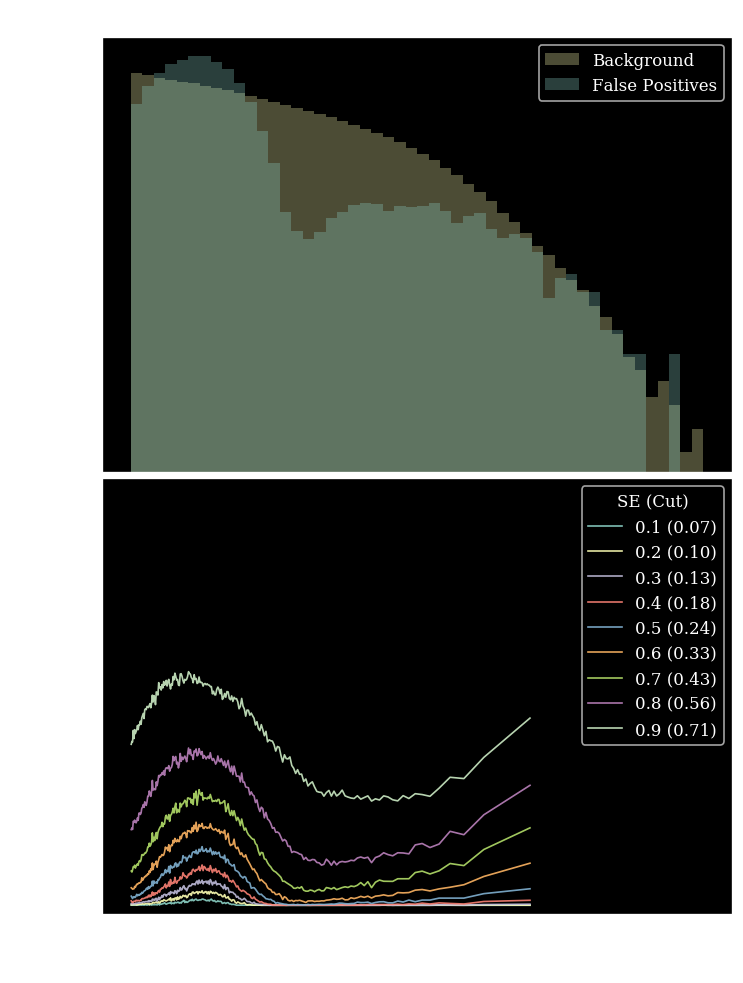

strength 5
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1350.1s)
 Train: loss:0.2782, acc:77% || Val: loss: 0.0626, acc:81%, R50: 15.9359, 1/JSD: 3.4832


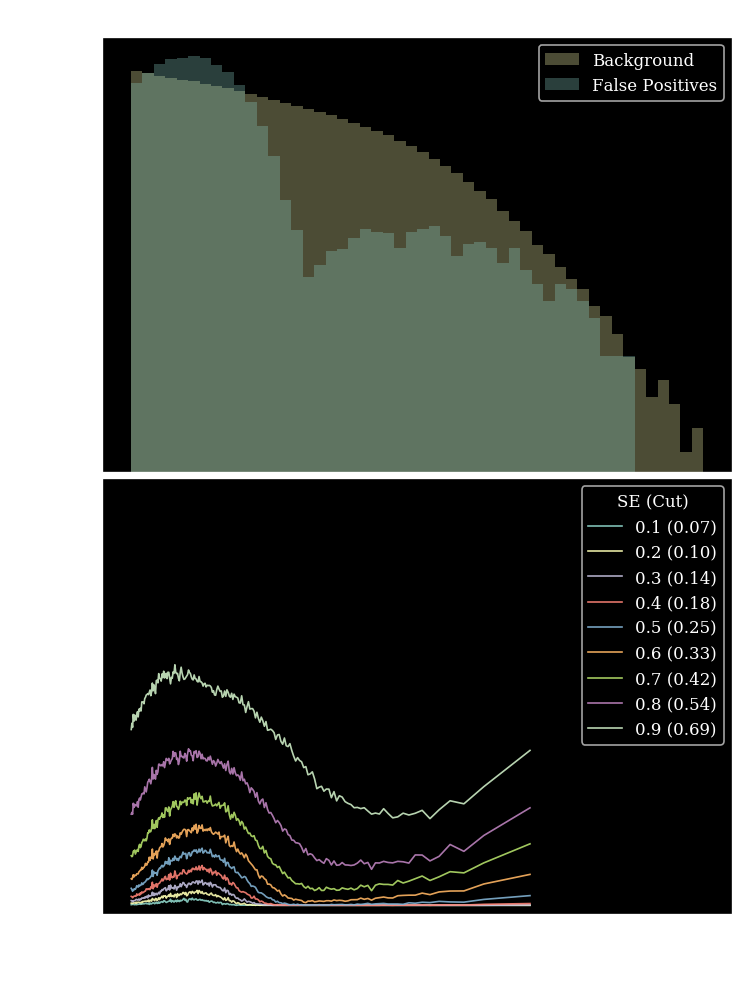

strength 10
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1398.9s)
 Train: loss:0.2667, acc:74% || Val: loss: 0.0679, acc:80%, R50: 11.5737, 1/JSD: 12.5658


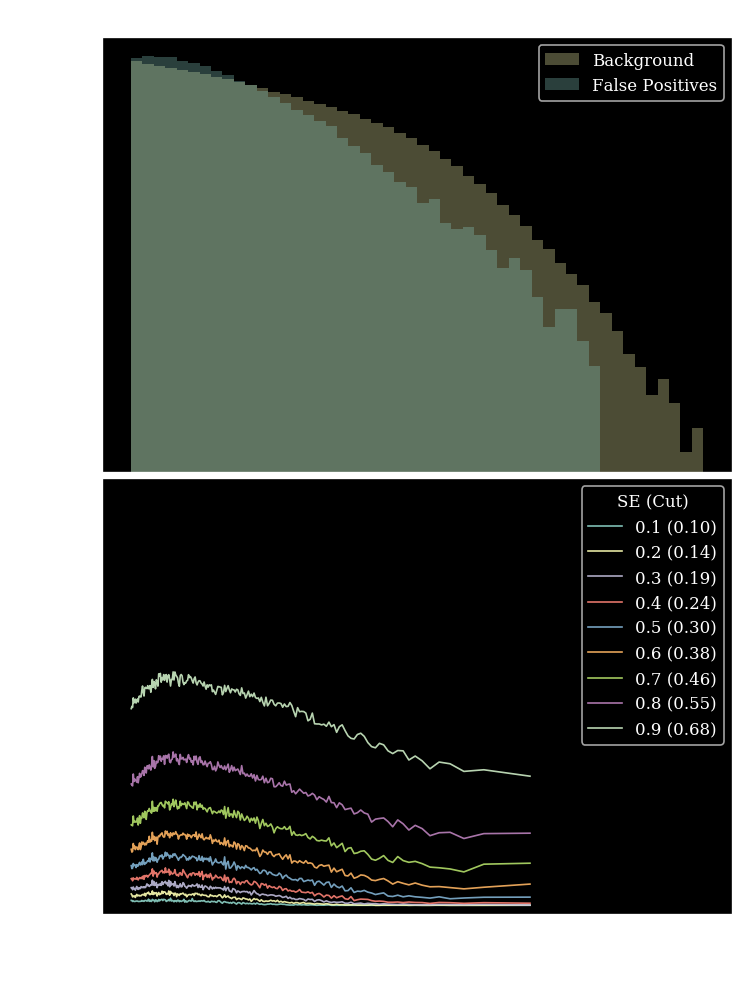

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1388.7s)
 Train: loss:0.2889, acc:75% || Val: loss: 0.0654, acc:80%, R50: 13.3054, 1/JSD: 10.7826


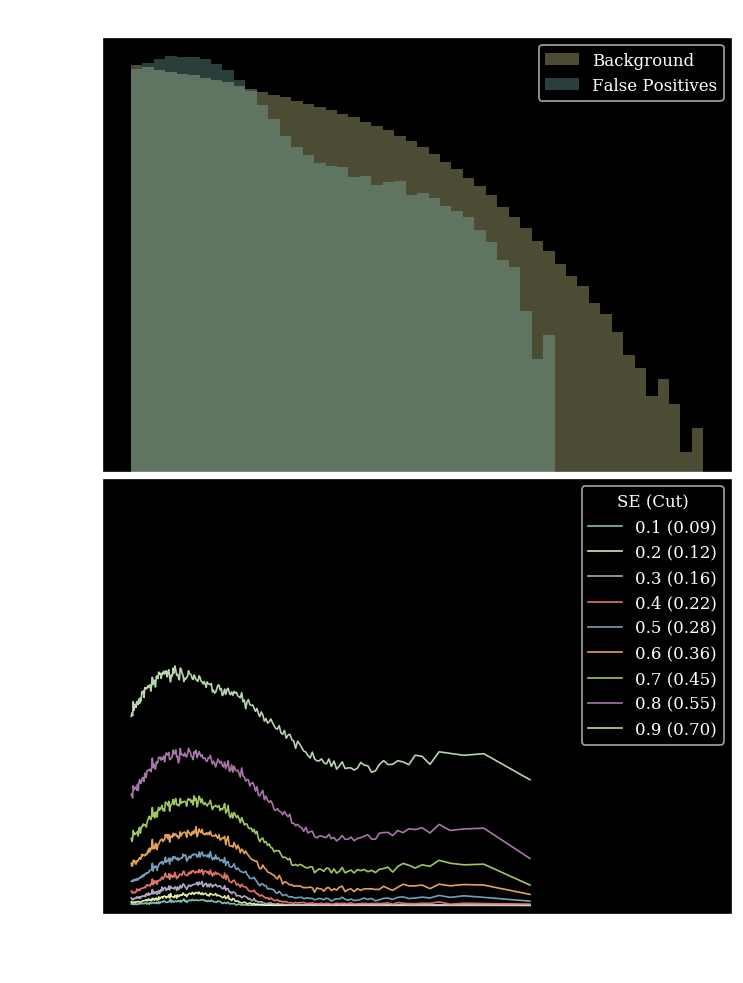

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1352.8s)
 Train: loss:0.3265, acc:75% || Val: loss: 0.0657, acc:79%, R50: 12.9681, 1/JSD: 10.6218


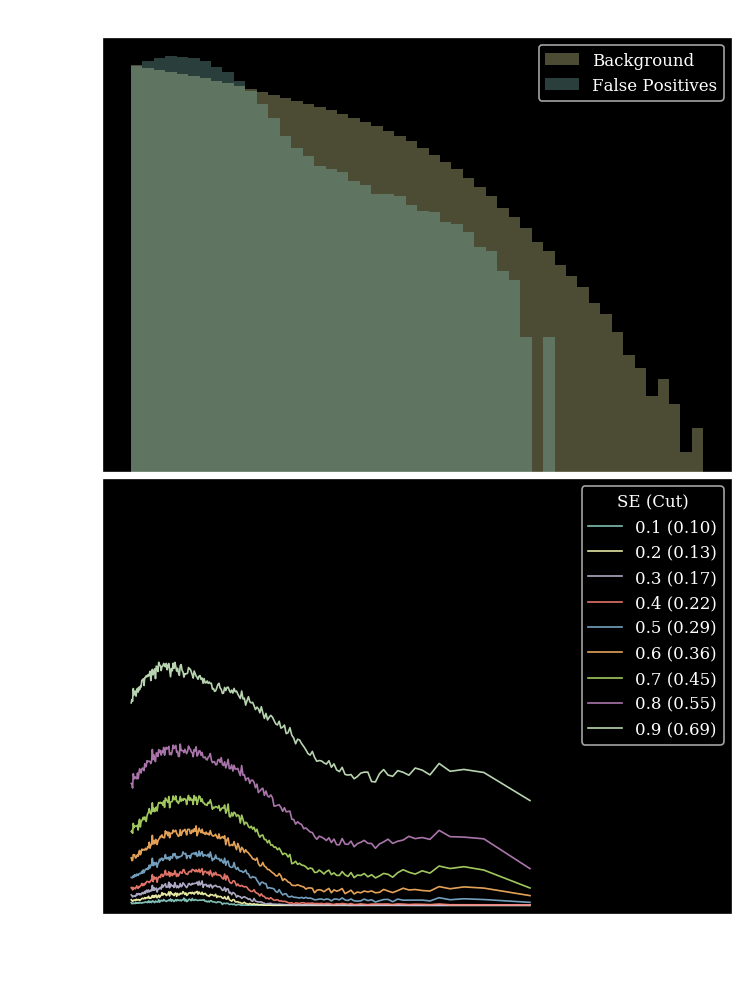

strength 50
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1401.8s)
 Train: loss:0.3172, acc:72% || Val: loss: 0.0736, acc:74%, R50: 8.4600, 1/JSD: 187.9386


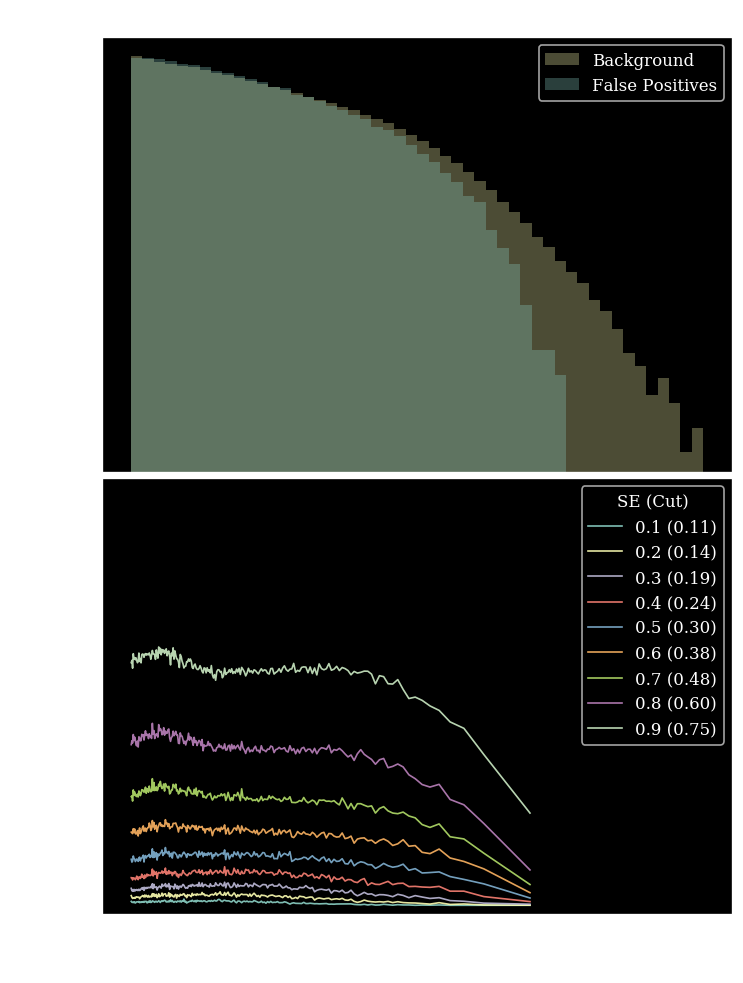

strength 50
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1390.5s)
 Train: loss:0.3830, acc:72% || Val: loss: 0.0743, acc:73%, R50: 8.1904, 1/JSD: 375.3986


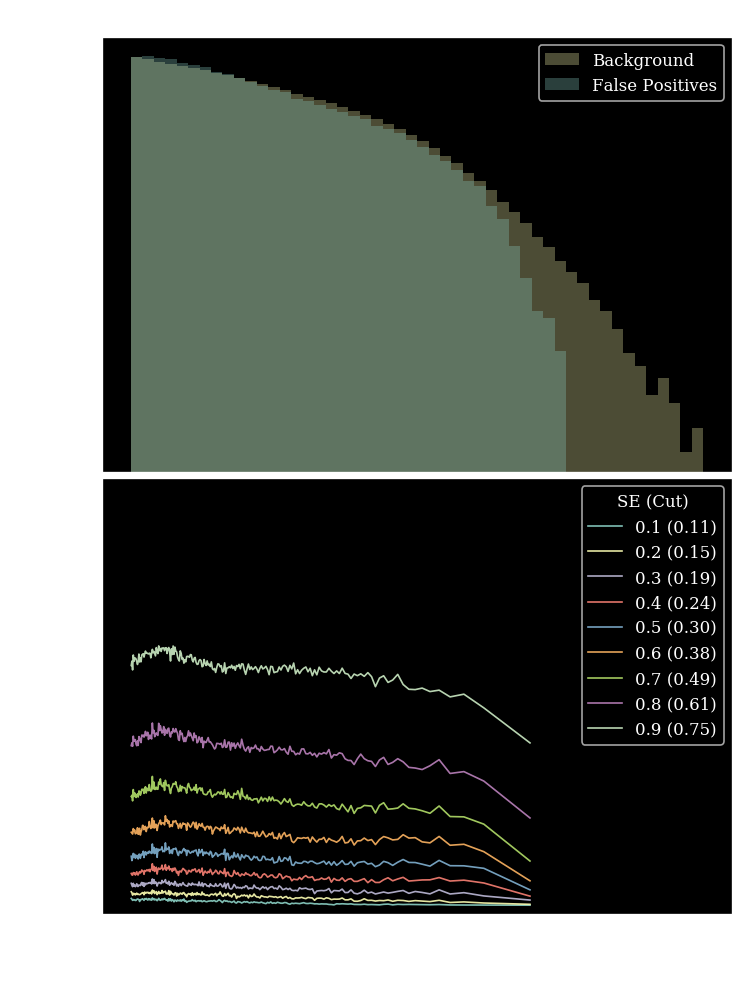

strength 50
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1352.5s)
 Train: loss:0.5870, acc:71% || Val: loss: 0.0744, acc:73%, R50: 8.1457, 1/JSD: 276.9085


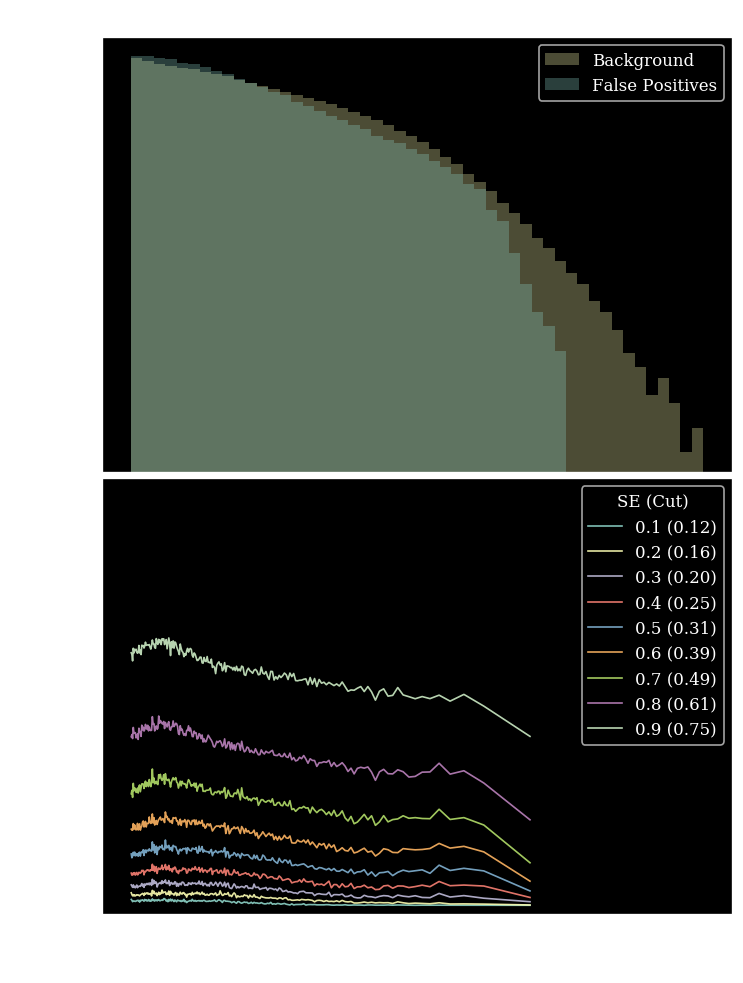

strength 60
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1400.2s)
 Train: loss:0.3308, acc:72% || Val: loss: 0.0743, acc:74%, R50: 8.3841, 1/JSD: 262.9867


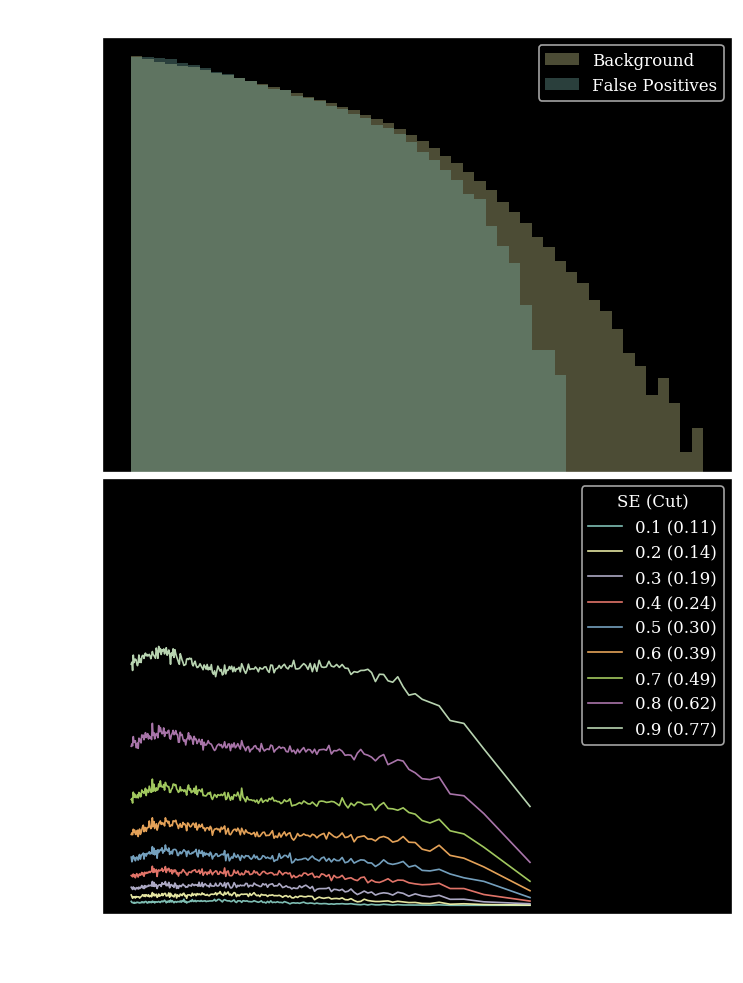

strength 60
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1390.7s)
 Train: loss:0.4098, acc:72% || Val: loss: 0.0751, acc:73%, R50: 8.0356, 1/JSD: 363.6162


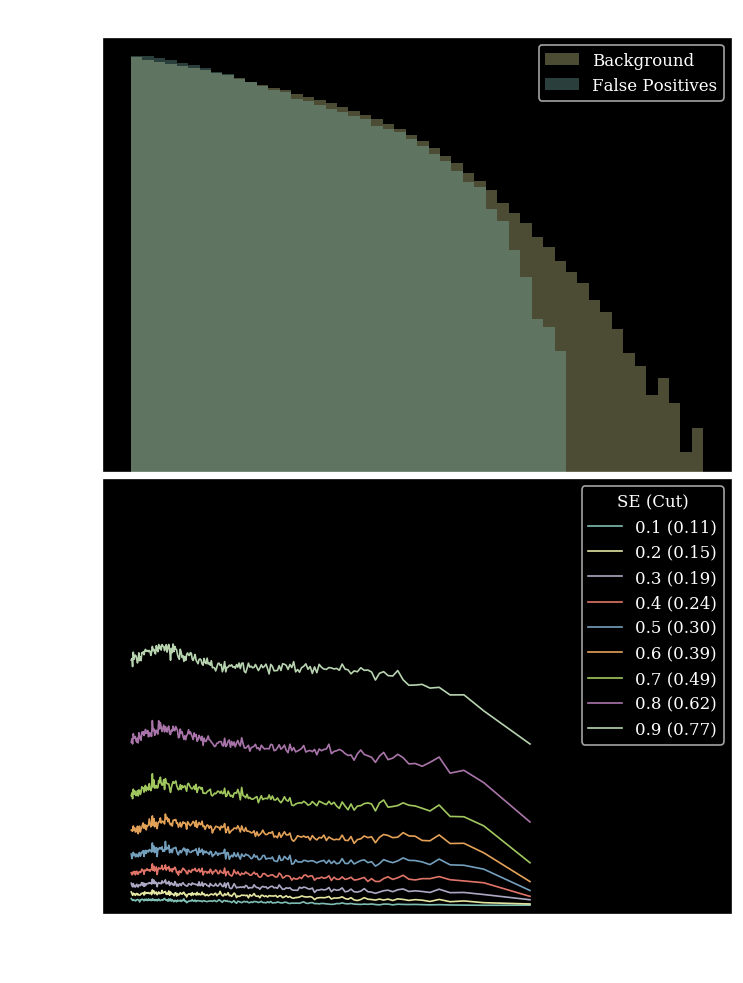

strength 60
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1352.8s)
 Train: loss:0.6660, acc:70% || Val: loss: 0.0755, acc:74%, R50: 7.9574, 1/JSD: 271.5380


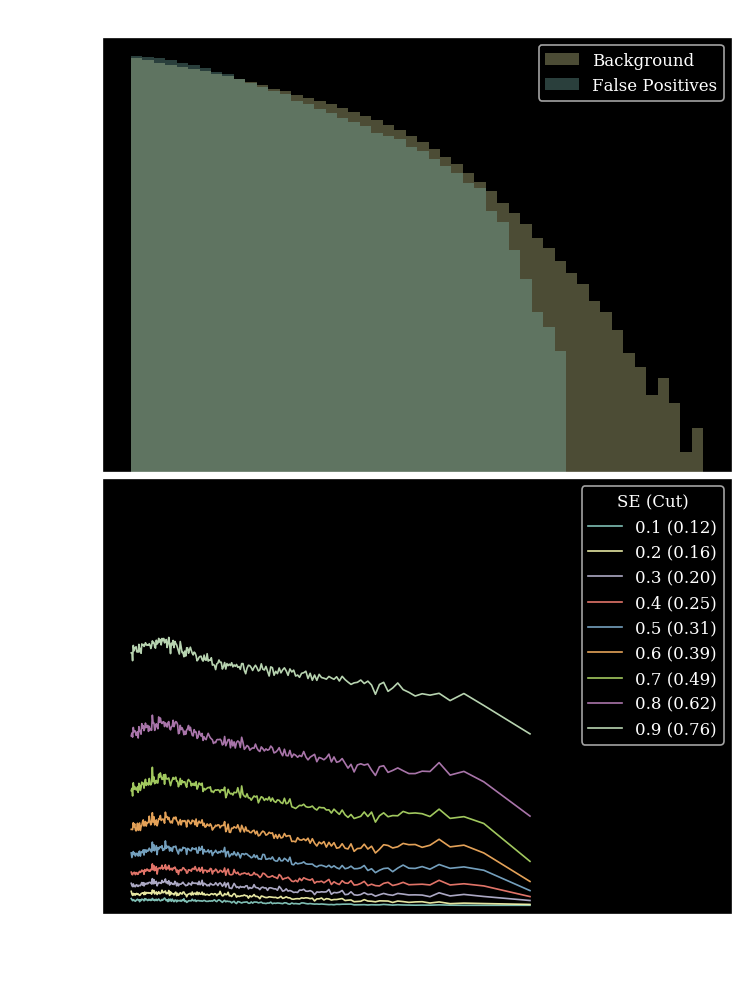

strength 75
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1400.2s)
 Train: loss:0.3604, acc:71% || Val: loss: 0.0756, acc:74%, R50: 8.0795, 1/JSD: 308.1129


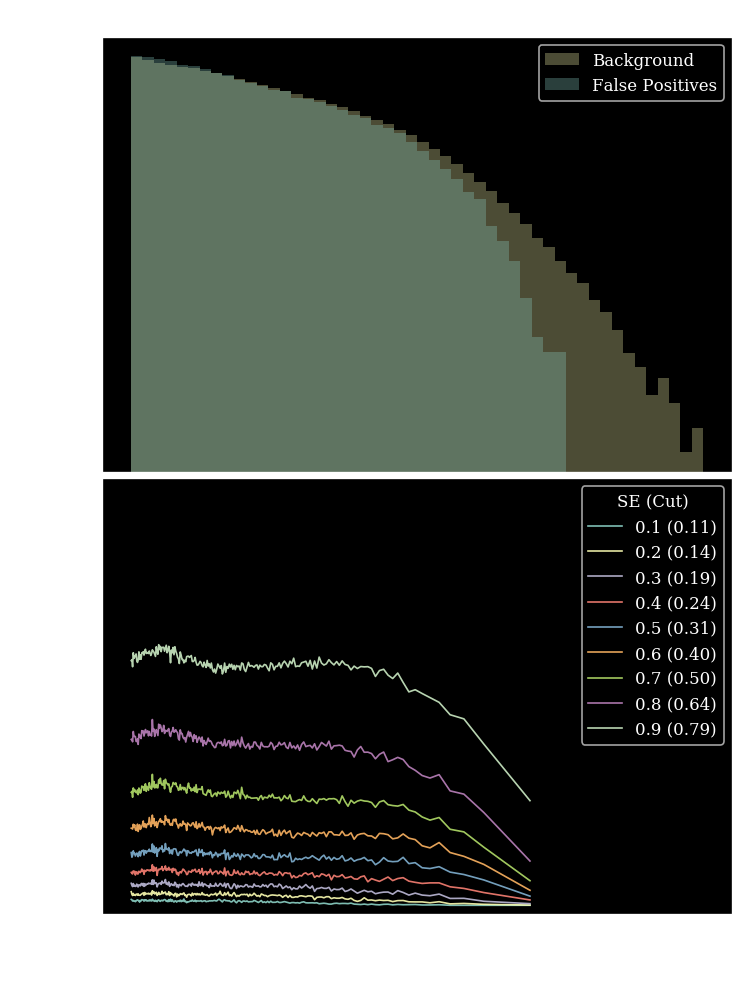

strength 75
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1390.0s)
 Train: loss:0.4537, acc:71% || Val: loss: 0.0766, acc:73%, R50: 7.7948, 1/JSD: 319.3145


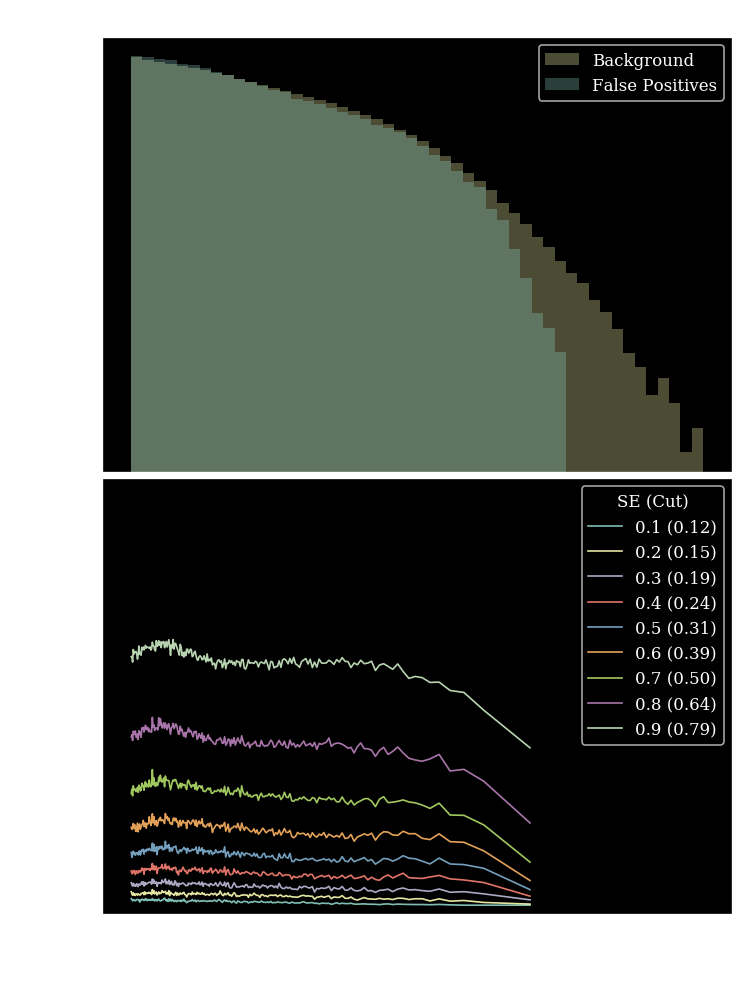

strength 75
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1351.4s)
 Train: loss:0.7798, acc:70% || Val: loss: 0.0767, acc:74%, R50: 7.8079, 1/JSD: 220.1036


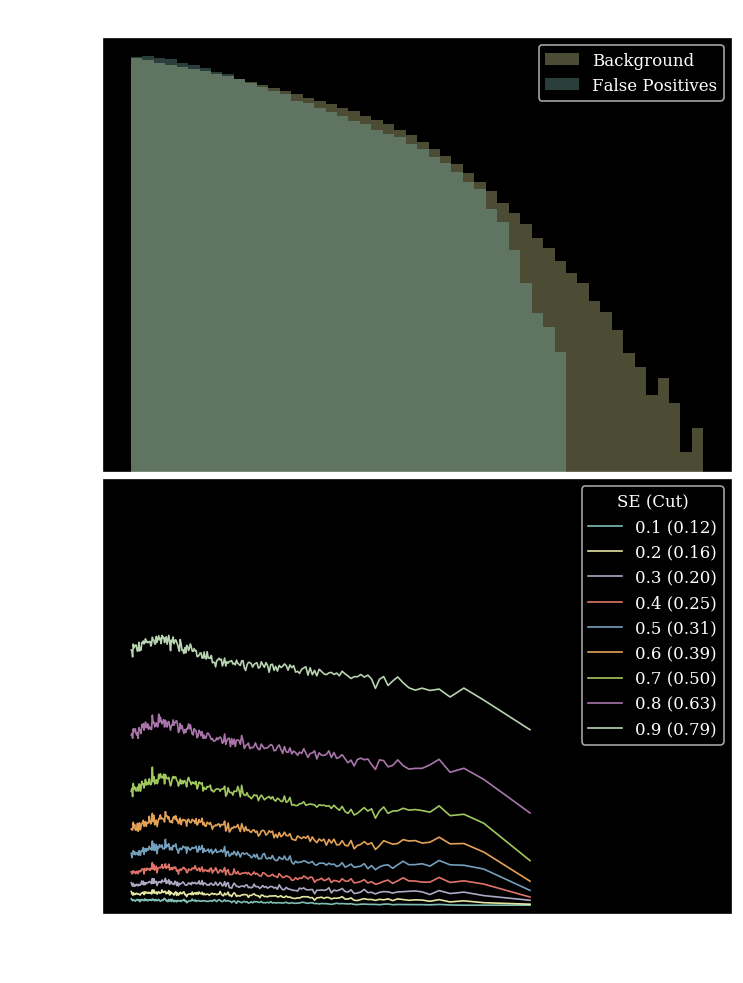

strength 85
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1401.8s)
 Train: loss:0.3719, acc:71% || Val: loss: 0.0766, acc:74%, R50: 7.9909, 1/JSD: 300.2098


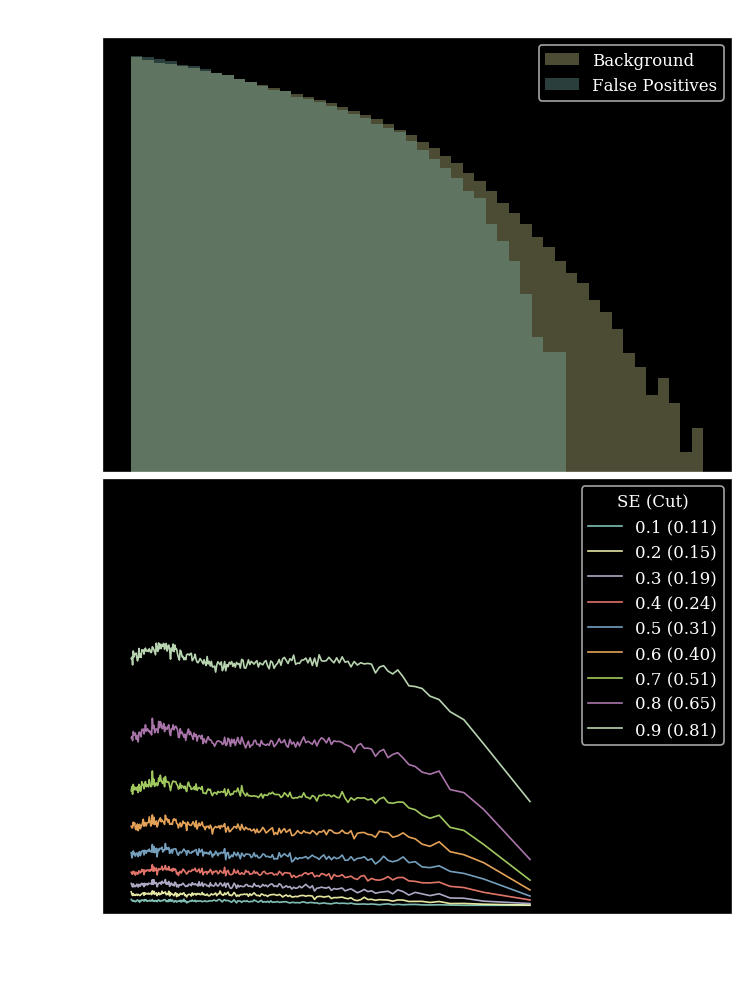

strength 85
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1389.7s)
 Train: loss:0.4767, acc:70% || Val: loss: 0.0775, acc:74%, R50: 7.6808, 1/JSD: 268.7627


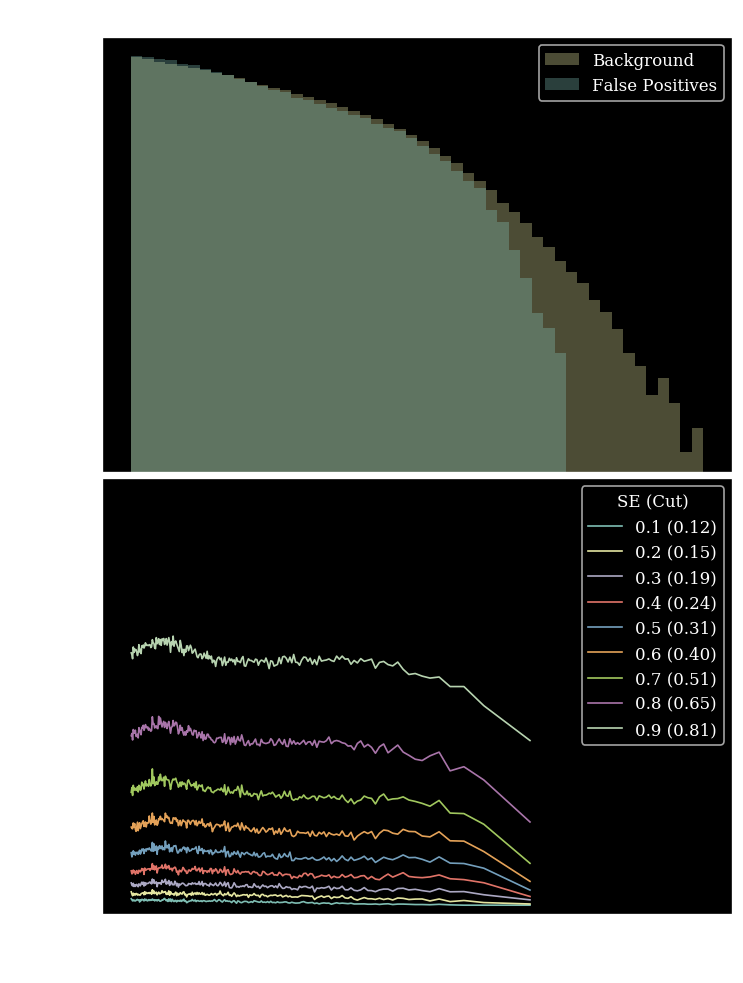

strength 85
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1351.0s)
 Train: loss:0.8480, acc:69% || Val: loss: 0.0778, acc:75%, R50: 7.7225, 1/JSD: 208.0504


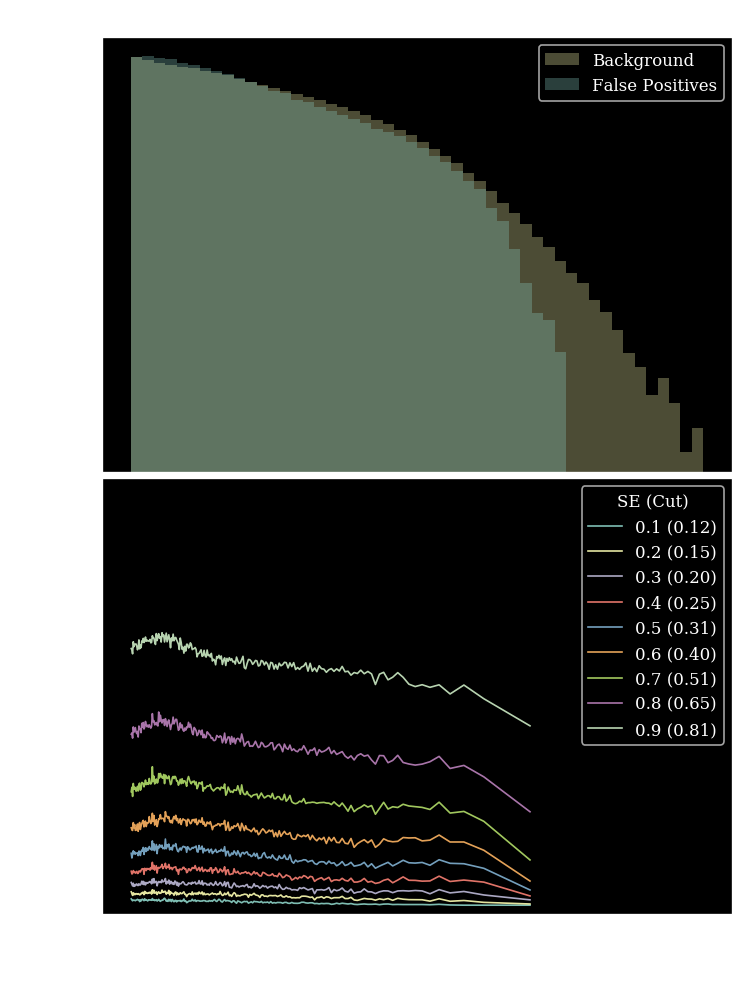

strength 100
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.2s)
 Train: loss:0.3828, acc:70% || Val: loss: 0.0775, acc:74%, R50: 7.9002, 1/JSD: 222.1152


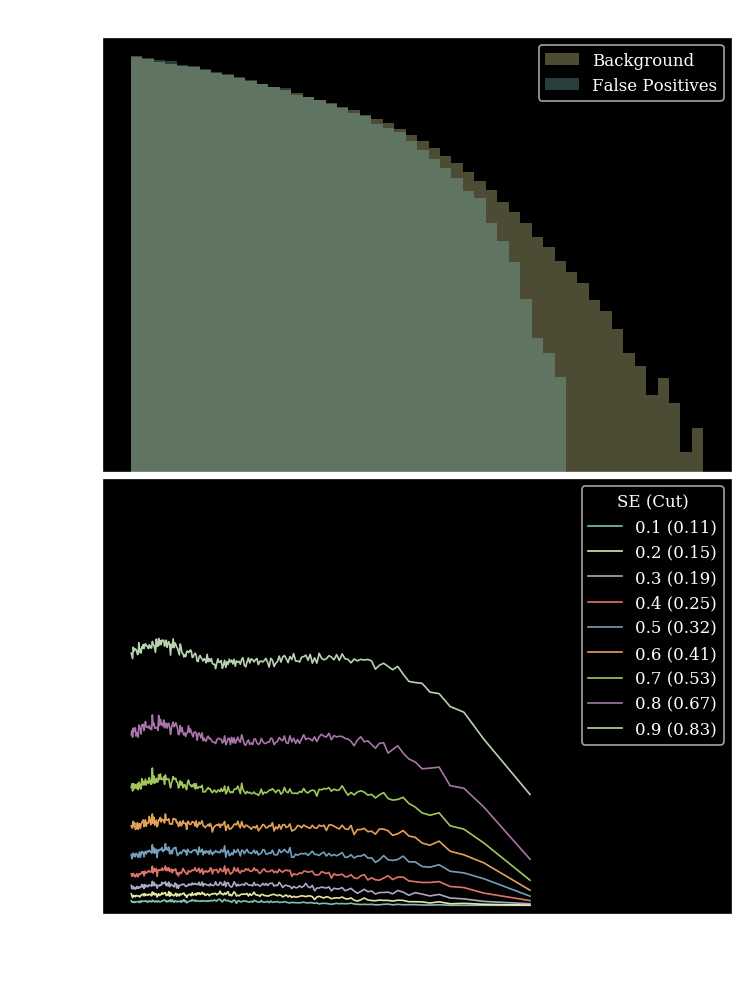

strength 100
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1389.5s)
 Train: loss:0.4958, acc:69% || Val: loss: 0.0788, acc:74%, R50: 7.6183, 1/JSD: 222.5255


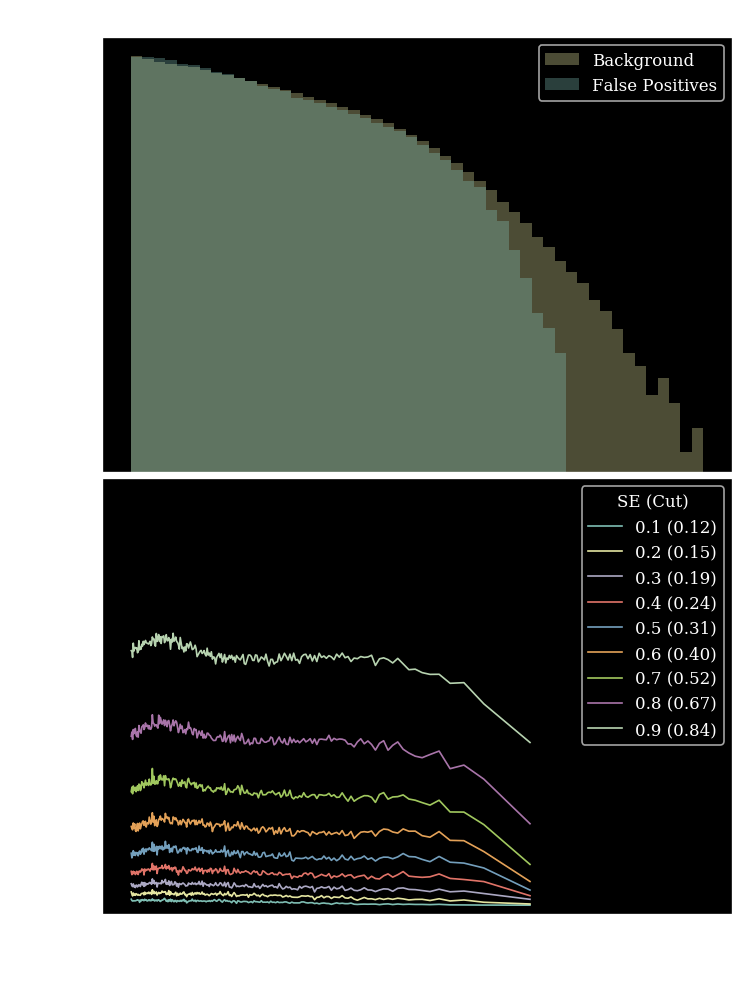

strength 100
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1352.9s)
 Train: loss:0.9470, acc:68% || Val: loss: 0.0792, acc:75%, R50: 7.6346, 1/JSD: 248.2163


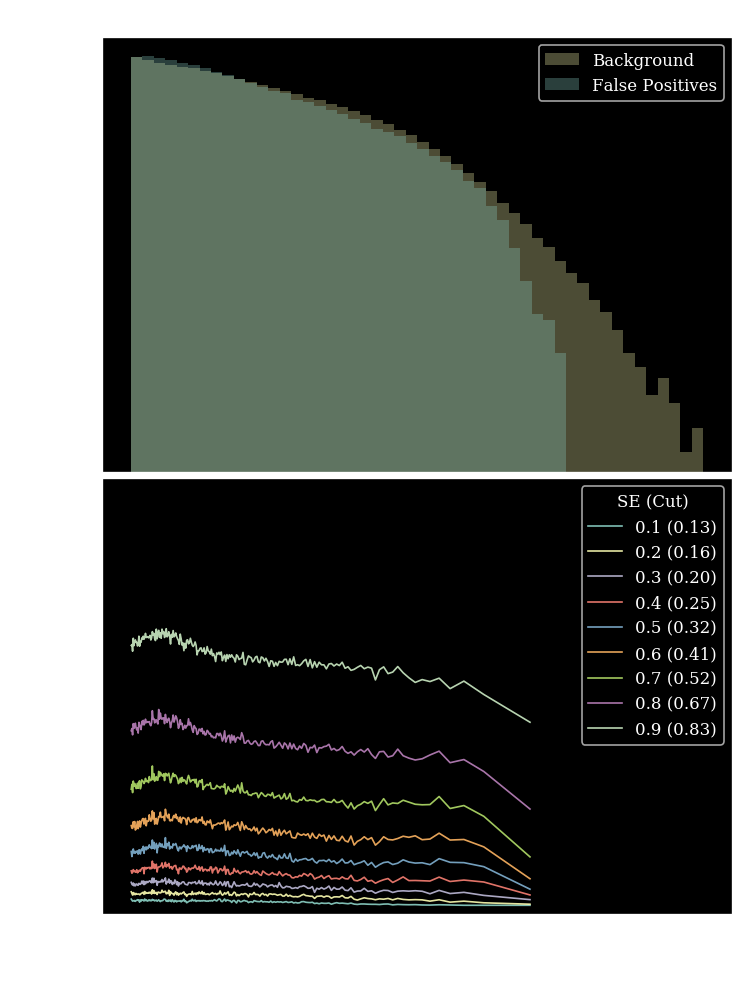

strength 110
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.8s)
 Train: loss:0.4040, acc:69% || Val: loss: 0.0785, acc:74%, R50: 7.7713, 1/JSD: 254.7890


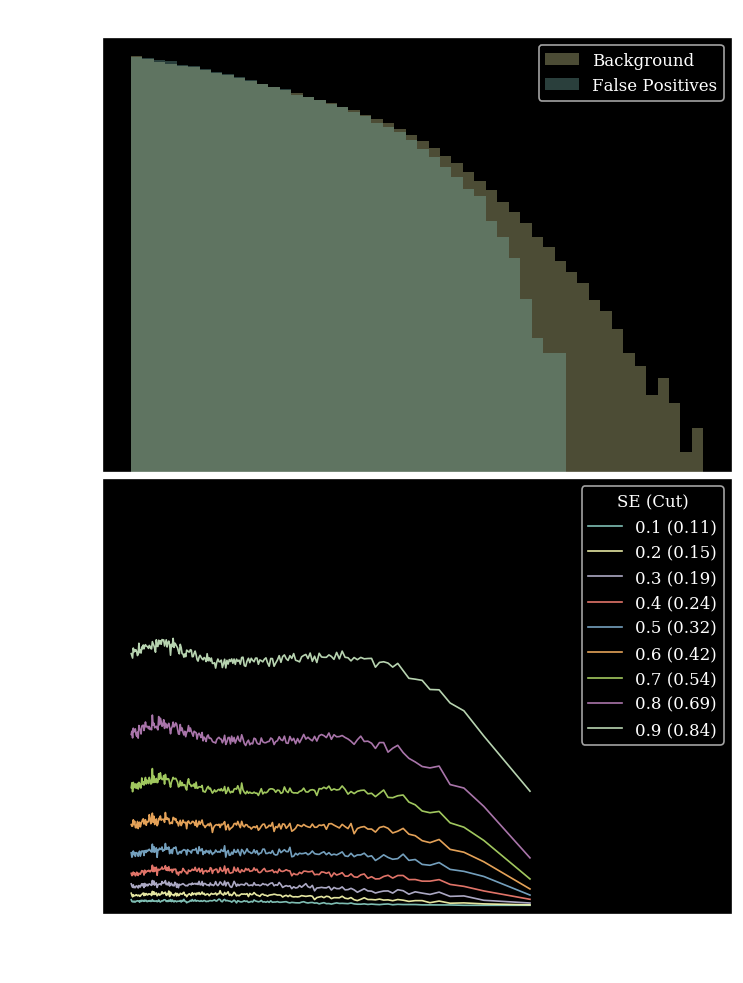

strength 110
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1390.0s)
 Train: loss:0.5130, acc:69% || Val: loss: 0.0800, acc:74%, R50: 7.5039, 1/JSD: 167.0224


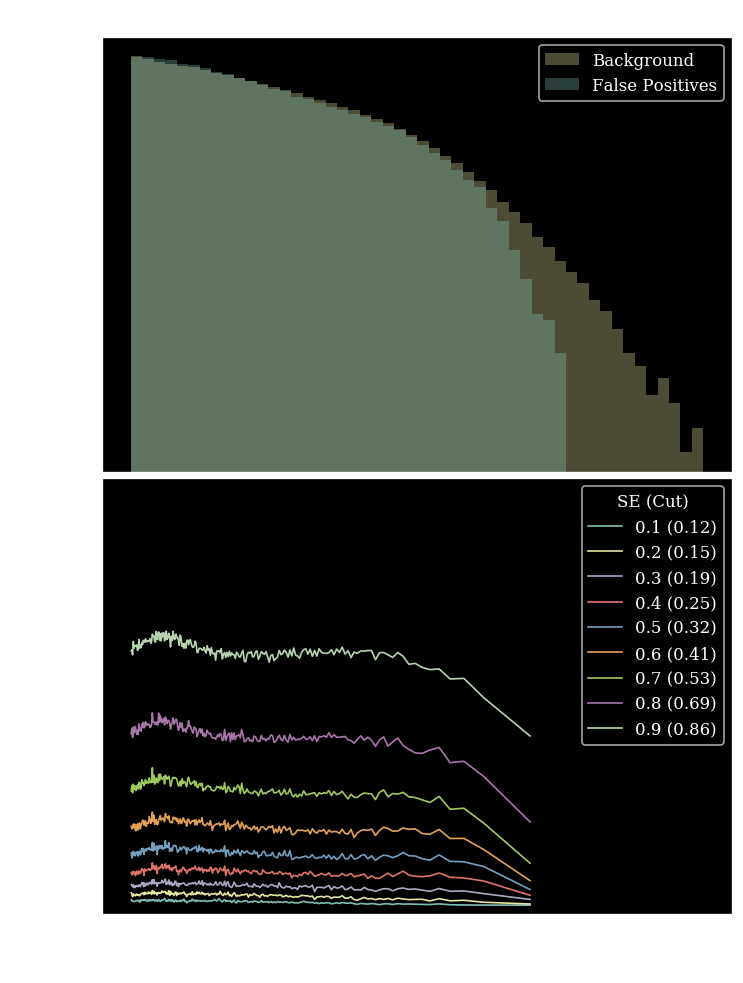

strength 110
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1351.5s)
 Train: loss:1.0109, acc:67% || Val: loss: 0.0802, acc:75%, R50: 7.3921, 1/JSD: 188.5784


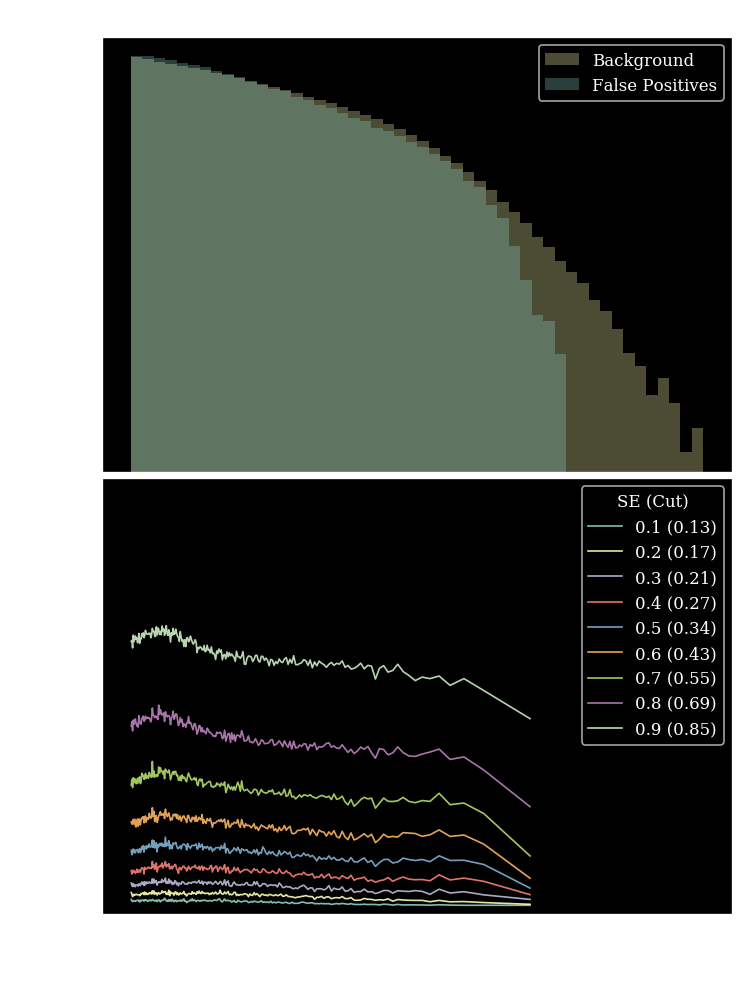

strength 120
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.8s)
 Train: loss:0.4143, acc:69% || Val: loss: 0.0794, acc:74%, R50: 7.7078, 1/JSD: 249.2883


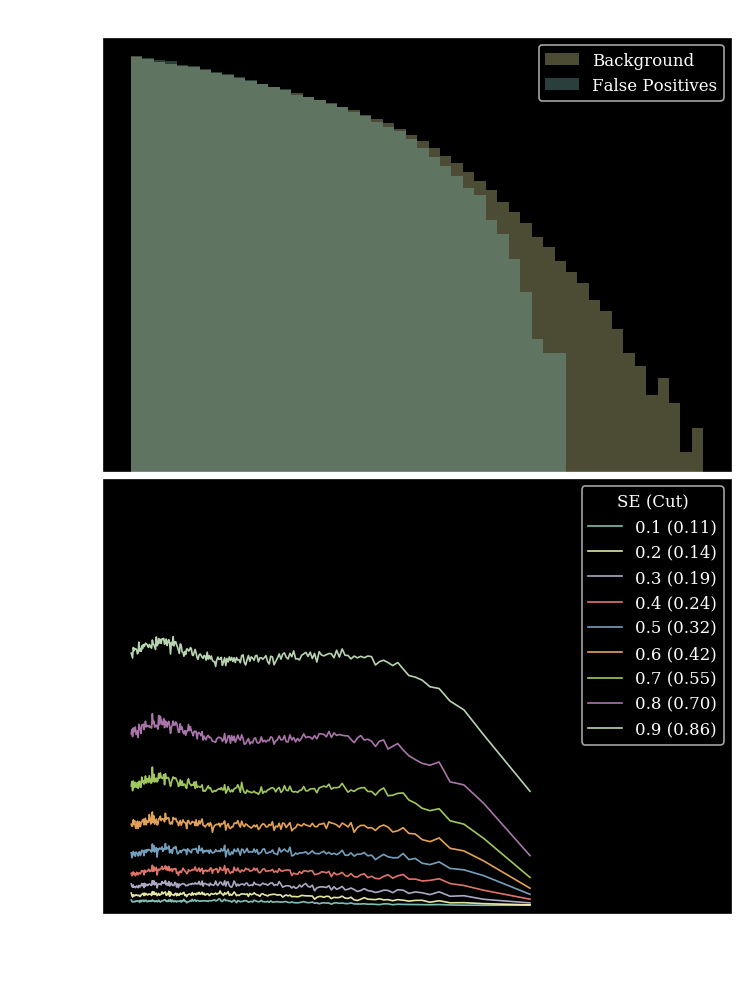

strength 120
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1389.7s)
 Train: loss:0.5378, acc:68% || Val: loss: 0.0806, acc:74%, R50: 7.4840, 1/JSD: 207.9463


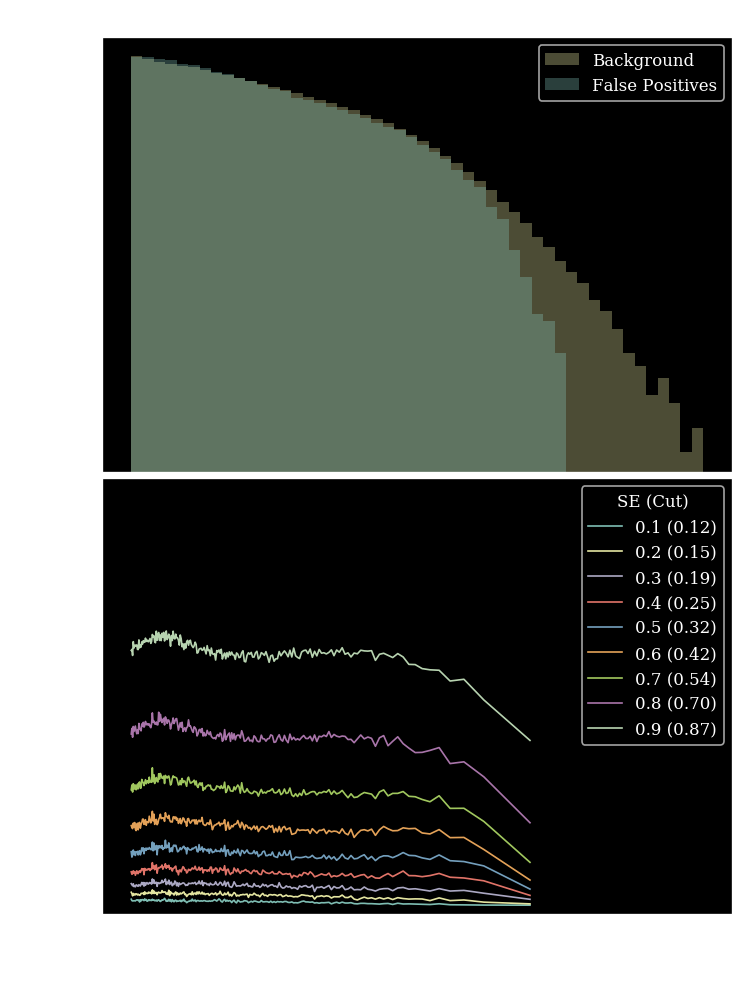

strength 120
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1350.8s)
 Train: loss:1.0750, acc:66% || Val: loss: 0.0819, acc:76%, R50: 7.5072, 1/JSD: 176.0911


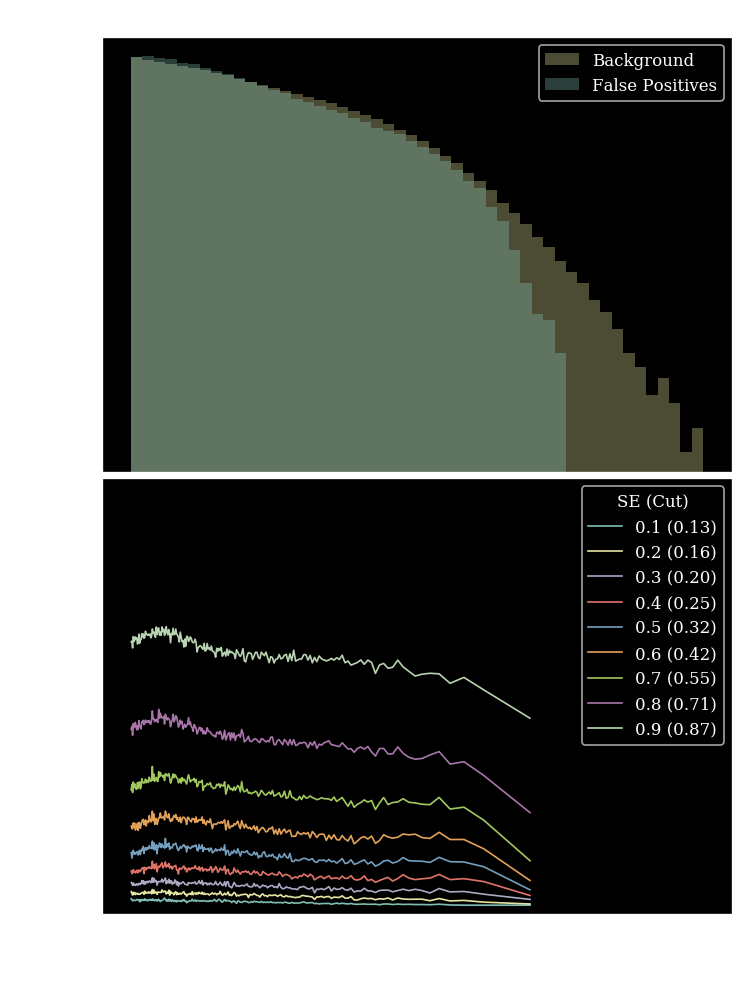

In [40]:
jsdR50flatstrMem = []
for i,frac in enumerate([1,2,5,10,50,60,75,85,100,110,120]):
    for bins in [5,10,32]:
        print("strength",frac)
        metrics_train_L = Metrics()
        metrics_val_L = Metrics(validation=True)

        torch.manual_seed(777)
        model_L = Classifier().to(device)
        optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
        loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=bins,memory=True)
        log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
        model_L.fit(traindataset=traindataset,
                    valdataset=valdataset,
                    optimizer=optimizer,
                    loss=loss,
                    **params,
                    log=log,
                  #scheduler=scheduler,
                  metrics=[metrics_train_L,metrics_val_L])
        model_L.train(False)
        out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,
                       y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
        jsdR50flatstrMem.append(out)

strength 150
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1407.2s)
 Train: loss:0.4408, acc:68% || Val: loss: 0.0819, acc:75%, R50: 7.6170, 1/JSD: 215.8916


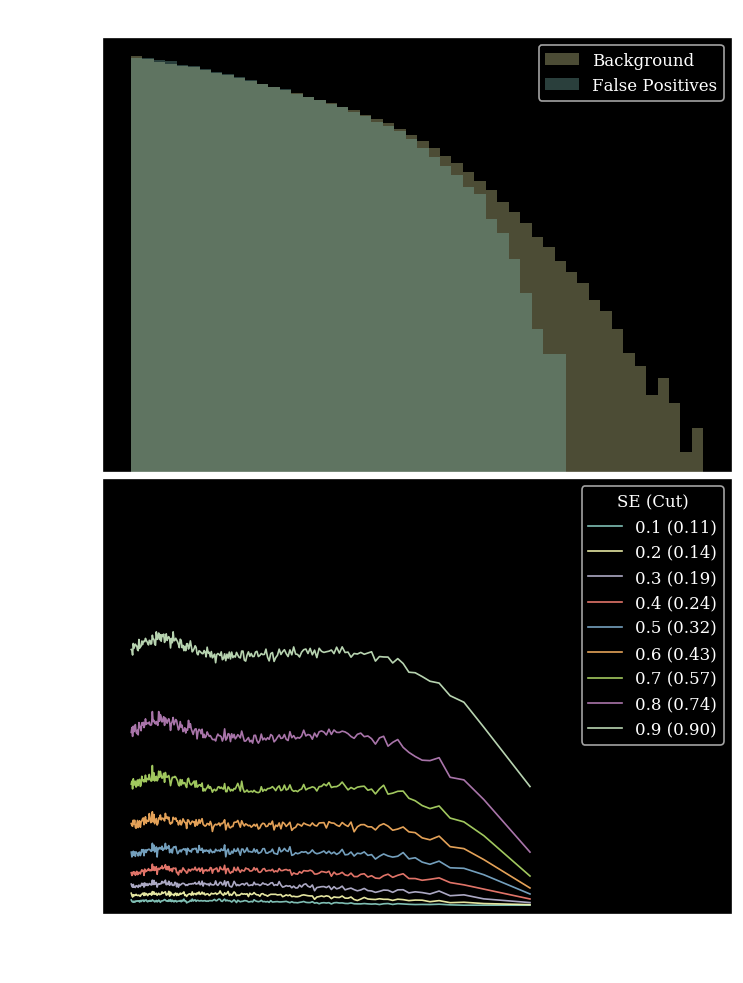

strength 150
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1395.0s)
 Train: loss:0.5881, acc:67% || Val: loss: 0.0836, acc:75%, R50: 7.3685, 1/JSD: 180.6132


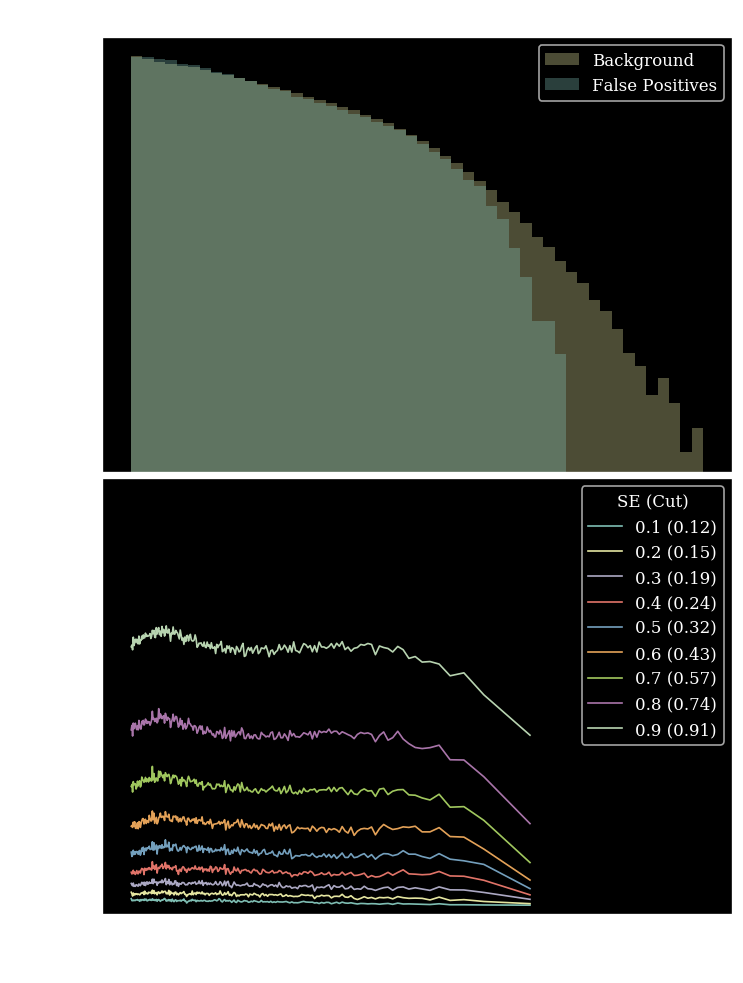

strength 150
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1357.7s)
 Train: loss:1.2608, acc:65% || Val: loss: 0.0845, acc:77%, R50: 7.3695, 1/JSD: 231.2407


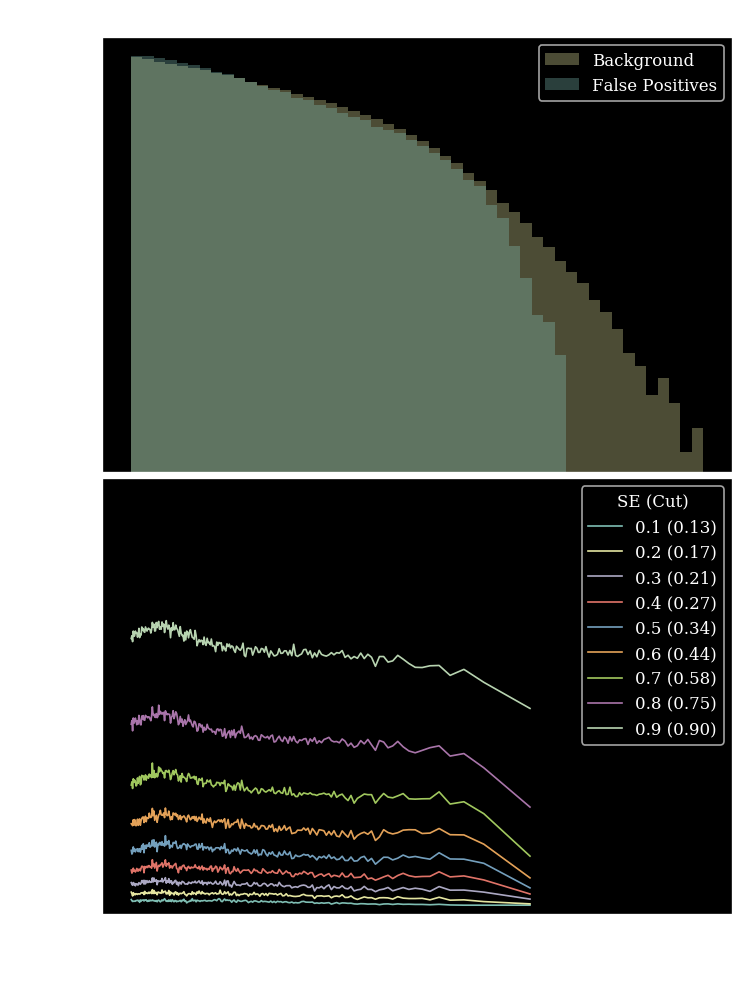

strength 175
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1406.5s)
 Train: loss:0.4686, acc:68% || Val: loss: 0.0837, acc:75%, R50: 7.5475, 1/JSD: 209.2772


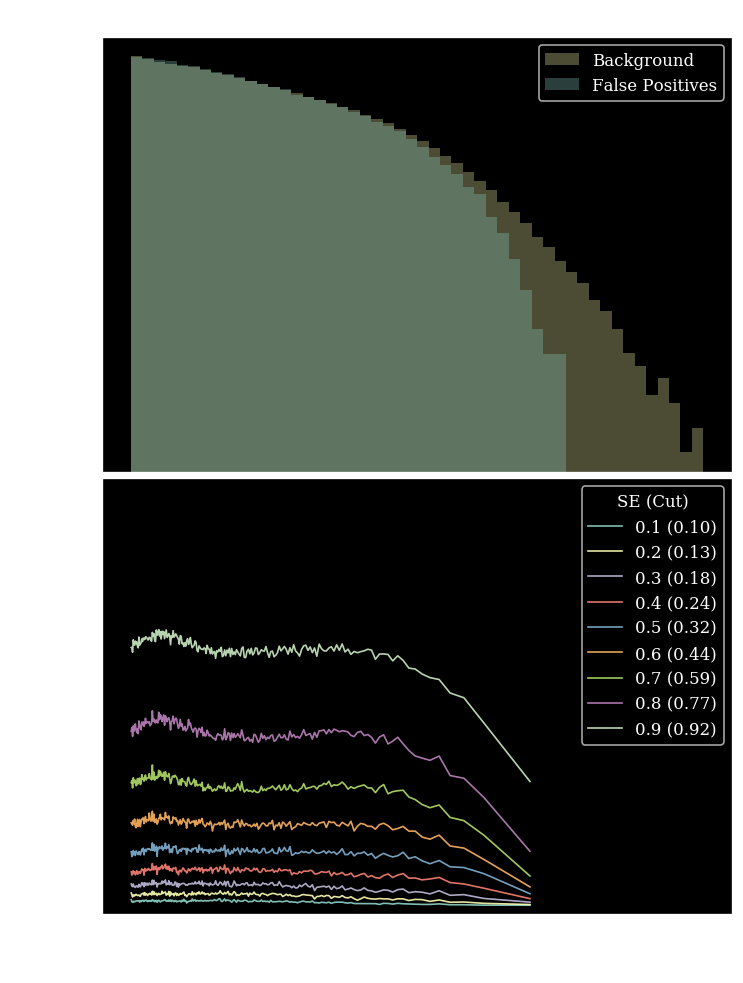

strength 175
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1396.9s)
 Train: loss:0.6183, acc:66% || Val: loss: 0.0855, acc:76%, R50: 7.3600, 1/JSD: 228.6976


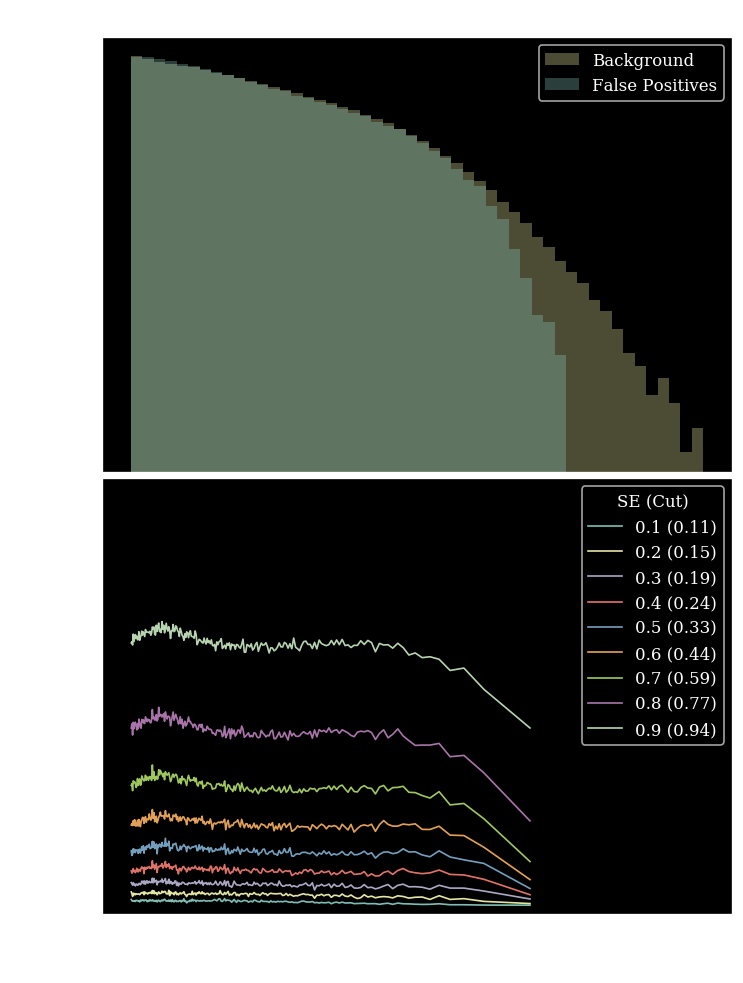

strength 175
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1360.8s)
 Train: loss:1.3831, acc:64% || Val: loss: 0.0866, acc:77%, R50: 7.2305, 1/JSD: 216.4920


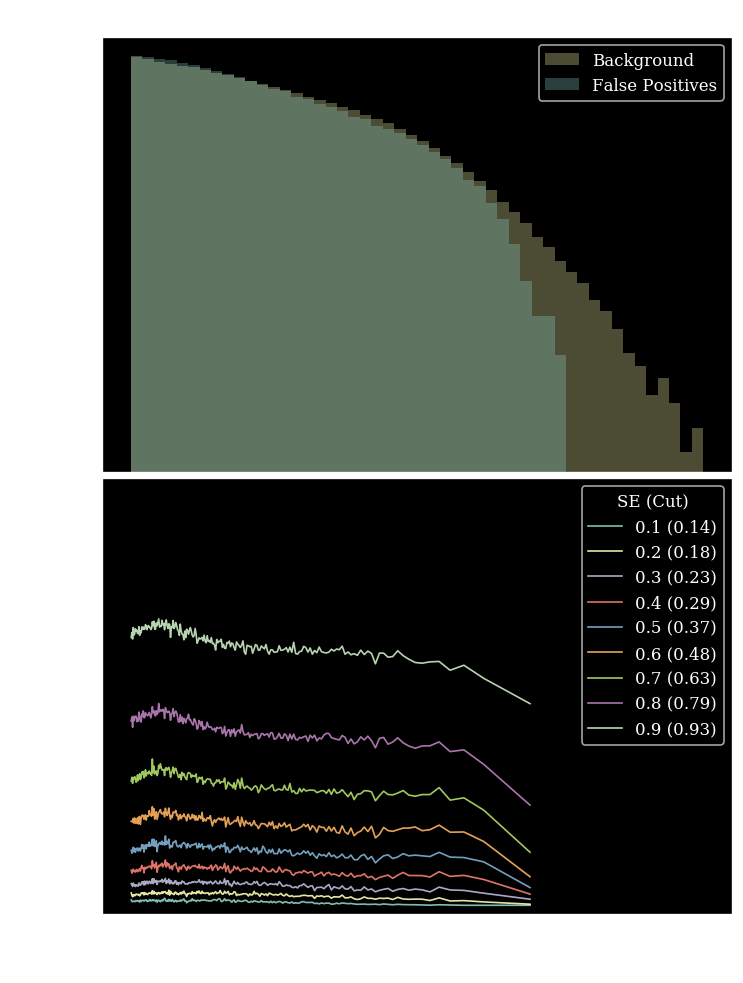

strength 200
Entering Training...
Epoch:0001/0200  (8.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1506.4s)
 Train: loss:0.4872, acc:67% || Val: loss: 0.0856, acc:76%, R50: 7.4755, 1/JSD: 196.0764


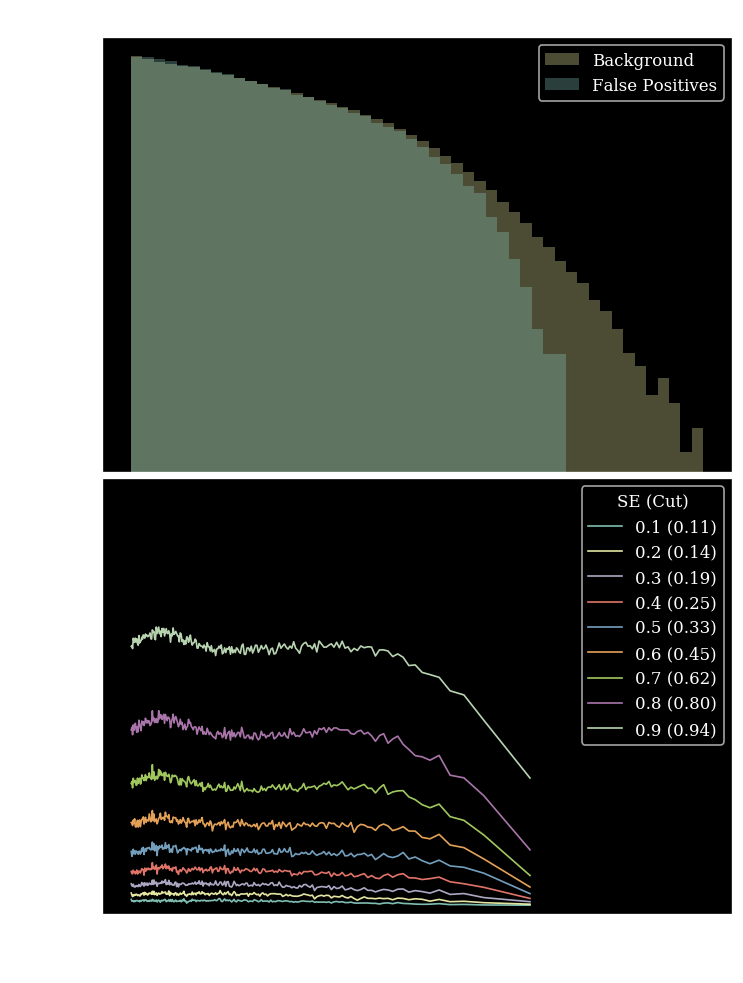

strength 200
Entering Training...
Epoch:0001/0200  (11.8 s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1631.5s)
 Train: loss:0.6572, acc:66% || Val: loss: 0.0872, acc:76%, R50: 7.3510, 1/JSD: 226.4856


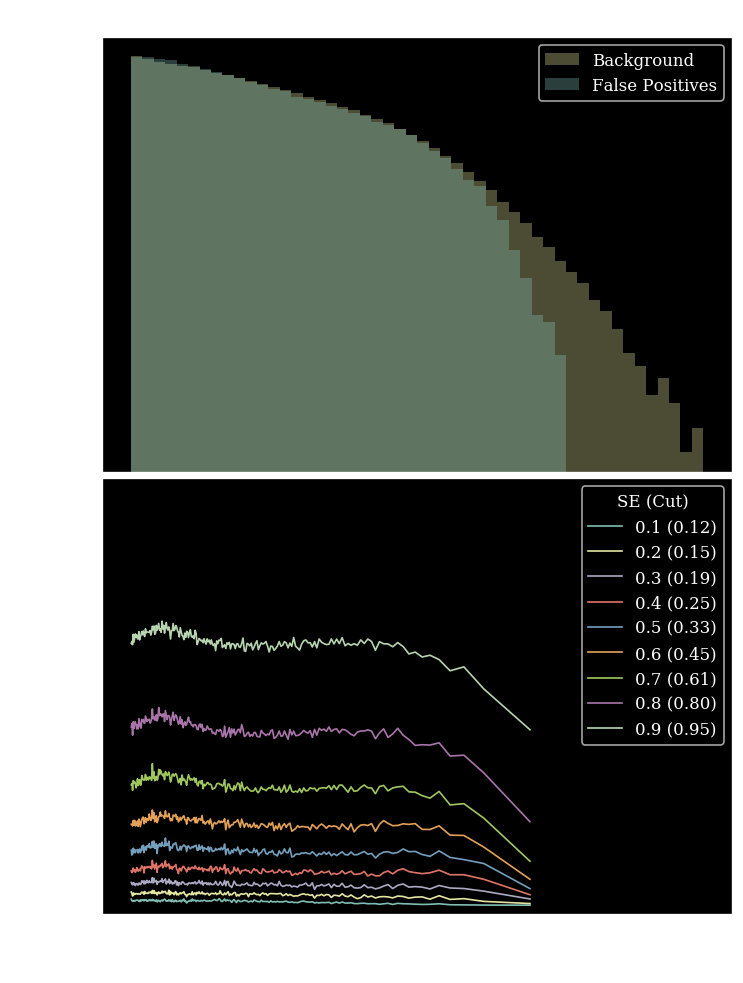

strength 200
Entering Training...
Epoch:0001/0200  (9.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1582.2s)
 Train: loss:1.5372, acc:63% || Val: loss: 0.0886, acc:78%, R50: 7.2081, 1/JSD: 236.2091


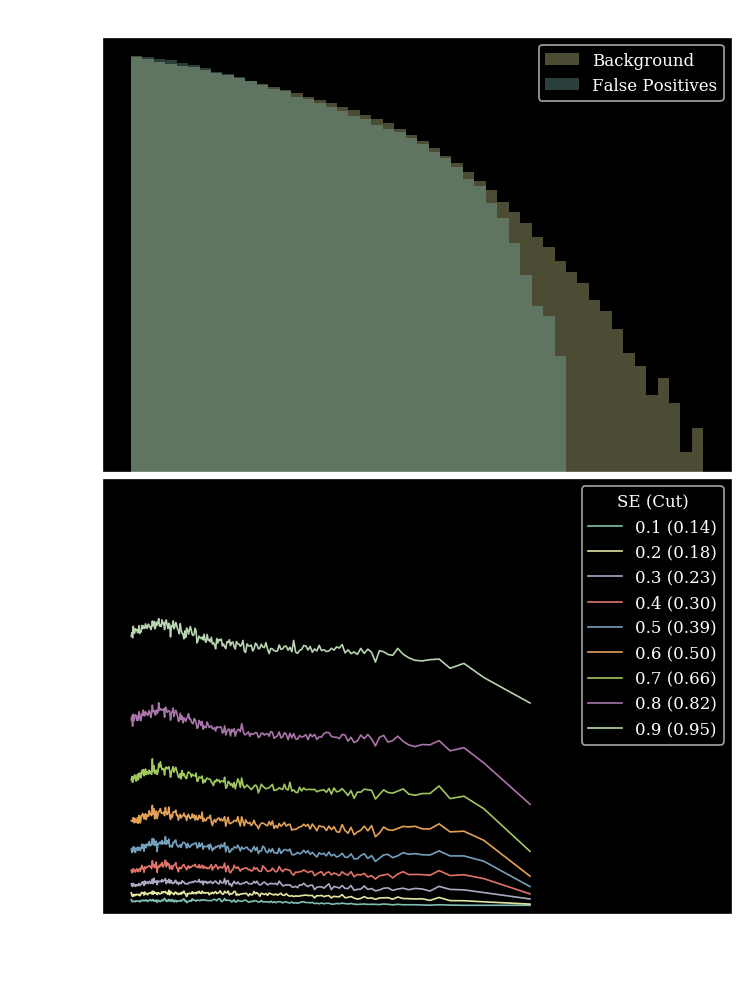

strength 228
Entering Training...
Epoch:0001/0200  (10.1 s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1589.1s)
 Train: loss:0.5186, acc:66% || Val: loss: 0.0873, acc:76%, R50: 7.4578, 1/JSD: 214.8439


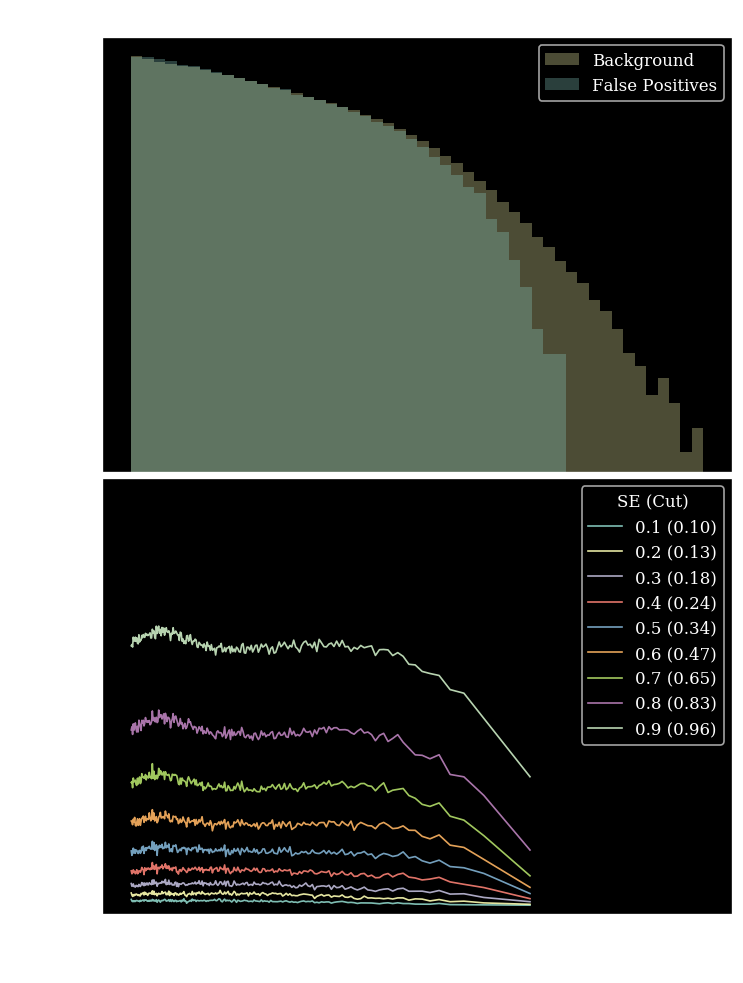

strength 228
Entering Training...
Epoch:0001/0200  (13.0 s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1619.4s)
 Train: loss:0.7082, acc:65% || Val: loss: 0.0890, acc:77%, R50: 7.3120, 1/JSD: 196.9292


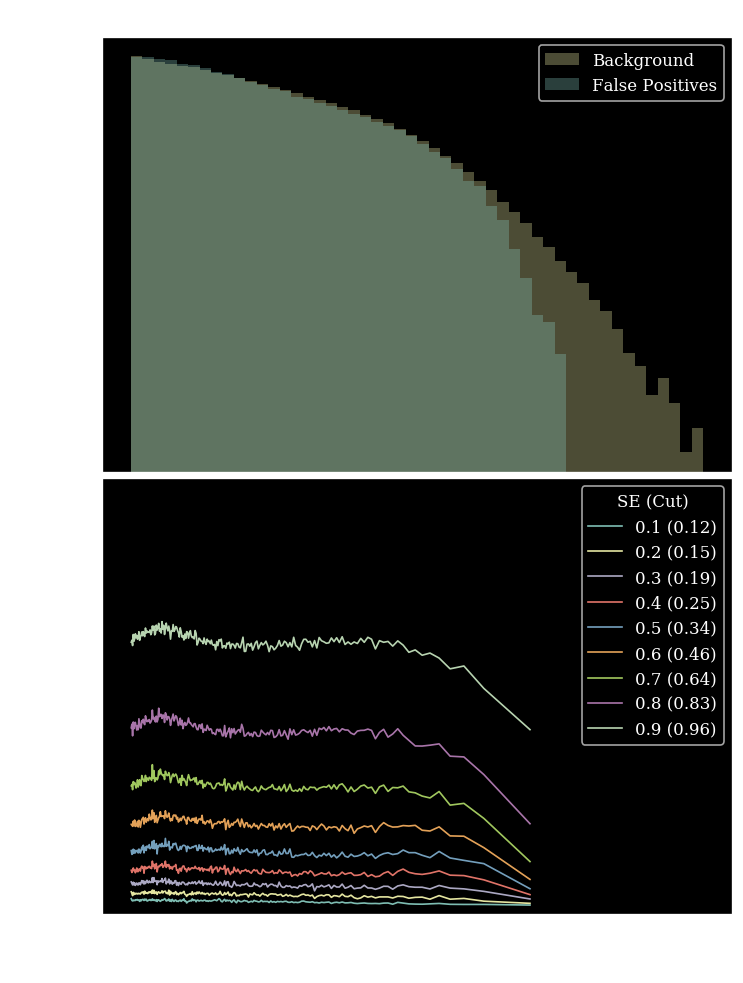

strength 228
Entering Training...
Epoch:0001/0200  (10.6 s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1506.6s)
 Train: loss:1.7012, acc:62% || Val: loss: 0.0913, acc:78%, R50: 7.2027, 1/JSD: 241.6489


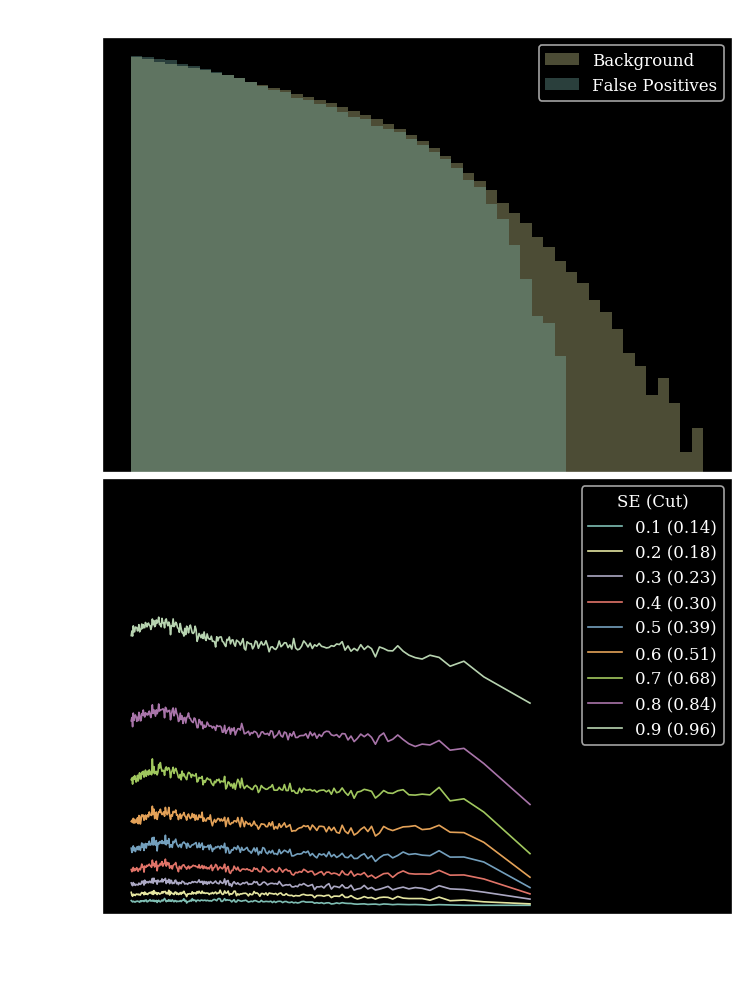

strength 256
Entering Training...
Epoch:0001/0200  (8.3  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1417.5s)
 Train: loss:0.5511, acc:66% || Val: loss: 0.0892, acc:77%, R50: 7.4284, 1/JSD: 185.5583


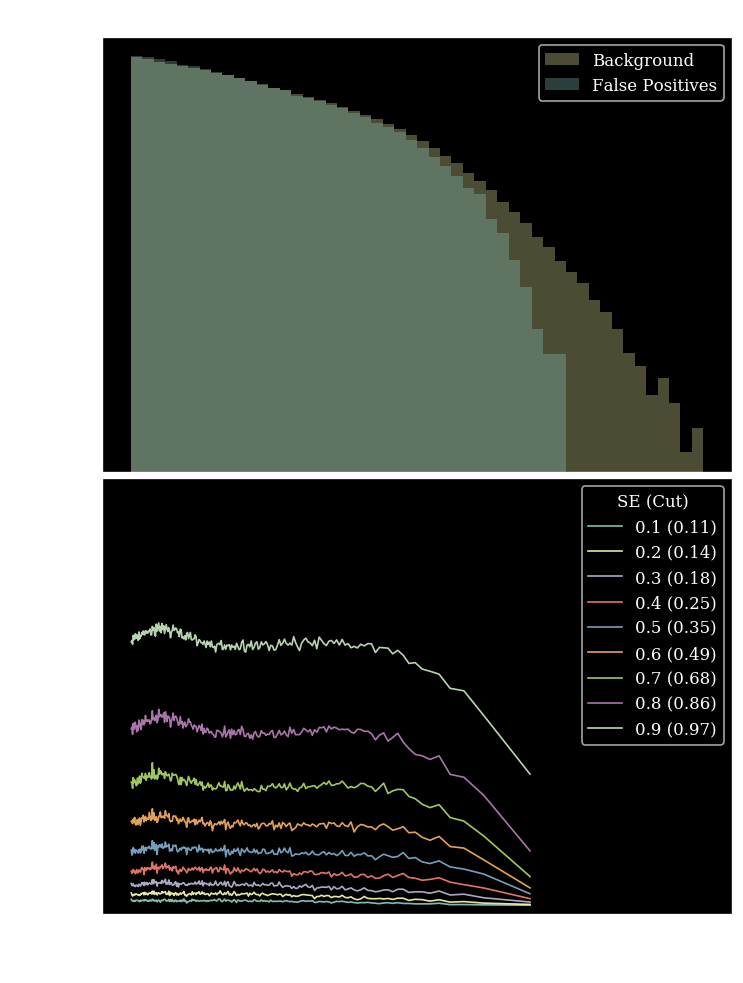

strength 256
Entering Training...
Epoch:0001/0200  (8.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1407.8s)
 Train: loss:0.7536, acc:64% || Val: loss: 0.0908, acc:77%, R50: 7.2878, 1/JSD: 191.9397


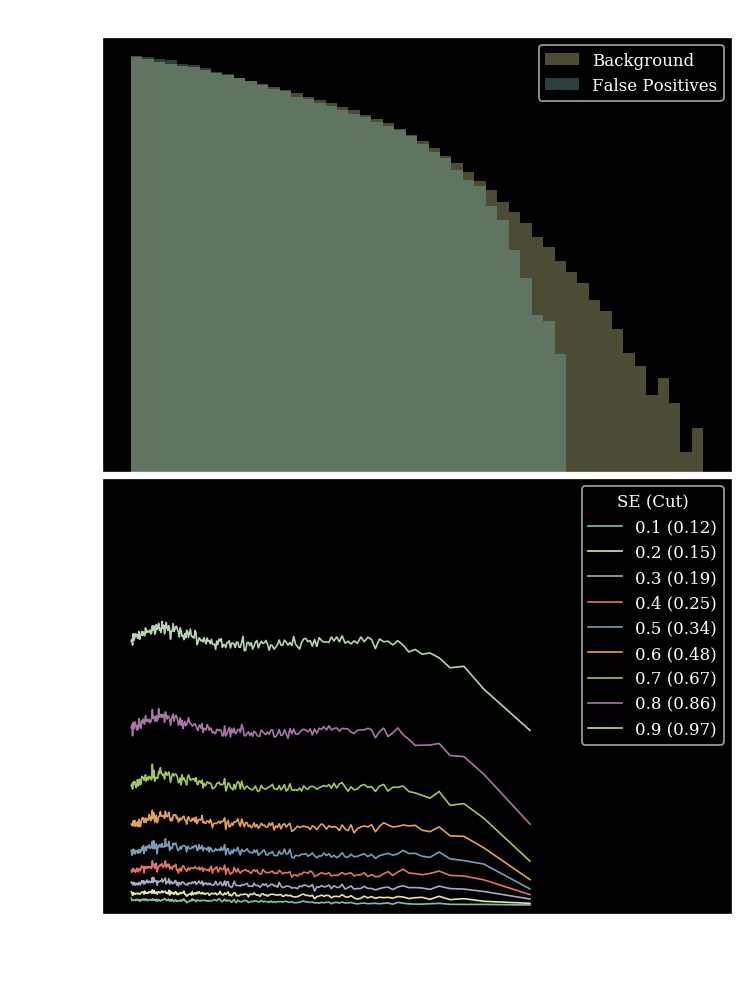

strength 256
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1369.3s)
 Train: loss:1.8292, acc:61% || Val: loss: 0.0938, acc:79%, R50: 7.2231, 1/JSD: 259.9628


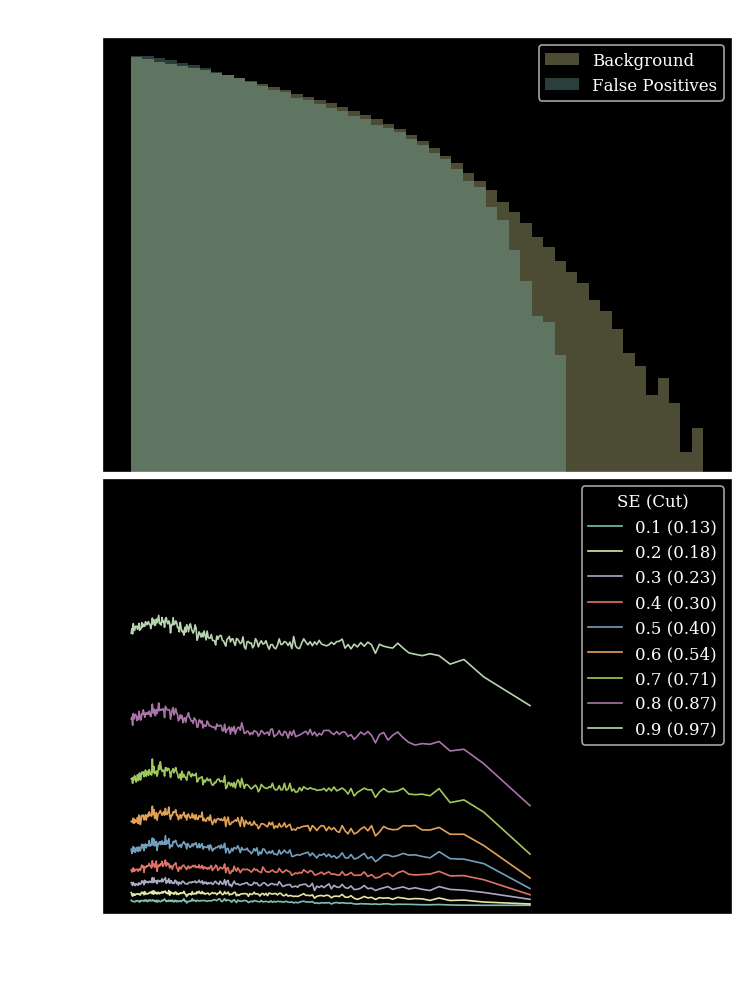

strength 500
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1414.9s)
 Train: loss:0.8404, acc:62% || Val: loss: 0.0989, acc:79%, R50: 7.4101, 1/JSD: 161.8506


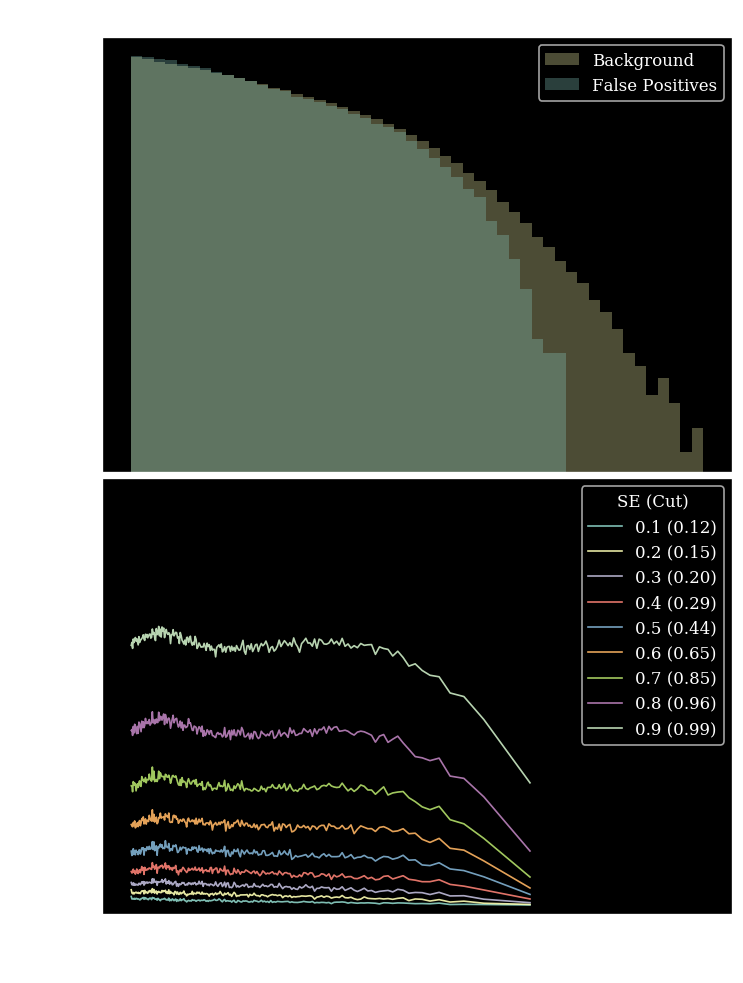

strength 500
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1409.8s)
 Train: loss:1.2184, acc:61% || Val: loss: 0.1013, acc:80%, R50: 7.1677, 1/JSD: 224.4589


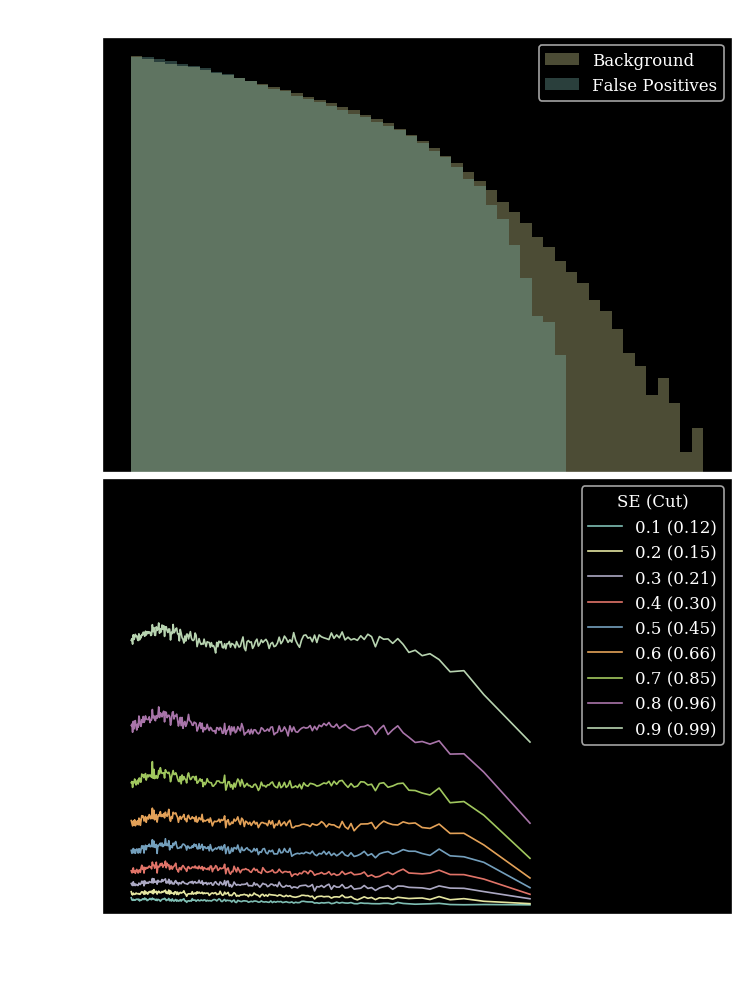

strength 500
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1370.9s)
 Train: loss:2.8053, acc:54% || Val: loss: 0.1108, acc:81%, R50: 6.7658, 1/JSD: 300.8366


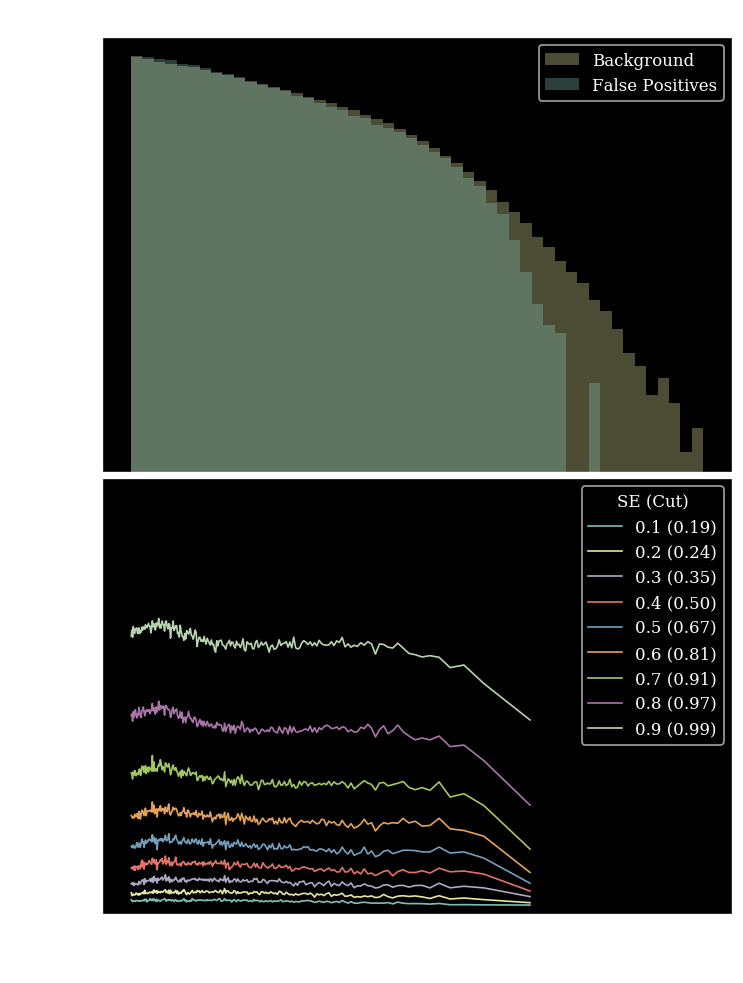

In [53]:
for i,frac in enumerate([150,175,200,228,256,500]):
    for bins in [5,10,32]:
        print("strength",frac)
        metrics_train_L = Metrics()
        metrics_val_L = Metrics(validation=True)

        torch.manual_seed(777)
        model_L = Classifier().to(device)
        optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
        loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=bins,memory=True)
        log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
        model_L.fit(traindataset=traindataset,
                    valdataset=valdataset,
                    optimizer=optimizer,
                    loss=loss,
                    **params,
                    log=log,
                  #scheduler=scheduler,
                  metrics=[metrics_train_L,metrics_val_L])
        model_L.train(False)
        out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,
                       y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
        jsdR50flatstrMem.append(out)

# No MSE loss test 

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1403.6s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 5.7185, 1/JSD: 68.6525


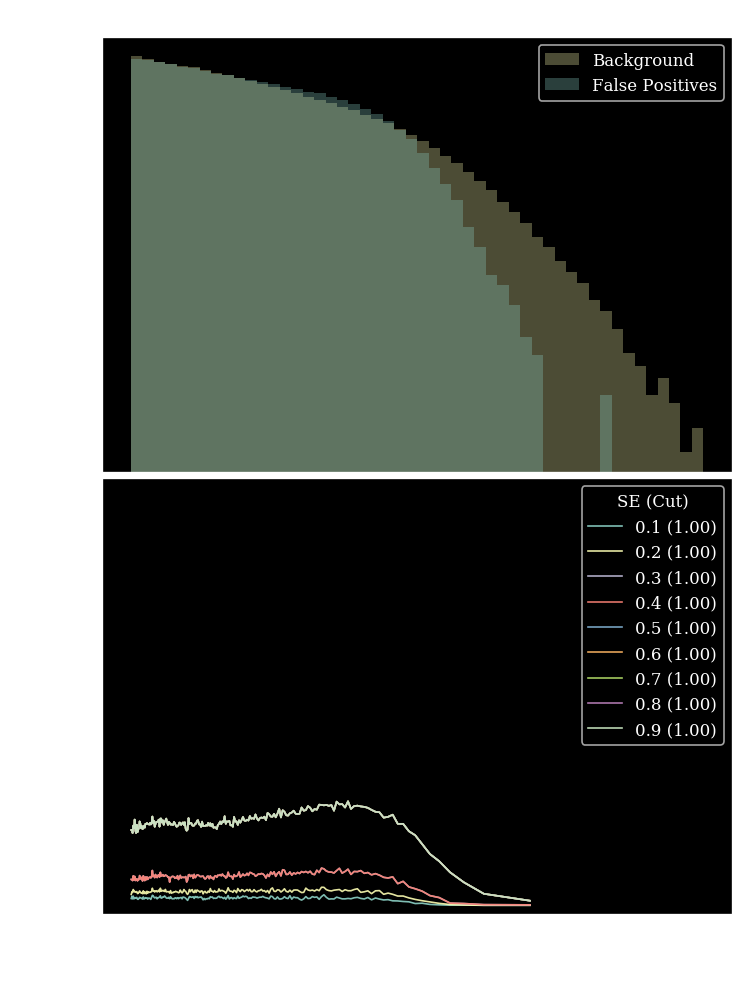

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1393.4s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 7.5453, 1/JSD: 83.8783


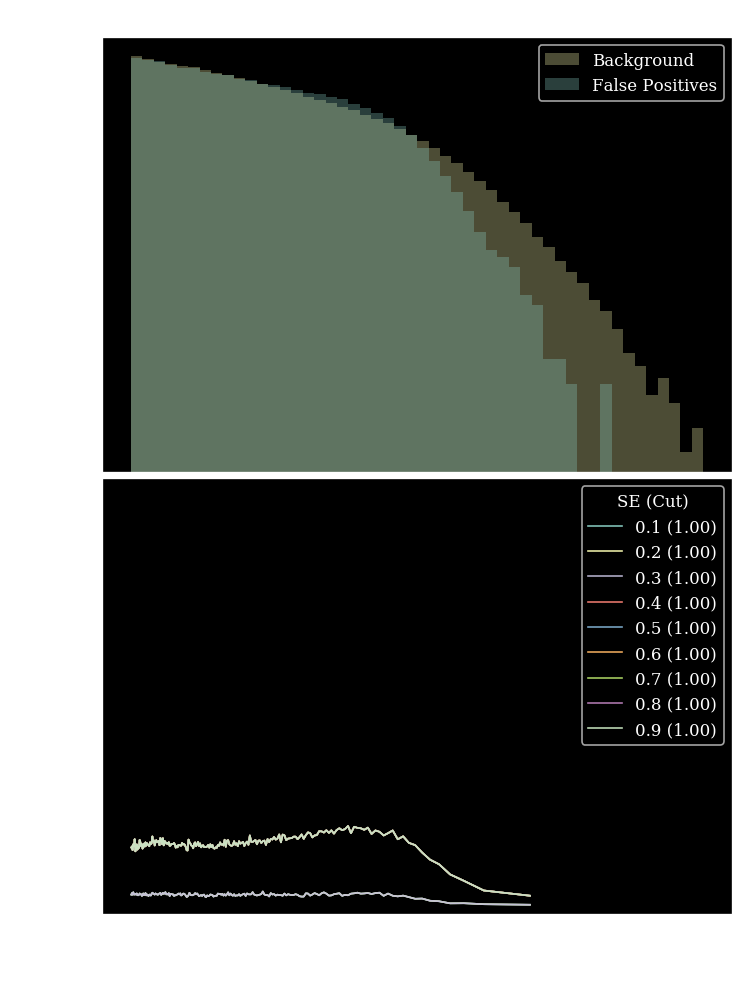

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1356.4s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 11.8415, 1/JSD: 488.8811


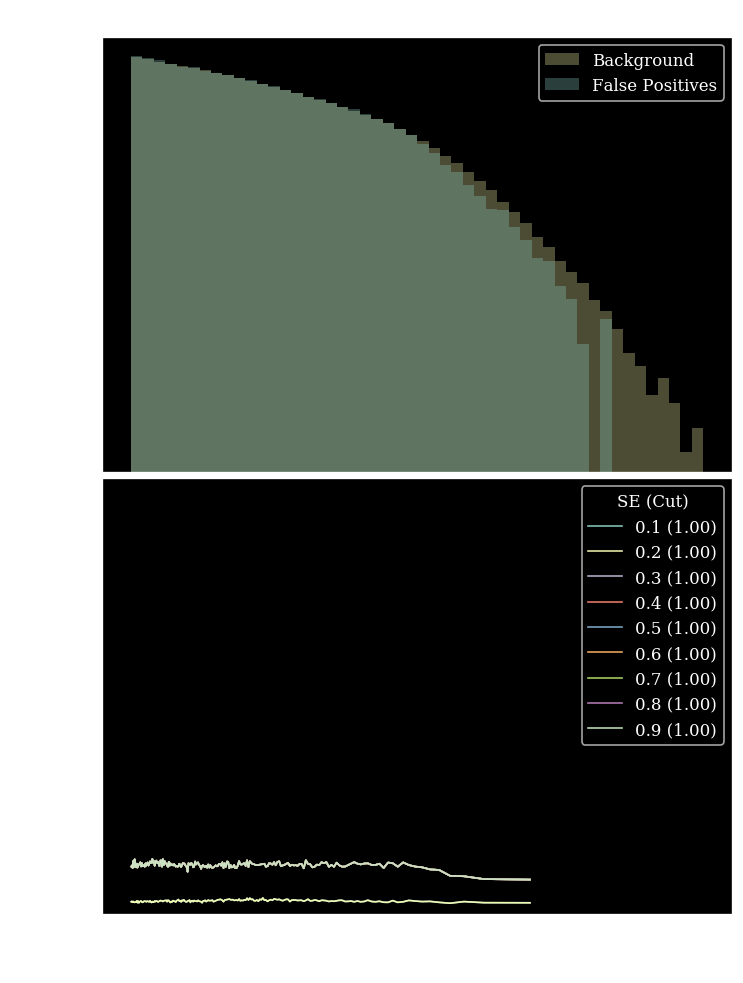

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1299.7s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 15.9598, 1/JSD: 791.1804


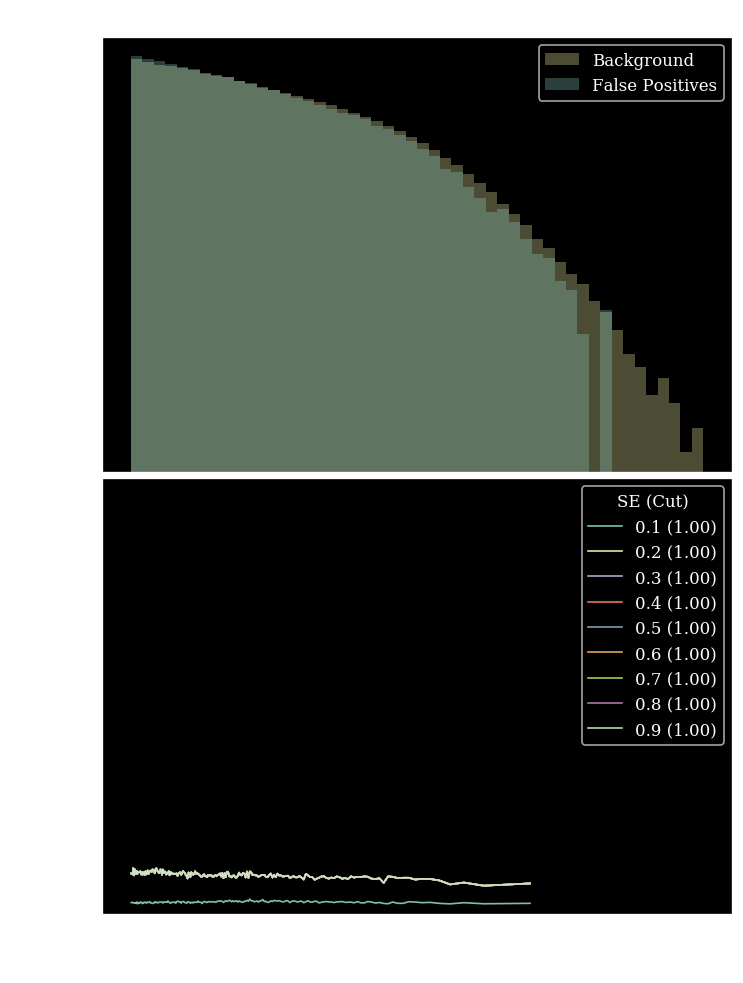

strength 1
Entering Training...
Epoch:0001/0200  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1293.4s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 15.8175, 1/JSD: 892.8402


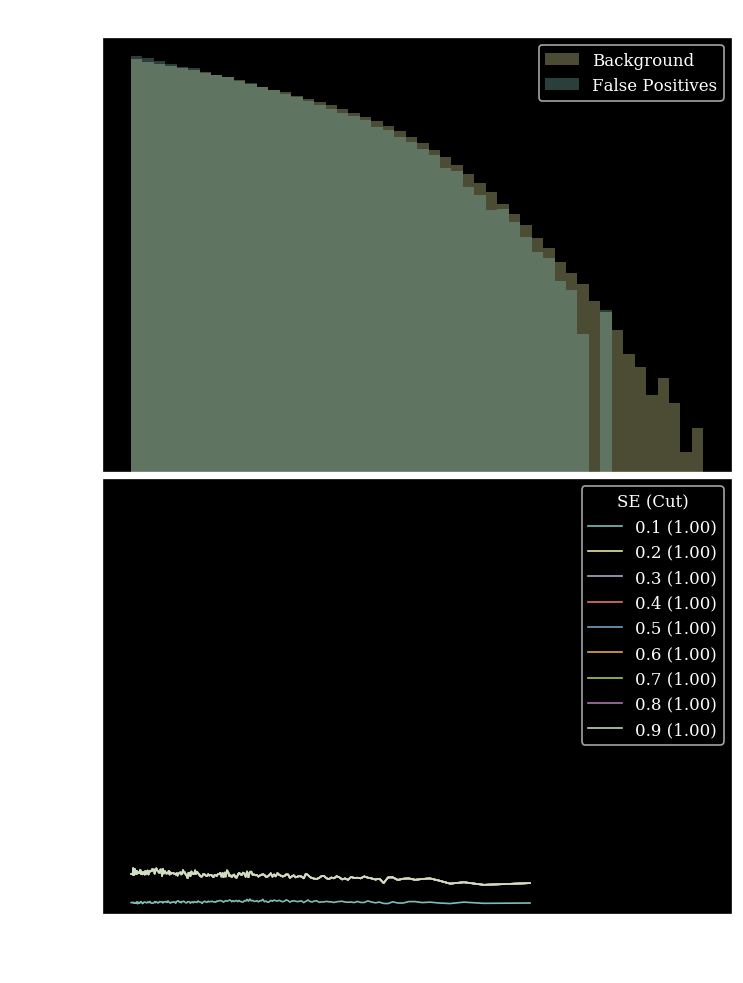

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1294.6s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 21.0890, 1/JSD: 587.3585


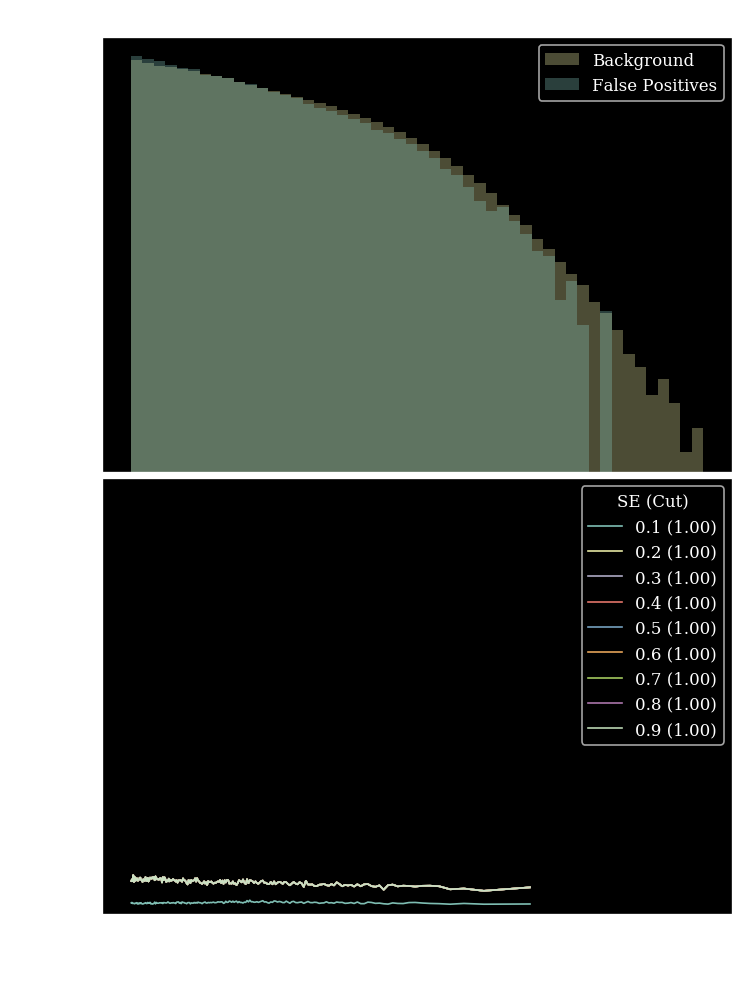

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1405.5s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 19.5209, 1/JSD: 58.6420


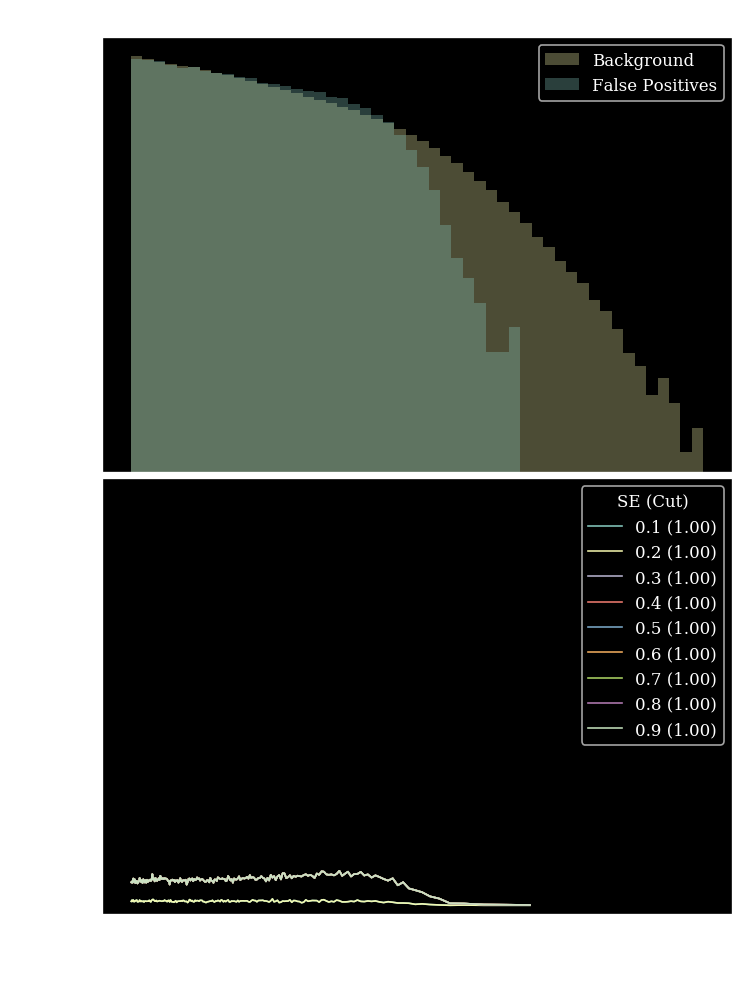

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1396.3s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 33.9646, 1/JSD: 63.0432


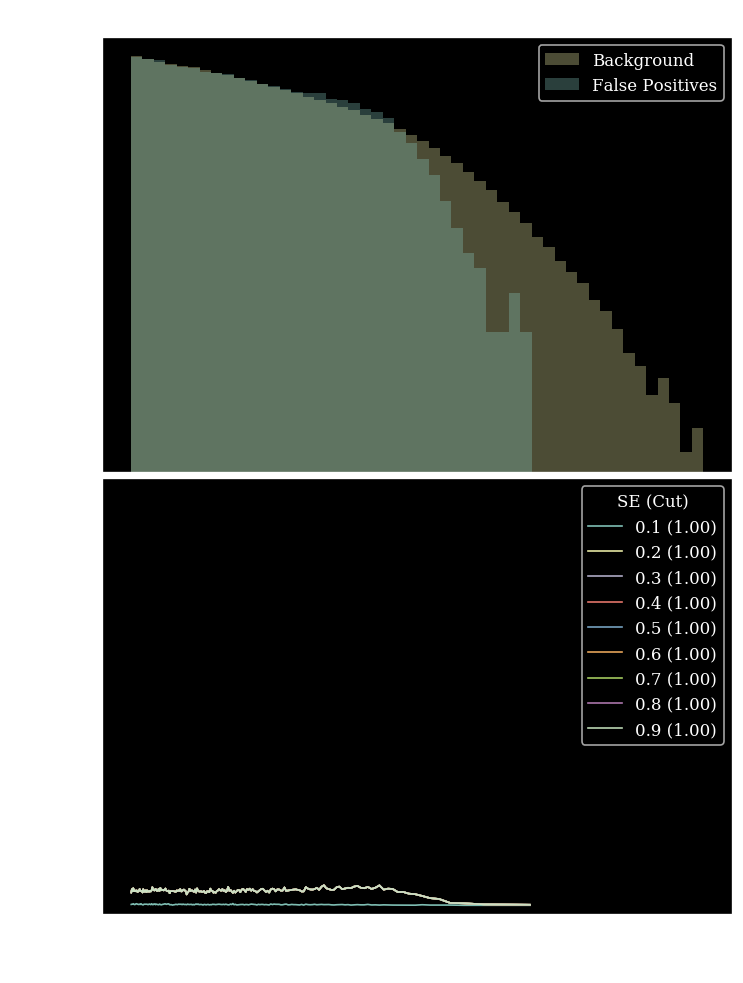

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1358.2s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 76.6017, 1/JSD: 112.5932


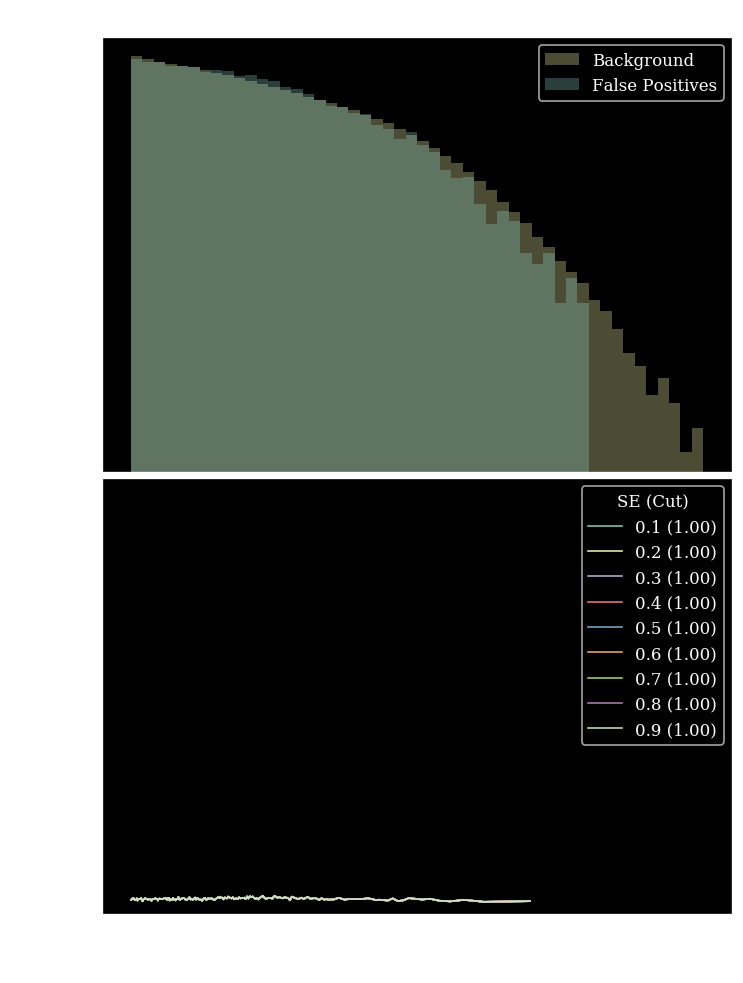

strength 10
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1303.3s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 97.4314, 1/JSD: 111.2758


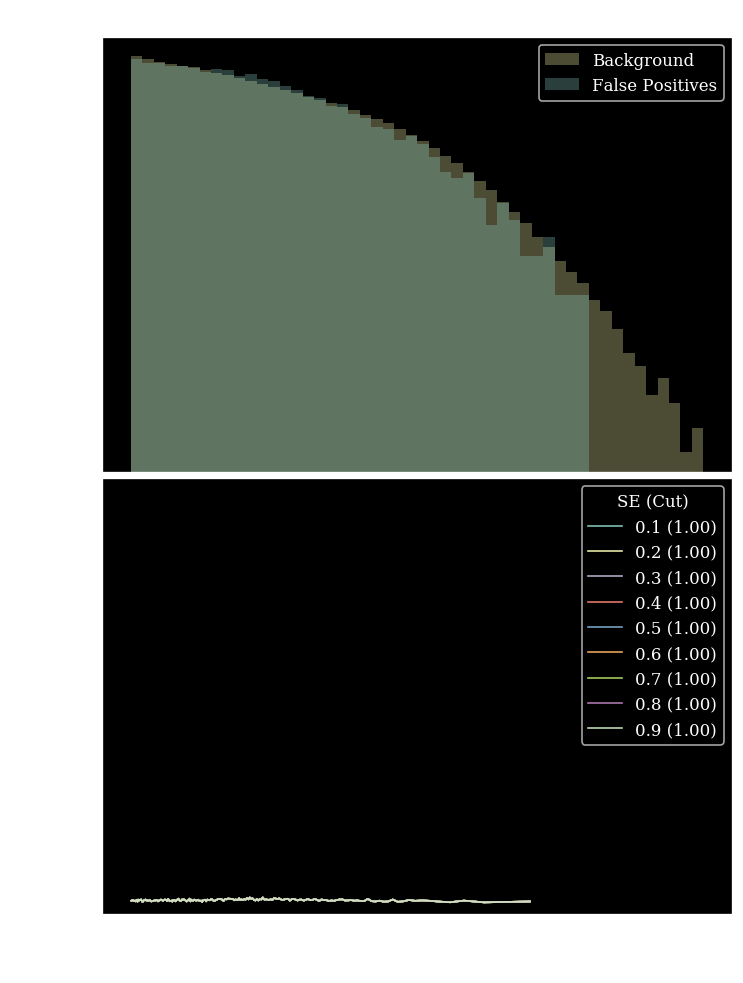

strength 10
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1295.4s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 95.8466, 1/JSD: 111.1498


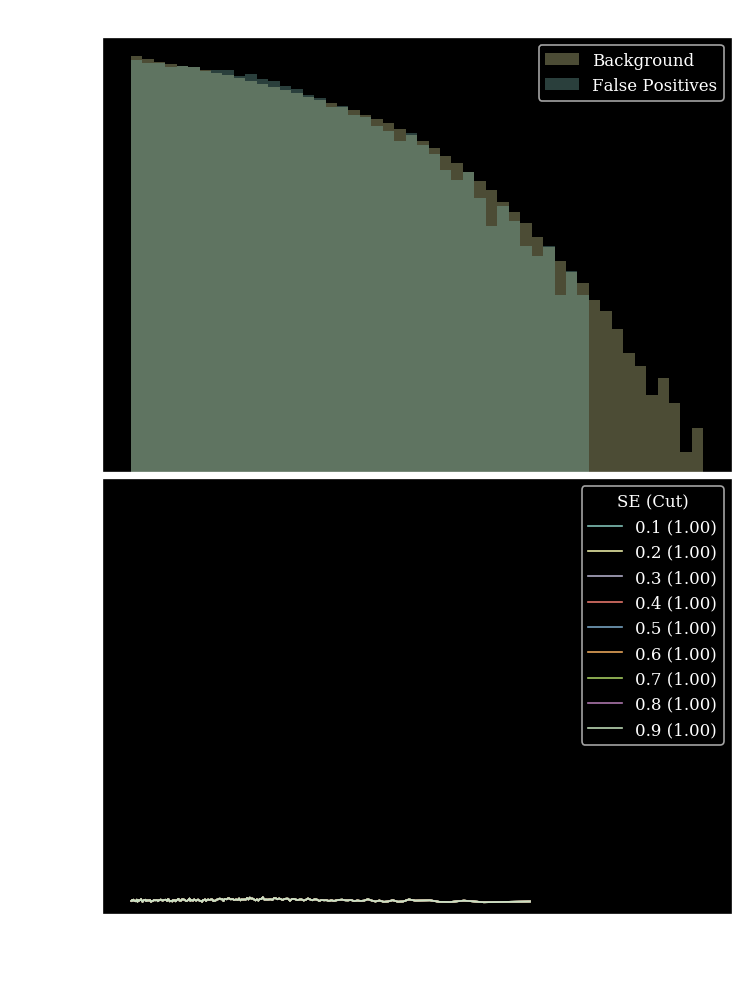

strength 10
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1295.3s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 117.0213, 1/JSD: 110.5765


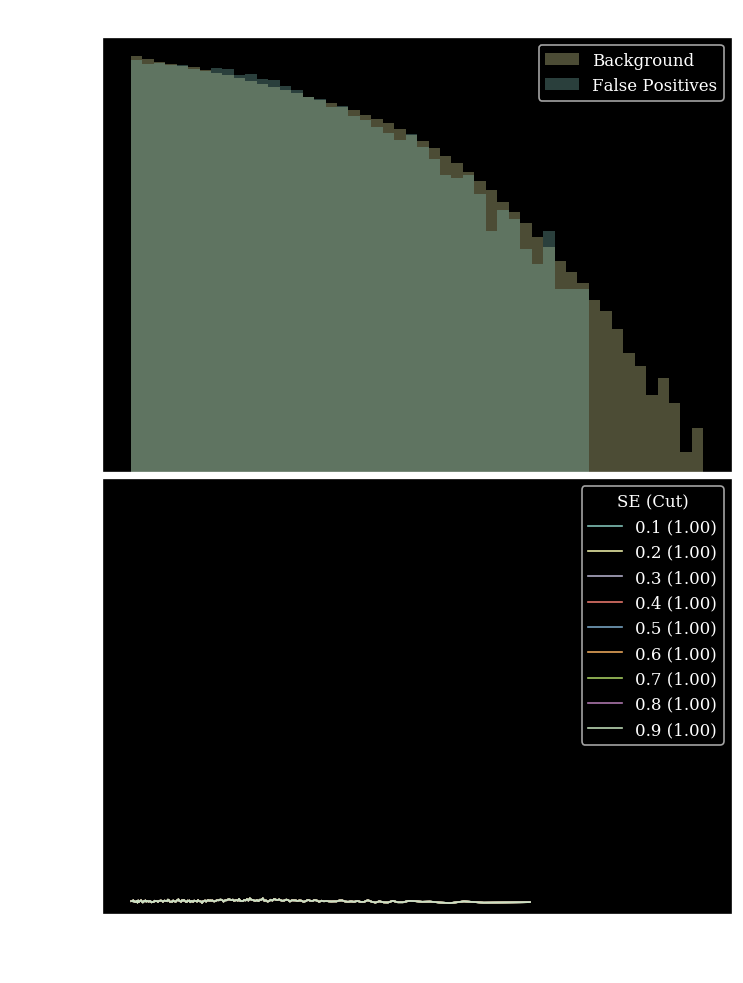

strength 100
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1406.0s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 61.3041, 1/JSD: 44.4013


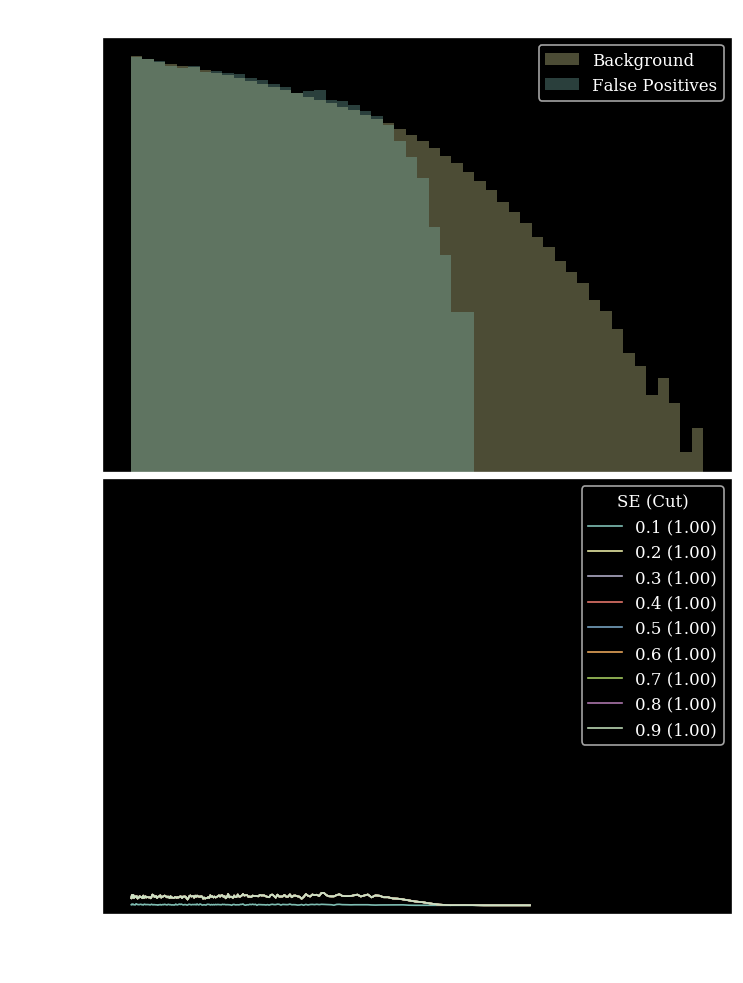

strength 100
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1399.5s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 170.1031, 1/JSD: 59.1068


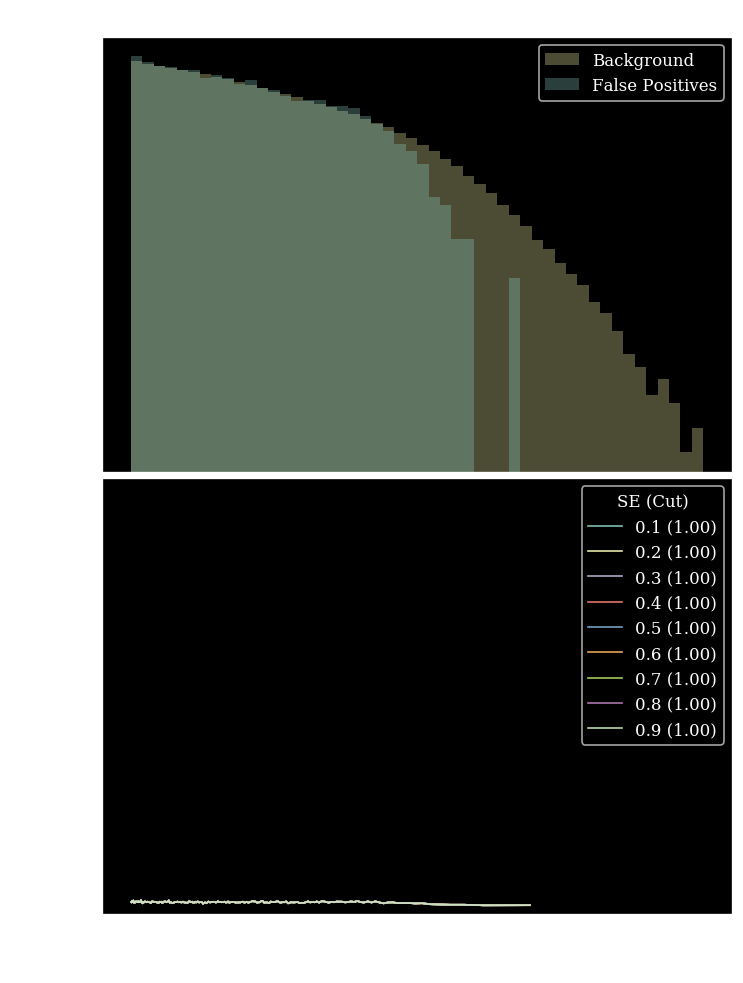

strength 100
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1358.7s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 331.3253, 1/JSD: 31.9242


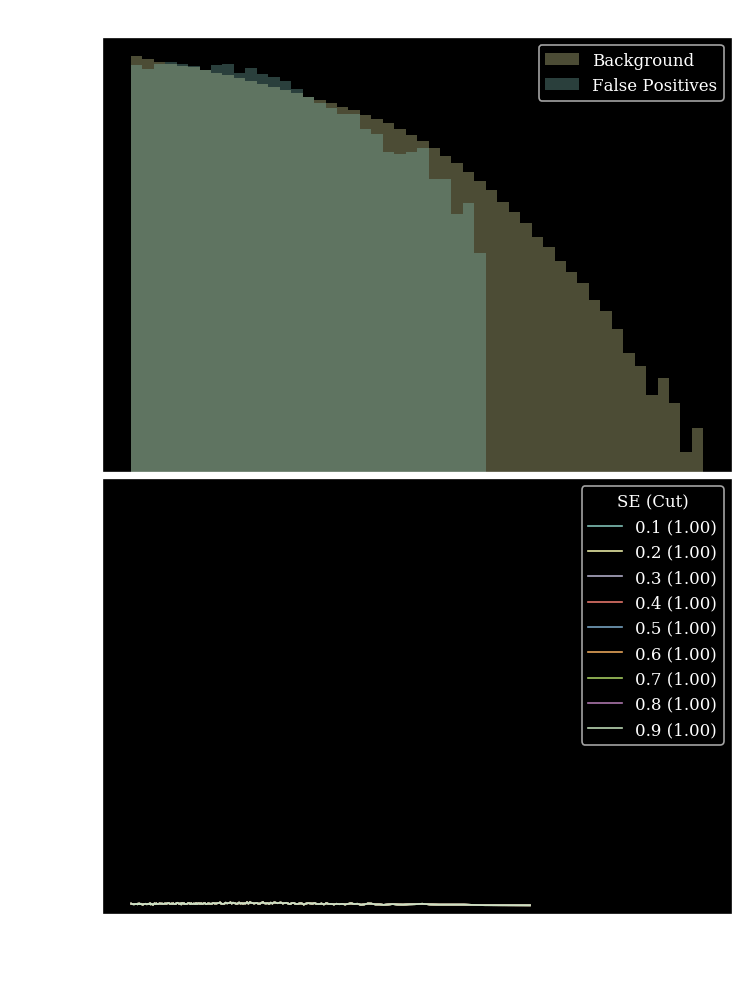

strength 100
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1305.4s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 494.0120, 1/JSD: 26.6841


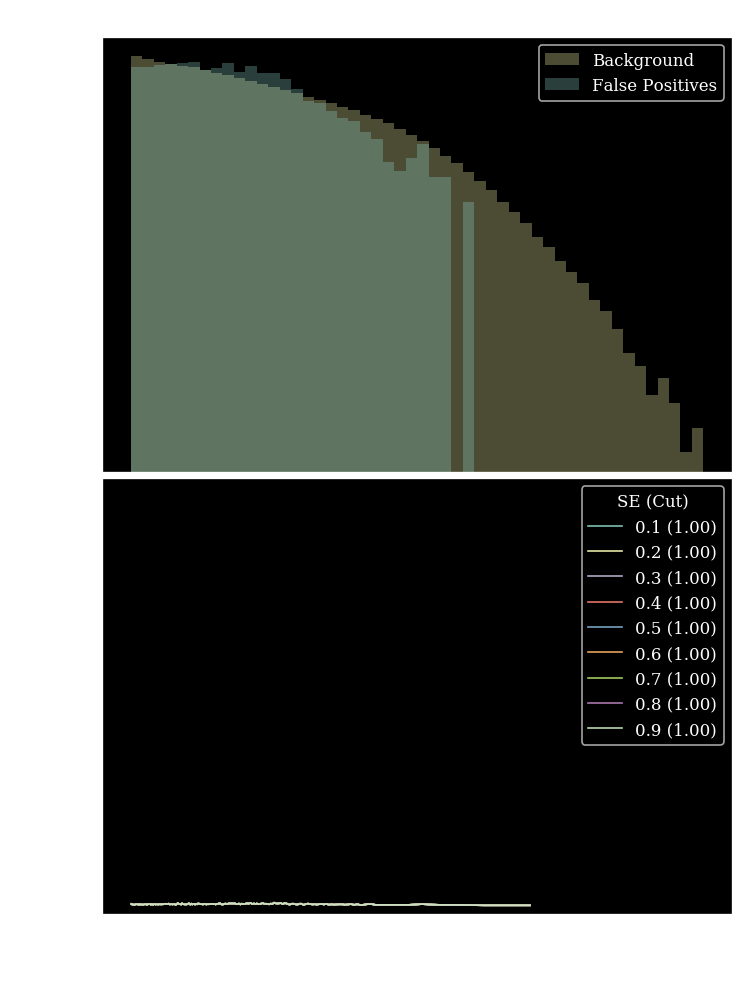

strength 100
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1300.0s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 426.9082, 1/JSD: 26.3948


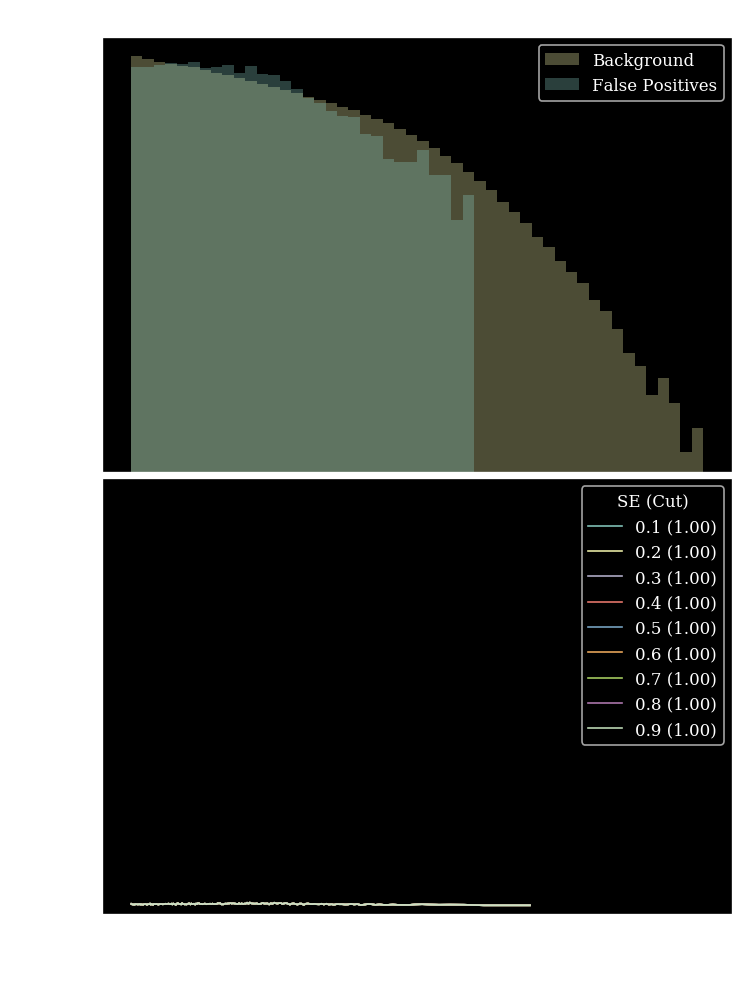

strength 100
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 129.9206
Epoch:0200/0200  (1298.7s)
 Train: loss:0.0000, acc:29% || Val: loss: 0.1951, acc:80%, R50: 564.1026, 1/JSD: 25.6701


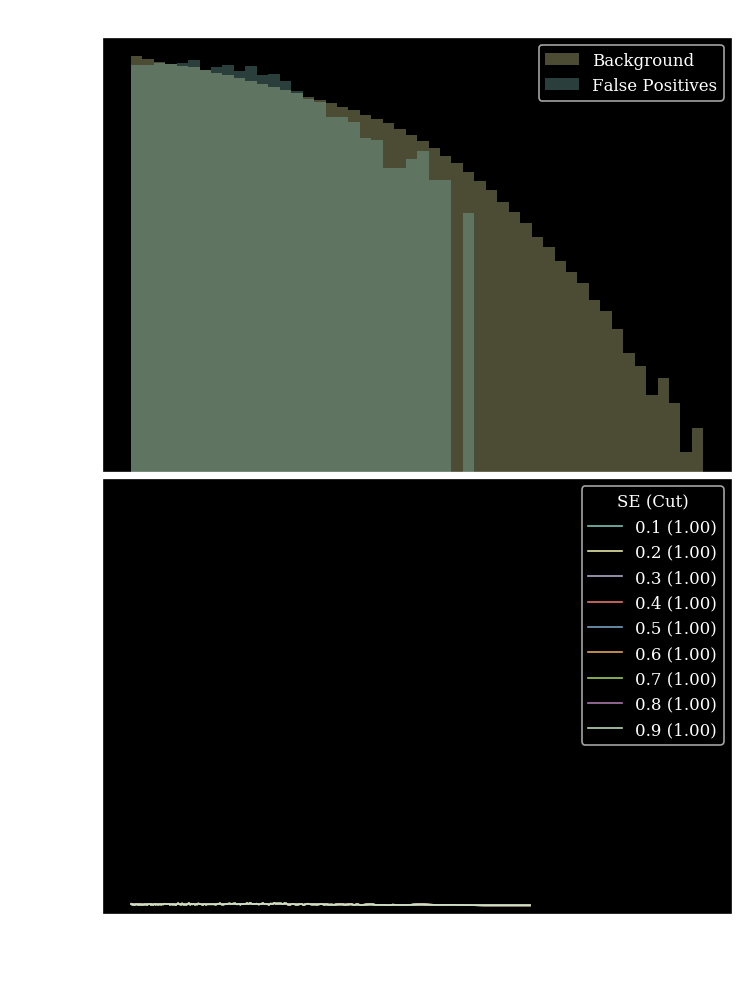

In [39]:
jsdR50flatNA = []
for i,frac in enumerate([1,10,100]):
    for bins in [5,10,32,64,70,100]:
        print("strength",frac)
        metrics_train_L = Metrics()
        metrics_val_L = Metrics(validation=True)

        torch.manual_seed(777)
        model_L = Classifier().to(device)
        optimizer = torch.optim.Adam(model_L.parameters(),lr=1e-4)
        loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=bins,msefrac=0,memory=True)
        log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
        model_L.fit(traindataset=traindataset,
                    valdataset=valdataset,
                    optimizer=optimizer,
                    loss=loss,
                    **params,
                    log=log,
                  #scheduler=scheduler,
                  metrics=[metrics_train_L,metrics_val_L])
        model_L.train(False)
        out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,
                       y=test_labels,x_biased=test[:,0],mbins=200,histbins=50)
        jsdR50flatNA.append(out)

Text(0, 0.5, '1/JSD')

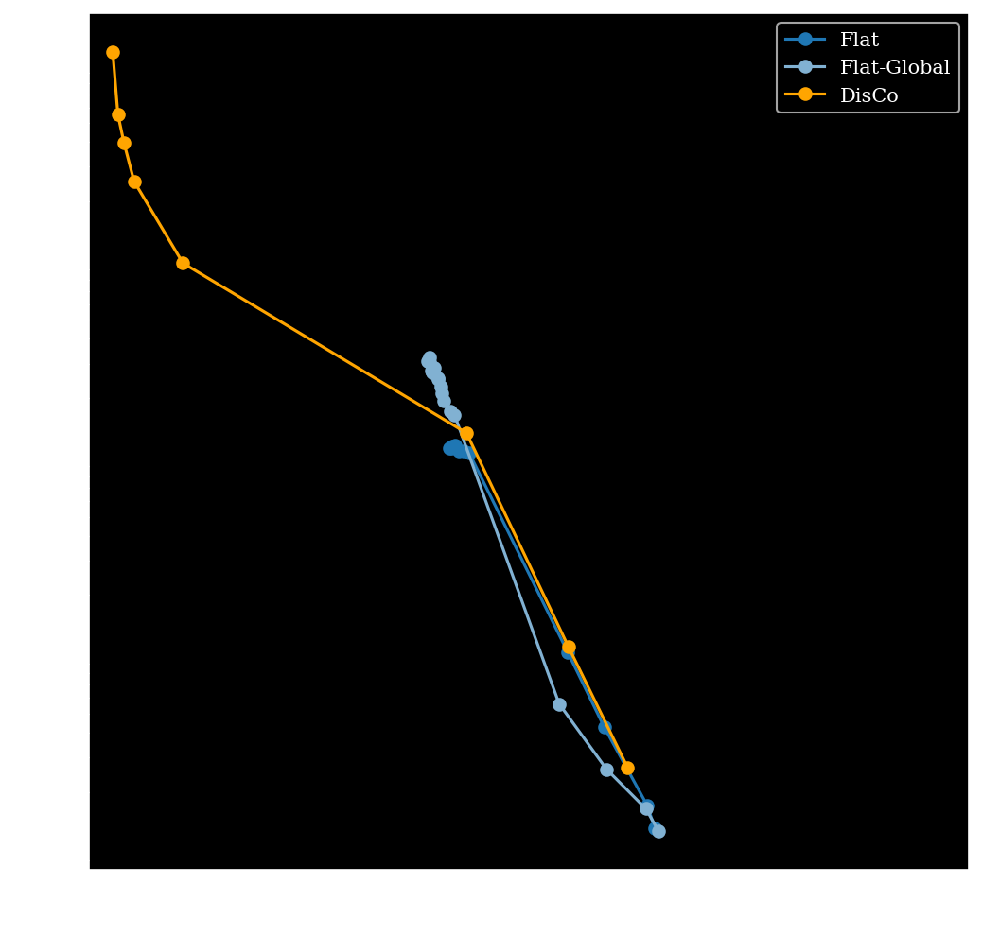

In [57]:
JSD,R50 = zip(*jsdR50flatstr[0::2])
JSD10,R5010 = zip(*jsdR50flatstrMem[0::3])
JSD11,R5011 = zip(*jsdR50flatstrMem[1::3])
JSD12,R5012 = zip(*jsdR50flatstrMem[2::3])
JSD2,R502 = zip(*jsdR50Disco)

JSD3 = np.array([4,25,1.6e3,1.5e3,3e3,8e3])
R503 = [23,15,9.5,8.5,4,3.6]
JSD4 = [4,9,90,300,310,240,740]
R504 = [20,17,11,7.4,4.9,3.7,3.1]
    
fig, ax= plt.subplots(1,1,figsize=(8,8),dpi=150)
plt.errorbar(R50,JSD,fmt='-o',label='Flat',c='tab:blue')
#plt.errorbar(R5010,JSD10,fmt='-o',label='Flat-Global',c='tab:purple')
plt.errorbar(R5011,JSD11,fmt='-o',label='Flat-Global',c='C4')
#plt.errorbar(R5012,JSD12,fmt='-o',label='Flat-Global',c='tab:red')
plt.errorbar(R502,JSD2,fmt='-o',label='DisCo',c='orange')
#plt.errorbar(R503,JSD3,fmt='--',label='DisCo(paper)',c='orange',ls='--')
#plt.errorbar(R504,JSD4,fmt='--',label='Adaboost(paper)',c='C3',ls='--')
plt.xscale('log')
plt.yscale('log')
plt.xlim([1.5,100])
#plt.ylim([1,1.3e5])
plt.legend(loc='upper right')
plt.xlabel('R50')
plt.ylabel('1/JSD')

In [7]:
asdf adsf 

SyntaxError: invalid syntax (<ipython-input-7-52c69e0bce96>, line 1)